<a href="https://colab.research.google.com/github/lidiaxp/Learning-Python/blob/master/UCA_DL_School_Lab_DRL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![UCA](http://univ-cotedazur.fr/fr/university/communication-presse/charte-et-logos/logo/png/uca-logo-ligne)
# **DEEP LEARNING SCHOOL - LAB SESSION**

## **DEEP REINFORCEMENT LEARNING**


#### Lab proposed by:
------------------------------------------------


### Frederic PRECIOSO
Laboratoire I3S - Full Professor at Universite Cote d'Azur

frederic.precioso@unice.fr / 
[linkedin](https://www.linkedin.com/in/frédéric-precioso-3a37389) /
[web page](http://www.i3s.unice.fr/~precioso)


### Miguel Romero, PhD student
Laboratoire I3S - Universite Cote d'Azur

romero@i3s.unice.fr / [web page](http://www.i3s.unice.fr/~romero/)


### Lucile Sassatelli, Associate Professor
Laboratoire I3S - Associate Professor at Universite Cote d'Azur

Junior member of Institut Universitaire de France 

lucile.sassatelli@univ-cotedazur.fr /
[web page](http://www.i3s.unice.fr/~sassatelli/)

# General Introduction

This lab is meant to provide a first experience on using Deep Reinforcement Learning (DRL), for both synthetic and more realistic problems. 

While applications of RL are typically limited to discrete, low-dimensional constraints, recent advances in Deep RL ([DQN for Atari 2600](https://www.nature.com/articles/nature14236), [AlphaGo](https://www.nature.com/articles/nature16961), and more lately [AlphaGo Zero](https://www.nature.com/articles/nature24270)) have demonstrated human-level or super-human performance in complex, high-dimensional spaces.

However, DRL remains an active research domain and, as often experienced, is not yet a plug-and-play optimization tool. In this lab, we also aim at not hidding the difficulty of making DRL work on new problems. We peek into this challenging aspect with a robot navigation task in the last part, and shall comment this aspect along the session.

This lab is organized as follows:
- Part I introduces the underlying concepts of Reinforcement Learning (RL) and introduces the main powerful toolbox used along the lab: OpenAI Gym.
- Part II focuses on learning for toy-example tasks, first with naive RL, then with a reference Deep RL method named Deep Q-Network.
- Part III finally presents a more challenging robotic navigation task, and highlights how current DRL training alone may be insufficient to address complex environments. We end the lab by illustrating the improvement brought to DRL by Imitation Learning, finally opening up to alternate DRL techniques (Imitation Learning, Inverse RL).

# Preliminary Requirements: Installing Dependencies

## Python-RVO2

We need to start by installing the Python-RVO2 library, this library is used later to simulate human behavior for our Crowd-Robot Interaction system.

In [1]:
!git clone https://github.com/sybrenstuvel/Python-RVO2.git
%cd /content/Python-RVO2/
!python setup.py build
!python setup.py install
%cd /content

Cloning into 'Python-RVO2'...
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 172 (delta 1), reused 2 (delta 0), pack-reused 165
Receiving objects: 100% (172/172), 235.97 KiB | 1002.00 KiB/s, done.
Resolving deltas: 100% (84/84), done.
/content/Python-RVO2
Compiling src/rvo2.pyx because it changed.
[1/1] Cythonizing src/rvo2.pyx
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/Python-RVO2/src/rvo2.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
running build
running build_ext
-- The C compiler identification is GNU 7.5.0
-- The CXX compiler identification is GNU 7.5.0
-- Check for working C compiler: /usr/bin/cc
-- Check for working C compiler: /usr/bin/cc -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - don

To finalize the instalation of RVO2 and load it to our environment, use:

In [2]:
from pkg_resources import require
require("pyrvo2")

[pyrvo2 0.0.0 (/usr/local/lib/python3.6/dist-packages/pyrvo2-0.0.0-py3.6-linux-x86_64.egg)]

## CrowdNav

Here are some files necessary to run the code of the robot navigation:

In [3]:
!curl -L "https://docs.google.com/uc?export=download&id=1e-G9TVpyI6uIGWnPUmXxl3xcw-U3I7f4" > crowd_nav.py
!curl -L "https://docs.google.com/uc?export=download&id=18yLljujDO26kmachBp8NAGZVvjPD3O0e" > crowd_nav_train.py
!curl -L "https://docs.google.com/uc?export=download&id=1vhJT4PDaMeFZZnvdWGwFjUKkrROwh8RB" > cadrl_rl_model.pth
!curl -L "https://docs.google.com/uc?export=download&id=1xV5CLLAWtEgbEwGg3LU7KIdkXRcijEQM" > sarl_rl_model.pth

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   388    0   388    0     0    881      0 --:--:-- --:--:-- --:--:--   883
100 31437  100 31437    0     0  36811      0 --:--:-- --:--:-- --:--:--  166k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   388    0   388    0     0   1013      0 --:--:-- --:--:-- --:--:--  1015
100 28324  100 28324    0     0  40232      0 --:--:-- --:--:-- --:--:-- 27.0M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   388    0   388    0     0    783      0 --:--:-- --:--:-- --:--:--   783
100  108k  100  108k    0     0   154k      0 --:--:-- --:--:-- --:--:--  154k
  % Total    % Received % Xferd  Average Speed   Tim

## Virtual Display

Let's install some dependencies to start a virtual display. Needed to show the animated results in Google Colab, in your local experiments you can use the function env.render() to display the results without needing these packages.

In [8]:
!pip install xvfbwrapper
!apt-get install -y xvfb python-opengl > /dev/null 2>&1
!pip install gym==0.13.1 pyvirtualdisplay > /dev/null 2>&1
# !pip install gym==0.13.1
!pip install pyglet==1.3.2

  Created wheel for xvfbwrapper: filename=xvfbwrapper-0.2.9-cp36-none-any.whl size=5010 sha256=463f7b85f76f43d0a6e517beb422a0ebbb95d51bc1fa87fb68974ab6414e0394
  Stored in directory: /root/.cache/pip/wheels/10/f2/61/cacfaf84b352c223761ea8d19616e3b5ac5c27364da72863f0
Successfully built xvfbwrapper


We can now start a display that will be used for the future plots.

In [9]:
from pyvirtualdisplay import Display
display = Display(visible=0, size=(400, 300))
display.start()

EasyProcessError: ignored

# Part I: Reinforcement Learning framework and useful tools

The reference book in RL is that of Sutton and Barto [1]. The material below is assembled from three main web sources [2-4].

Sources:  
[1] Richard S. Sutton and Andrew G. Barto, "Reinforcement Learning: An Introduction", <a href='http://incompleteideas.net/book/the-book.html'>online</a> and continuously updated  
[2] Lilian Weng (OpenAI), "A long peek into RL",  blog post, available <a href='https://lilianweng.github.io/lil-log/2018/02/19/a-long-peek-into-reinforcement-learning.html'>here</a>  
[3] Keon Kim's blog, "Deep Q-Learning with Keras and Gym", available <a href='https://keon.io/deep-q-learning/'>here</a>  
[4] OpenAI, "OpenAI Gym toolkit", available <a href='https://gym.openai.com/docs/'>here</a>  

**Reinforcement Learning (RL) is a branch of machine learning aimed at teaching an agent (or several) to react to a dynamic environment so as to maximize some return.**  
Just like how we learn to ride a bicycle, this paradigm learns by trial and error.

<!-- ![Reinforcement Learning Diagram](https://lh3.google.com/u/0/d/1Og6jKmyOgv3n0IZxY7lzG_-tZsQY-8Fj=w1855-h982-iv1) -->

<img src="https://lh3.google.com/u/0/d/1Og6jKmyOgv3n0IZxY7lzG_-tZsQY-8Fj=w1855-h982-iv2" width="400">

An **agent** has to act in an unknown **environment** to collect highest **rewards**. The agent has to wisely select **actions** by interacting with the environment so as to maximize cumulative rewards.  

Examples are a bot playing a game to achieve high scores, a robot trying to complete physical tasks with physical items, or a system trying to adapt to the human'n behavior.






## I.1. Formal description

**Let us now formally define the key elements of an RL framework: environment, states, actions, reward, episode, policy and value function.**

The agent is acting in an **environment**. The agent can stay in one of many **states** ($s \in S$) of the environment, and choose to take one of many **actions** ($a \in A$) to switch from one state to another. Which state the agent will arrive is decided by transition probabilities between states ($P$). Once an action is taken, the environment delivers a **reward** ($r \in R$) as feedback.

<img src="https://lh3.google.com/u/0/d/16J_V0aQxRsrEvltLhi-JCygF1PDZFnDF=w1924-h946-iv3" width="400">

The agent's **policy** $\pi(s)$ provides the guideline on what is the optimal action to take in a certain state $s$ with the goal to maximize the total rewards. Each state is associated with a **value** function $V_{\pi}(s)$ predicting the expected amount of future rewards we are able to receive in this state by acting according to policy $\pi(.)$. **Note that $\pi(.)$ does not only impact the rewards, but also importantly the succession of states the environment goes through from the agent's actions.** Both policy and value function are what we try to learn in reinforcement learning.

**The formal objective of RL is finding $\pi(.)$ such that:**

$\boxed{\pi^*(.) = \arg\max_{\pi} \mathbb{E}_{s\in\mathcal{S},a\sim \pi(.)} \Big[\sum_{t=0}^\infty \gamma^t r_t\Big]}$

In the sequel, we will denote the cumulated discounted reward from time $t$ as:

$G_t = \sum_{k=0}^{\infty} \gamma^k r_{t+k+1}$

*Side note*: The discounting factor $\gamma \in [0, 1]$ penalizes the rewards in the future, because:
- The future rewards may have higher uncertainty; e.g. stock market.
- The future rewards do not provide immediate benefits; e.g. As human beings, we might prefer to have fun today rather than 5 years later.
- Discounting provides mathematical convenience: we don't need to track future steps forever to compute return.
- We don't need to worry about the infinite loops in the state transition graph.


The interaction between the agent and the environment involves a sequence of actions, observed rewards and observed environmental states over time, $t = 1, 2, ..., T$. During the process, the agent accumulates the knowledge about the environment, learns the optimal policy, and makes decisions on which action to take next so as to efficiently learn the best policy. Let us label the state, action, and reward at time step $t$ as $S_t$, $A_t$ and $R_t$, respectively. Thus the interaction sequence is fully described by one **episode** (also known as "trajectory") and the sequence ends at the terminal state $S_T$:

$S_1, A_1, R_2, S_2, A_2, ..., S_T$


<img src="https://lh3.google.com/u/0/d/1KKUEmNQPwa2jtFEsn2jTrc2O1Z95aL-4=w1924-h696-iv2">

### Model: Transition and Reward

The model is a descriptor of the environment. If the environment has the Markov property, i.e., the future state only depends on the current state, not the history:

$\mathbb{P} [S_{t+1} \vert S_1, \dots, S_t] = \mathbb{P}[ S_{t+1} \vert S_t ]$

then the environment can be entirely described by the **transition probability**, that is the probability of landing into state $s'$ and getting instantaneous reward $r$ from taking action $a$ in previous state $s$:

$P(s', r|s, a) = \mathbb{P}[S_{t+1}=s', R_{t+1}=r|S_t=s, A_t=a]$

From this distribution, several useful distributions can be obtained as marginals, in particular
- $\mathbb{P}[G_t \vert S_t = s, A_t = a]$: the distribution of rewards conditionnally to state $s$ and action $a$ taken when in $s$,
- $P_{ss'}^a$: the probability of transitioning from $s$ to $s'$ given action $a$ has been taken when in $s$.

We may or may not know the model and this differentiates two circumstances:
- *Know the model*: planning with perfect information. When we fully know the environment, we can find the optimal solution by Dynamic Programming (DP). Do you still remember “traveling salesmen problem”? This is not the focus of this lab.
- *Does not know the model*: learning with incomplete information; do model-free RL or try to learn the model explicitly as part of the algorithm (do model-based RL).The following content serves the scenarios when the model is unknown. We focus on model-free RL in this lab.


### Value Function

The concept of **state-value function** is crucial in RL: $V_{\pi}(s')$ predicts the cumulated discounted sum of future reward, also known as **return**, starting from state $s'$ and given we follow policy $\pi(.)$:

$V_{\pi}(s') = \mathbb{E}_{\pi}[G_{t+1} \vert S_{t+1} = s']$

When choosing the action, the **state-action value function** (also known as “Q-value” or "Q-function", Q standing for “Quality”) can be considered:

$Q_{\pi}(s, a) = \mathbb{E}_{\pi}[G_t \vert S_t = s, A_t = a]$

It specifies which action shall be chosen at time $t$ in state $s$ to maximize $G_t$. 

$Q_{\pi}(s, a)$ can be handily expressed from $V_{\pi} (s')$, which corresponds to Bellman equations:
$Q_{\pi}(s, a) = R(s, a) + \gamma \sum_{s' \in \mathcal{S}} P_{ss'}^a V_{\pi} (s')$

### Policy

The agent's behavior is described by policy function $\pi(.)$, indicating which action to take in state $s$. It is a mapping from state $s$ to action $a$ and can be either deterministic or stochastic:

* Deterministic: $\pi(s)=a$

* Stochastic: $\pi(a \vert s) = \mathbb{P}_\pi [A=a \vert S=s]$

## I.2. Implementation basics with OpenAI Gym

 The code of this lab builds on Pytorch and OpenAI Gym [4]. 
 Gym is a toolkit for developing and comparing reinforcement learning algorithms.
 It provides a set of physical simulation environments, games, and robot simulators that we can play with and design reinforcement learning agents for.

### Environment: the `CartPole-v0` example

In Part I and Part II of this lab, we consider the `CartPole-v0` environment.

The below animation illustrates this environment, where  a pole is attached by an un-actuated joint to a cart, which moves along a frictionless track. The pendulum starts upright, and the goal is to prevent it from falling over by pushing the cart left or right at each step.
A complete description can be found <a href='https://github.com/openai/gym/wiki/CartPole-v0'>here</a>.

![alt text](https://pytorch.org/tutorials/_images/cartpole1.gif)



An environment object can be initialized by `gym.make("{environment name}")`.  
Side note: If you would like to see some other environments in action, try replacing `CartPole-v0`  with something like `MountainCar-v0` or `MsPacman-v0` in the code below.

Below is a bare minimum example of getting something running. This runs an episode of the `CartPole-v0` environment for 100 timesteps, rendering the environment at each step.

In [ ]:
################################################################################
# Code to create the environment and perform one step by reacting to an action chosen at random
################################################################################

import gym

env = gym.make('CartPole-v0')
env.reset()

episode_length = 100
frames = []
for _ in range(episode_length):
  frames.append(env.render(mode='rgb_array')) # replace with env.render() for rendering in local machine
  env.step(env.action_space.sample())
env.close()

/usr/local/lib/python3.6/dist-packages/gym/logger.py:30: UserWarning: WARN: You are calling 'step()' even though this environment has already returned done = True. You should always call 'reset()' once you receive 'done = True' -- any further steps are undefined behavior.
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


To display the resulting successive environment's states in Colab, we need the code below. On a local machine, calling  `env.render()` instead of `env.render(mode='rgb_array')` suffices.

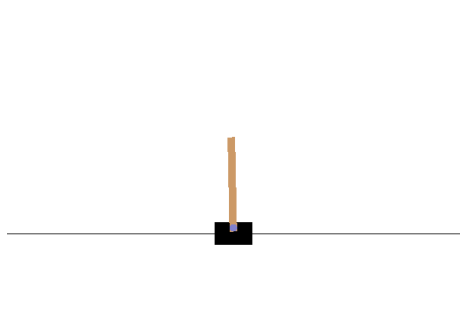

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML

plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())

### Collecting Observations

You may have obtained some warnings about calling `step()` even though this environment has already returned `done = True`. This is due to the environment having reached the terminal state before the pre-set episode length (100 steps).

To interact more efficiently with the environment, detecting terminal states to re-start simulation but more importantly to start learning which action is best taking at each step, we must collect data on how each action impacts the environment, depending on its state.

This is fortunately returned as 4 outputs by the environment's `step` method:

* `observation`(object): an environment-specific object representing your observation of the environment. For example, pixel data from a camera, joint angles and joint velocities of a robot, or the board state in a board game.

* `reward`(float): amount of reward achieved by the previous action. The scale varies between environments, but the goal is always to increase your total reward.

* `done`(boolean): whether it's time to `reset` the environment again. Most (but not all) tasks are divided up into well-defined episodes, and `done` being `True` indicates the episode has terminated. (For example, perhaps the pole tipped too far, or you lost your last life.)

* `info`(dict): diagnostic information useful for debugging. It can sometimes be useful for learning (for example, it might contain the raw probabilities behind the environment's last state change). However, official evaluations of your agent are not allowed to use this for learning.

To summarize, we interact with the environment through two major api calls:

**`ob_next, reward, done, info = env.step(action)`**

* Applies one action in the `env` which should be compatible with `env.action_space`.
* Gets back the new observation `ob_next(env.observation_space)`, a reward (float), a `done` flag (bool), and other meta information (dict). If `done=True`, the episode is complete and we should reset the `env` to restart.

**`ob = env.reset()`**

* Resets the process to the original setting.
* Returns the initial observation.

This is just an implementation of the classic "agent-environment loop". Each timestep, the agent chooses an `action`, and the environment returns an `observation` and a `reward`.

![Texte alternatif…](https://gym.openai.com/assets/docs/aeloop-138c89d44114492fd02822303e6b4b07213010bb14ca5856d2d49d6b62d88e53.svg)

A more proper way of writing the previous code by collecting and considering the resulting state and reward after each step:

In [ ]:
number_of_episodes = 20

for episode_index in range(number_of_episodes):
  observation = env.reset()
  rwd = 0
  done = 0
  step_index = 0
  while not done:
    action = env.action_space.sample()
    observation, reward, done, info = env.step(action)
    rwd += reward
    step_index += 1
    if done:
      print ("Episode finished after {} timesteps".format(step_index+1))
      break
  print(episode_index, step_index, rwd)

Episode finished after 23 timesteps
0 22 22.0
Episode finished after 16 timesteps
1 15 15.0
Episode finished after 25 timesteps
2 24 24.0
Episode finished after 12 timesteps
3 11 11.0
Episode finished after 12 timesteps
4 11 11.0
Episode finished after 64 timesteps
5 63 63.0
Episode finished after 24 timesteps
6 23 23.0
Episode finished after 42 timesteps
7 41 41.0
Episode finished after 31 timesteps
8 30 30.0
Episode finished after 19 timesteps
9 18 18.0
Episode finished after 31 timesteps
10 30 30.0
Episode finished after 37 timesteps
11 36 36.0
Episode finished after 37 timesteps
12 36 36.0
Episode finished after 13 timesteps
13 12 12.0
Episode finished after 13 timesteps
14 12 12.0
Episode finished after 16 timesteps
15 15 15.0
Episode finished after 15 timesteps
16 14 14.0
Episode finished after 22 timesteps
17 21 21.0
Episode finished after 15 timesteps
18 14 14.0
Episode finished after 18 timesteps
19 17 17.0


In [ ]:
episode_length = 100
number_of_episodes = 20

frames = []
for episode_index in range(number_of_episodes):
  observation = env.reset()
  rwd = 0
  for step_index in range(episode_length):
    frames.append(env.render(mode='rgb_array'))
    print(observation)
    action = env.action_space.sample()
    observation, reward, done, info = env.step(action)
    rwd += reward
    if done:
      print ("Episode finished after {} timesteps".format(step_index+1))
      break
  print(episode_index, step_index, rwd)
env.close()

[ 0.01467966 -0.01831838  0.02888564 -0.00438796]
[ 0.01431329  0.17637766  0.02879788 -0.28781899]
[ 0.01784084 -0.01914288  0.0230415   0.01380562]
[ 0.01745799 -0.21458757  0.02331761  0.31366844]
[ 0.01316624 -0.01980542  0.02959098  0.02842939]
[ 0.01277013  0.17487996  0.03015957 -0.25477235]
[ 0.01626773  0.3695586   0.02506412 -0.53779194]
[ 0.0236589   0.56431936  0.01430828 -0.82247325]
[ 0.03494529  0.36900461 -0.00214118 -0.52532461]
[ 0.04232538  0.17391285 -0.01264767 -0.23331716]
[ 0.04580363 -0.02102612 -0.01731402  0.0553496 ]
[ 0.04538311 -0.21589559 -0.01620703  0.34251993]
[ 0.0410652  -0.41078326 -0.00935663  0.63004838]
[ 0.03284954 -0.21553201  0.00324434  0.33443351]
[ 0.0285389  -0.02045638  0.00993301  0.04277544]
[ 0.02812977 -0.21571935  0.01078852  0.3385757 ]
[ 0.02381538 -0.41099314  0.01756003  0.63464111]
[ 0.01559552 -0.60635557  0.03025286  0.93280196]
[ 0.00346841 -0.80187236  0.0489089   1.23483593]
[-0.01256904 -0.60741199  0.07360561  0.95786767]


**Reward**: 1 for every step taken, including the termination step.

**Episode Termination**:
1. Pole Angle is more than ±12°  
2. Cart Position is more than ±2.4 (center of the cart reaches the edge of the display)  
3. Episode length is greater than 200

If you run the code below you can see the rendering of the 20 episodes we run in the code above. You should be able to see where the resets happen.

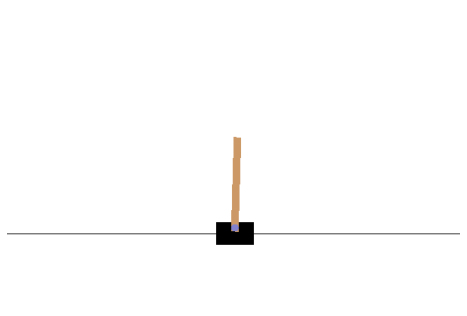

In [ ]:
plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())

### Observation Space and Action Space

In the examples above, we have been sampling random actions from the environment's action space and collecting observations. But what actually are these observations and actions? 

Let us analyze the observation and action spaces in our `Cartpole-v0` env: 

In [ ]:
print ('Observation space:', env.observation_space)
print ('Action space:', env.action_space)

Observation space: Box(4,)
Action space: Discrete(2)


The observation space is of type `Box(4)`, meaning that there are 4 different numeric values that represent the environment observed by the agent.
The action space is of type `Discrete(2)`,  meaning that 2 action indexes (0 and 1) are possible.

Complete the code below by using the `low[i]` and `high[i]` methods of attribute object `observation_space` to identify the validity domains of each observation's dimension `i` described:

In [ ]:
#ob_space = env.observation_space
#print ('|  i  |      Observation      | Min  | Max |')
#print ('|  0  |     Cart Position     | {:.1f} | {:.1f} |'.format(TO_COMPLETE, TO_COMPLETE))
#print ('|  1  |     Cart Velocity     | {} | {} |'.format('-Inf' if TO_COMPLETE==np.finfo(np.float32).min else TO_COMPLETE, 'Inf' if TO_COMPLETE==np.finfo(np.float32).max else TO_COMPLETE))
#print ('|  2  |       Pole Angle      | {:.1f} | {:.1f} |'.format(TO_COMPLETE, TO_COMPLETE))
#print ('|  3  | Pole Velocity At Tip  | {} | {} |'.format('-Inf' if TO_COMPLETE==np.finfo(np.float32).min else TO_COMPLETE, 'Inf' if TO_COMPLETE==np.finfo(np.float32).max else TO_COMPLETE))
#print ()

In [ ]:
#@title Solution { display-mode: "form" }
ob_space = env.observation_space
print ('|  i  |      Observation      | Min  | Max |')
print ('|  0  |     Cart Position     | {:.1f} | {:.1f} |'.format(ob_space.low[0], ob_space.high[0]))
print ('|  1  |     Cart Velocity     | {} | {} |'.format('-Inf' if ob_space.low[1]==np.finfo(np.float32).min else ob_space.low[1], 'Inf' if ob_space.high[1]==np.finfo(np.float32).max else ob_space.high[1]))
print ('|  2  |       Pole Angle      | {:.1f} | {:.1f} |'.format(ob_space.low[2], ob_space.high[2]))
print ('|  3  | Pole Velocity At Tip  | {} | {} |'.format('-Inf' if ob_space.low[3]==np.finfo(np.float32).min else ob_space.low[3], 'Inf' if ob_space.high[3]==np.finfo(np.float32).max else ob_space.high[3]))
print ()

|  i  |      Observation      | Min  | Max |
|  0  |     Cart Position     | -4.8 | 4.8 |
|  1  |     Cart Velocity     | -Inf | Inf |
|  2  |       Pole Angle      | -0.4 | 0.4 |
|  3  | Pole Velocity At Tip  | -Inf | Inf |



Let us now identify which action index (0 or 1) applies a force to the left, and which to the right:

Num | Action
--- | ---
0 | Push cart to the ?
1 | Push cart to the ?

*Side Note: The amount the velocity is reduced or increased is not fixed as it depends on the angle the pole is pointing. This is because the center of gravity of the pole increases the amount of energy needed to move the cart underneath it.*

Complete the code below to identify the impact of action 0 or 1 on the environment:

In [ ]:
#observation = env.reset()
#initial_pos = observation[1]
#observation, reward, done, info = TO_COMPLETE
#pos_after_action0 = observation[1]
#observation, reward, done, info = TO_COMPLETE
#pos_after_action1 = observation[1]

#print ('| Num |         Action         |')
#if pos_after_action0 < initial_pos:
#  print ('|  0  | Push cart to the left  |')
#else:
#  print ('|  0  | Push cart to the right |')
#if pos_after_action1 < pos_after_action0:
#  print ('|  1  | Push cart to the left  |')
#else:
#  print ('|  1  | Push cart to the right |')

In [ ]:
#@title Solution { display-mode: "form" }

observation = env.reset()
initial_pos = observation[1]
observation, reward, done, info = env.step(0)
pos_after_action0 = observation[1]
observation, reward, done, info = env.step(1)
pos_after_action1 = observation[1]

print ('| Num |         Action         |')
if pos_after_action0 < initial_pos:
  print ('|  0  | Push cart to the left  |')
else:
  print ('|  0  | Push cart to the right |')
if pos_after_action1 < pos_after_action0:
  print ('|  1  | Push cart to the left  |')
else:
  print ('|  1  | Push cart to the right |')
  

| Num |         Action         |
|  0  | Push cart to the left  |
|  1  | Push cart to the right |


# Part II: Learning how to act best with RL

This part now presents two reference approaches to learn how to adapt action in order to maximize the future cumulated (discounted) rewards.  
We first present the concept of Q-Learning with a naive tabular approach attempting to model the action-value function $Q_{\pi}(s, a)$.
We then introduce *Deep Q-Network* (DQN), which will be the Deep Reinforcement Learning approach considered in the sequel of this lab.

The material below is (almost) integraly taken from  
[5] Lilian Weng's blog post, "Implementing Deep Reinforcement Learning Models with Tensorflow + OpenAI Gym", available <a href='https://lilianweng.github.io/lil-log/2018/05/05/implementing-deep-reinforcement-learning-models.html'>here</a>  
[4bis] OpenAI, "DQN baseline", available [here](https://github.com/openai/baselines/tree/master/baselines/deepq)

## II.1. Naive Q-Learning

Q-Learning (Watkins & Dayan, 1992) learns the action-value function ("Q-value", Q standing for *quality*) and updates it according to the Bellman equation. The part in red estimates the future return (cumulated discounted reward).  

$Q(s, a) \leftarrow (1 - \alpha) Q(s, a) + \alpha (r + \gamma \color{red}{\max_{a' \in \mathcal{A}} Q(s', a')})$

In a naive implementation, the $Q$ value for all $(s, a)$ pairs can be simply tracked in a dictionary (tabular approach). No complicated machine learning model is involved yet. The drawback, as we are going to see, is that the state and action spaces need to be discretized, and the dimensionality is therefore a limiting factor.

In [ ]:
from collections import defaultdict

Q = defaultdict(float) # We use a dictionary to memorize the Q-value.

gamma = 0.99 # Discount factor
alpha = 0.5 # soft update param

actions = range(env.action_space.n)

def update_Q(s, r, a, s_next, done, alpha):
  max_q_next = max([Q[s_next, a] for a in actions])
  Q[s, a] = (1.0 - alpha) * Q[s, a] + alpha * (r + gamma * max_q_next * (1.0 - done))

Most gym environments have a multi-dimensional continuous observation space (`gym.spaces.Box`). To ensure our Q dictionary will not explode by trying to memorize an infinite number of keys, we make use of a wrapper to discretize the observation.

The DiscretizeWrapper is defined below. You do not need to read the code.

*Side note: The concept of wrappers is very useful: we can customize observation, action, step function, etc. of an env. No matter how many wrappers are applied, `env.unwrapped` always gives back the internal original environment object.*

In [ ]:
#@title Discretizing the observation space { display-mode: "form" }
from gym.spaces import Box, Discrete

class DiscretizedObservationWrapper(gym.ObservationWrapper):
    def __init__(self, env, n_bins=10, low=None, high=None):
        super().__init__(env)
        assert isinstance(env.observation_space, Box)

        low = self.observation_space.low if low is None else low
        high = self.observation_space.high if high is None else high

        low = np.array(low)
        high = np.array(high)

        self.n_bins = n_bins
        self.val_bins = [np.linspace(l, h, n_bins + 1) for l, h in
                         zip(low.flatten(), high.flatten())]
        self.ob_shape = self.observation_space.shape

        print("New ob space:", Discrete((n_bins + 1) ** len(low)))
        self.observation_space = Discrete(n_bins ** len(low))

    def _convert_to_one_number(self, digits):
        return sum([d * ((self.n_bins + 1) ** i) for i, d in enumerate(digits)])

    def observation(self, observation):
        digits = [np.digitize([x], bins)[0]
                  for x, bins in zip(observation.flatten(), self.val_bins)]
        return self._convert_to_one_number(digits)

We can now create our discretized observation space. The result on the env object is completely transparent and does not change its later usage.

In [ ]:
env = DiscretizedObservationWrapper(
    env, 
    n_bins=8, 
    low=[-4.8, -2.0, -0.4, -3.5], 
    high=[4.8, 2.0, 0.4, 3.5]
)

print (env.observation)

New ob space: Discrete(6561)
<bound method DiscretizedObservationWrapper.observation of <DiscretizedObservationWrapper<TimeLimit<CartPoleEnv<CartPole-v0>>>>>


### How to pick an action? Exploitation vs Exploration

In Part I above we systematically chose at random the action at each step. If function $Q(s,a)$ is meant at estimating the future return of each action *a* taken in state *s*, the rationale choice is to pick the $a=\arg\max_{a\in\mathcal{A}} Q(s,a)$.  
However, as the environment evolves into different states partly based on the agent's actions, restraining the choice of action to a $Q$-function still in a learning phase is likely to prevent observing other interesting states (in the worst case, we may get stuck into a single state). This is known as the **exploration vs exploitation** dilemma.

A simple approach to address this problem is the **ε-greedy** algorithm, described next and used in the sequel of this lab.

*Side note 1*: The exploration vs exploitation dilemma exists in many aspects of our life. When choosing to try a new restaurant and having the risk to experience food not as good as in the places you know, in order to possibly discover even better places.

*Side note 2*: The way to conduct exploration while trying to learn a good policy remains an open research problem and an active research area particularly with Deep Reinforcement Learning (see, e.g., <a href='https://openai.com/blog/better-exploration-with-parameter-noise/'>Parameter Noise</a>, <a href='https://towardsdatascience.com/explained-curiosity-driven-learning-in-rl-exploration-by-random-network-distillation-72b18e69eb1b'>Curiosity-Driven Learning in RL</a> or <a href='https://arxiv.org/pdf/1706.10295.pdf'>Noisy Networks</a>).

**ε-Greedy Algorithm**

The ε-greedy algorithm takes the best action most of the time, but does random exploration occasionally. According to the ε-greedy algorithm, with a small probability ε we take random action, but otherwise we pick the best action that we have learnt so far (action *a* maximizing *Q(s,a)* for a given *s*).

In [ ]:
def act(state, epsilon):
    if np.random.random() < epsilon:
        # action_space.sample() is a convenient function to get a random action
        # that is compatible with this given action space.
        return env.action_space.sample()

    # Pick the action with highest q value.
    qvals = {a: Q[state, a] for a in actions}
    max_q = max(qvals.values())
    # In case multiple actions have the same maximum q value.
    actions_with_max_q = [a for a, q in qvals.items() if q == max_q]
    return np.random.choice(actions_with_max_q)

### Training

Let us now learn the *Q*-function by running several episodes until reaching the terminal state, and acting according to the ε-greedy algorithm to choose action at each time step.  
As often, we start with a high `epsilon` and gradually decrease it during the training, so as to more explore first and better exploit as the training converges. This is known as "epsilon annealing".

In [ ]:
epsilon = 1.0  # 100% probability to apply a random action
epsilon_final = 0.05 # 5% probability to apply a random action

number_of_episodes = 1000
number_of_warmup_episodes = 800
alpha_decay = 0.998
eps_drop = (epsilon - epsilon_final) / number_of_warmup_episodes

rewards = []
rewards_avgd = []

for episode_index in range(number_of_episodes):
    ob = env.reset()
    done = False
    reward = 0.0
    step_index = 0
    while not done:
      a = act(ob, epsilon)
      ob_next, r, done, _ = env.step(a)
      update_Q(ob, r, a, ob_next, done, alpha)
      step_index += 1
      reward += r
      ob = ob_next
        
    rewards.append(reward)
    rewards_avgd.append(np.average(rewards[-50:]))
    
    alpha *= alpha_decay
    if epsilon > epsilon_final:
      epsilon = max(epsilon_final, epsilon-eps_drop)
    
    print("[episode:{}|steps:{}] best:{} avg:{:.4f} alpha:{:.4f} eps:{:.4f} Qsize:{}".format(episode_index, step_index, np.max(rewards), np.mean(rewards[-10:]), alpha, epsilon, len(Q)))
    
print("[FINAL] Num. episodes: {}, Max reward: {}, Average reward: {}".format(len(rewards), np.max(rewards), rewards_avgd[-1]))

[episode:0|steps:9] best:9.0 avg:9.0000 alpha:0.4990 eps:0.9988 Qsize:11
[episode:1|steps:54] best:54.0 avg:31.5000 alpha:0.4980 eps:0.9976 Qsize:41
[episode:2|steps:19] best:54.0 avg:27.3333 alpha:0.4970 eps:0.9964 Qsize:49
[episode:3|steps:33] best:54.0 avg:28.7500 alpha:0.4960 eps:0.9952 Qsize:67
[episode:4|steps:28] best:54.0 avg:28.6000 alpha:0.4950 eps:0.9941 Qsize:79
[episode:5|steps:20] best:54.0 avg:27.1667 alpha:0.4940 eps:0.9929 Qsize:88
[episode:6|steps:18] best:54.0 avg:25.8571 alpha:0.4930 eps:0.9917 Qsize:93
[episode:7|steps:28] best:54.0 avg:26.1250 alpha:0.4921 eps:0.9905 Qsize:99
[episode:8|steps:17] best:54.0 avg:25.1111 alpha:0.4911 eps:0.9893 Qsize:101
[episode:9|steps:16] best:54.0 avg:24.2000 alpha:0.4901 eps:0.9881 Qsize:103
[episode:10|steps:34] best:54.0 avg:26.7000 alpha:0.4891 eps:0.9869 Qsize:107
[episode:11|steps:18] best:54.0 avg:23.1000 alpha:0.4881 eps:0.9857 Qsize:108
[episode:12|steps:13] best:54.0 avg:22.5000 alpha:0.4872 eps:0.9846 Qsize:112
[episod

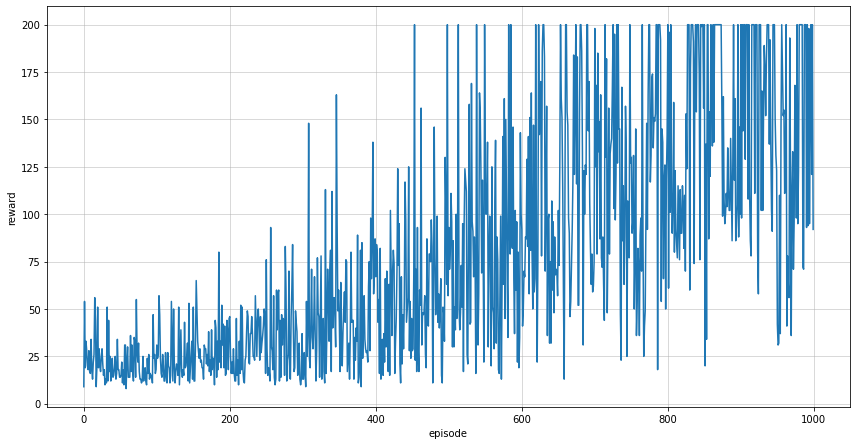

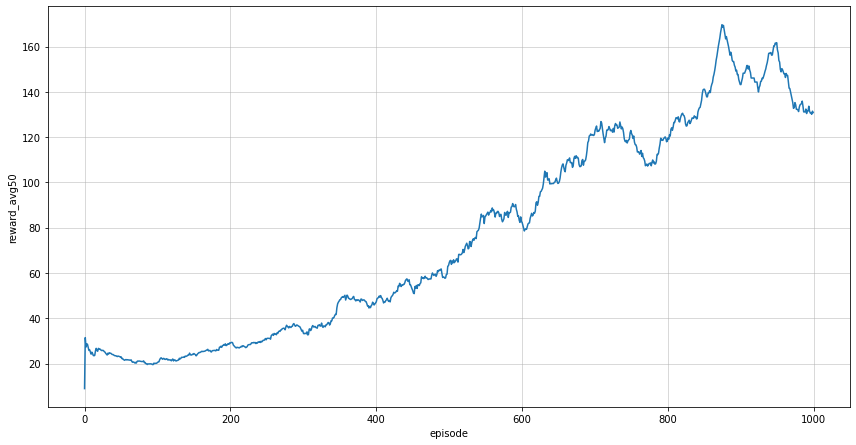

In [ ]:
#@title Plotting the evolution of reward along training { display-mode: "form" }
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(2, 1, 1)
ax.plot(range(len(rewards)), rewards)
ax.set_xlabel('episode')
ax.set_ylabel('reward')
ax.grid('k--', alpha=0.6)
plt.tight_layout()
plt.show()

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(2, 1, 1)
ax.plot(range(len(rewards_avgd)), rewards_avgd)
ax.set_xlabel('episode')
ax.set_ylabel('reward_avg50')
ax.grid('k--', alpha=0.6)
plt.tight_layout()
plt.show()

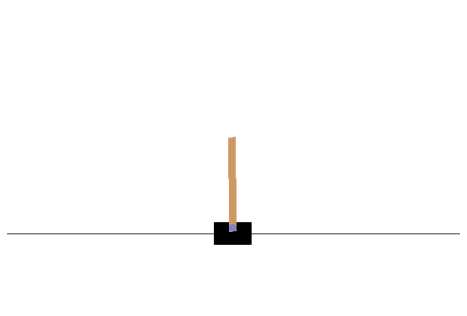

In [ ]:
#@title Watching the trained policy play { display-mode: "form" }
from pyvirtualdisplay import Display
display = Display(visible=0, size=(400, 300))
display.start()

frames = []
done = False
ob = env.reset()

while not done:
      frames.append(env.render(mode='rgb_array'))
      # Make the next move
      a = act(ob, epsilon)
      ob_next, r, done, _ = env.step(a)
      update_Q(ob, r, a, ob_next, done, alpha)
      ob = ob_next

fig = plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())
      
# env.close()

## II.2. Deep Q-Network 

The material below comes from  
[2] Lilian Weng's blog post, "A long peek into RL", available <a href='https://lilianweng.github.io/lil-log/2018/02/19/a-long-peek-into-reinforcement-learning.html'>here</a>  
[4bis] OpenAI, "DQN baseline", available [here](https://github.com/openai/baselines/tree/master/baselines/deepq)
and the code and later explanations from  
[6] Adam Paszke (PyTorch), "Reinforcement Learning (DQN) Tutorial", available <a href='https://pytorch.org/tutorials/intermediate/reinforcement_q_learning.html'>here</a>  

------------------------------------------------------------------------------

Theoretically, we can memorize $Q(s,a)$ for all state-action pairs $(s,a)$ in Q-learning, like in a gigantic table. However, it quickly becomes computationally infeasible when the state and action space are large. Thus people use functions (i.e., a machine learning model) to approximate Q values and this is called **function approximation**. 

In particular we can use **a neural network with weights θ, input state *s* and output estimates *Q(s,a;θ)* for all $a\in\mathcal{A}$**. 

As the network objective is to best predict *Q(s,a)* with *s* as input, the training must be supervised idealistically with the true *Q(s,a)* value. Unfortunately, this value is unknown and must be in turn approximated. Several approaches to do so exist, ranging from so-called **Time-Difference learning (TD learning)** to Monte-Carlo methods.

In TD learning, that we use here, the estimate for the true value of *Q(s,a)* is considered to be

$Q(s,a) \approx r + \gamma \max_{a'\in\mathcal{A}}Q(s',a';\theta)$,

where $r$ is the last observed reward from previous action $a$ performed in state $s$ at the time of learning, the last term being the estimate of the future return starting from the next state $s'$ we got to by acting with $a$ from $s$.

This strategy of using a $Q$ value to update another $Q$ value is known as **bootstrapping** .There is a small amount of ground-truth data in the observation of $r$ and the transition $s\rightarrow s'$.

However, when off-policy, nonlinear function approximation, and bootstrapping are combined in one RL algorithm, the training could be unstable and hard to converge. This issue is known as the **deadly triad** (Sutton & Barto, 2017). Many architectures using deep learning models were proposed to resolve the problem, including Deep Q-Network.

Deep Q-Network (DQN; [Mnih *et al.* 2015](https://www.nature.com/articles/nature14236)) aims at greatly improving and stabilizing the training procedure with two innovative mechanisms:
- **Experience replay**: All the episode steps $e_t = (S_t, A_t, R_t, S_{t+1})$ are stored in one replay memory $D_t = \{ e_1, \dots, e_t \}$. $D_t$ has experience tuples over many episodes. During Q-learning updates, samples are drawn at random from the replay memory and thus one sample could be used multiple times. Experience replay improves data efficiency, removes correlations in the observation sequences, and smooths over changes in the data distribution.
- **Partly frozen target network**: The estimate of the future return $Q(s',a')$ is not obtained from $Q(s',a';\theta)$ anymore, but instead from  $Q(s',a';\theta^-)$, where $\theta^-$ is the weights parameters updated less frequently that $\theta$. For example, $\theta^-$ can be updated each TARGET_UPDATE=10 episodes, while $\theta$ gets updated at each step of each episode. This modification makes the training more stable as it overcomes the short-term oscillations.

With the supervision signal made as:

$\begin{aligned}
& Y(s, a, r, s') = r + \gamma \max_{a'} Q(s', a';\theta^{-})\;,
\end{aligned}$

the main loss function therefore looks like:

$\begin{aligned}
& \mathcal{L}(\theta) = \mathbb{E}_{(s, a, r, s') \sim U(D)} \Big[ \big( Y(s, a, r, s') - Q(s, a;\theta) \big)^2 \Big]
\end{aligned}$

where $U(D)$is a uniform distribution over the replay memory $D$, and $\theta^{-}$ is the weights parameter of the frozen target Q-network.

The Q-network can be a multi-layer dense neural network, a convolutional network, or a recurrent network, depending on the problem. In the following example, we will be using a 2-layer fully connected neural network to learn Q values for the cart pole balancing problem.

*Side note 1*: It is also found to be helpful to clip the error term to be between $[-1, 1]$.

*Side note 2*: There are many extensions of DQN to improve the original design, such as DQN with dueling architecture (Wang *et al.* 2016) and more recent progresses.

*Side note 3*: DQN is only one of the many approaches existing in Deep Reinforcement Learning. Other important approaches involve Policy Gradient algorithms, Monte Carlo approaches, and more generally Imitation learning or Inverse Reinforcement Learning. For a short review of these, accessible sources are:  
[2] above and  
[7] Yisong Yue and Hoang M. Le, "Imitation Learning", ICML 2018 tutorial, avalaible <a href='https://www.youtube.com/watch?v=WjFdD7PDGw0'>here</a>

### Initialization
Let us now initialize our code with required imports, creation of the RL environment and setting the device type in the Torch API.

In [10]:
import gym
import math
import random
import numpy as np
import matplotlib.pyplot as plt
from collections import namedtuple
from itertools import count

import torch
import torch.nn as nn # neural networks
import torch.optim as optim # optimization
import torch.nn.functional as F

BATCH_SIZE = 128
GAMMA = 0.999
EPS_START = 0.9
EPS_END = 0.05
EPS_DECAY = 200
TARGET_UPDATE = 10

random.seed(24)

env = gym.make('CartPole-v0')

# if GPU possibly available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


### Replay Memory

For the reasons listed above, we use an experience replay memory to train our DQN. This memory stores the transitions that the agent observes, allowing us to reuse this data later. Two elements coded below are required:

- `Transition` - a named tuple representing a single transition in our environment. It maps (state, action) pairs to their (next_state, reward) result.

- `ReplayMemory` - a cyclic buffer of bounded size that holds the transitions observed recently. It also implements a `.sample()` method for selecting a random batch of transitions for training.

In [11]:
Transition = namedtuple('Transition',
                        ('state', 'action', 'next_state', 'reward'))


class ReplayMemory(object):

    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = []
        self.position = 0

    def push(self, *args):
        """Saves a transition."""
        if len(self.memory) < self.capacity:
            self.memory.append(None)
        self.memory[self.position] = Transition(*args)
        self.position = (self.position + 1) % self.capacity

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)

### Q-network
The Q-network can be a multi-layer dense neural network, a convolutional network, or a recurrent network, depending on the problem. In our example we will use a 2-layer fully connected neural network (Multi-Layer Perceptron - MLP) to learn Q values for the cart pole balancing problem.  
We first define a helper function for creating MLPs, then have our DQN class.


In [12]:
import torch.nn as nn

def mlp(input_dim, mlp_dims, last_relu=False):
  layers = []
  mlp_dims = [input_dim] + mlp_dims
  for i in range(len(mlp_dims) - 1):
    layers.append(nn.Linear(mlp_dims[i], mlp_dims[i + 1]))
    if i != len(mlp_dims) - 2 or last_relu:
      layers.append(nn.ReLU())
  net = nn.Sequential(*layers)
  return net

# Dummy example to test the function
ex_mlp = mlp(5, [2, 3], True)
print (ex_mlp)

class DQN(nn.Module):
  def __init__(self, input_dim, mlp_dims):
    super().__init__()
    self.q_network = mlp(input_dim, mlp_dims, last_relu=False)
  
  # Called with either one element to determine next action, or a batch during optimization. Returns tensor ([[left0exp, right0exp]...]).
  def forward(self, x):
    x = x.float()
    q = self.q_network(x)
    return q

Sequential(
  (0): Linear(in_features=5, out_features=2, bias=True)
  (1): ReLU()
  (2): Linear(in_features=2, out_features=3, bias=True)
  (3): ReLU()
)


We now create both our policy_net (with params $\theta$) and target_net (with params $\theta^-$) networks.

In [14]:
''' Get number of actions from gym action space '''
n_actions = env.action_space.n
''' The observation space is a `Box(4,)`, a 4-element vector '''
observation_size = env.observation_space.shape[0]

hidden_layer_size = 256 #128

policy_net = DQN(observation_size, [hidden_layer_size, n_actions]).to(device) #[hidden_layers_size, hidden_layers_size, hidden_layers_size, n_actions]).to(device)
target_net = DQN(observation_size, [hidden_layer_size, n_actions]).to(device)
''' Initialize target net's weights to policy_net's weights, and set it into eval mode (not training, so that dropout or batchnorm are correctly used)'''
target_net.load_state_dict(policy_net.state_dict())
target_net.eval()

optimizer = optim.Adam(policy_net.parameters())

and add functions similar to those seen in Section II.1:

In [15]:
def select_action(state):
  global steps_done
  sample = random.random()
  if sample > eps_threshold:
    with torch.no_grad():
      ''' t.max(1) will return largest column value of each row.
          second column on max result is index of where max element was found,
          so we pick action with the largest expected reward.
      '''
      #print('chosen from NN')
      return policy_net(state).max(1)[1].view(1, 1)
  else:
    #print('chosen from randomly')
    return torch.tensor([[random.randrange(n_actions)]], device=device, dtype=torch.long)

''' Format the state to that it fits into the replay memory'''
def get_state_pytorch(state):
  return torch.from_numpy(state).unsqueeze(0).to(device)

### Training


Finally, the code for training is made of 2 parts: an `optimize_model` function called from a training loop.

The `optimize_model` function performs a single step of the optimization:
- first samples a batch (concatenates all the tensors into a single one), 
- then computes $Q(s,a;\theta)$ and $\max_a Q(s',a;\theta^-)$,
- finally combines them into the loss and perform one step of gradient descent (backpropagation).

In [16]:
def optimize_model():
  if len(memory) < BATCH_SIZE:
    return
  transitions = memory.sample(BATCH_SIZE)
  ''' Transpose the batch (see https://stackoverflow.com/a/19343/3343043 for 
      detailed explanation). This converts batch-array of Transitions 
      to Transitions of batch-arrays.
  '''
  batch = Transition(*zip(*transitions))
  
  ''' Compute a  mask of non-final states and concatenate the batch elements
      (a final state is one after which simulation ended)
  '''
  non_final_mask = torch.tensor(tuple(map(lambda s: s is not None, batch.next_state)), device=device, dtype=torch.uint8)
  non_final_next_states = torch.cat([s for s in batch.next_state if s is not None])
  state_batch = torch.cat(batch.state)
  action_batch = torch.cat(batch.action)
  reward_batch = torch.cat(batch.reward)
  
  ''' Compute Q(s,a;θ) for each (s,a) pair in the batch '''
  state_action_values = policy_net(state_batch).gather(1, action_batch)
  
  ''' Compute max_a Q(s',a;θ-) for all next states s' '''
  next_state_values = torch.zeros(BATCH_SIZE, device=device)
  next_state_values[non_final_mask] = target_net(non_final_next_states).max(1)[0].detach()
  
  ''' Compute the expected Q values '''
  expected_state_action_values = reward_batch + GAMMA * next_state_values
  
  ''' Compute Huber loss '''
  loss = F.smooth_l1_loss(state_action_values, expected_state_action_values.unsqueeze(1))
  
  ''' Optimize the model '''
  optimizer.zero_grad()
  loss.backward() # accumulates the loss over all the batch elements
  for param in policy_net.parameters():
    param.grad.data.clamp_(-1, 1)
  optimizer.step()

The main training loop coded below is sketched in the graph below, and consists of:

- running a given number of steps `total_timesteps` (over as many episodes as needed)
- for each step, select action (still with  ε-greedy)
- record the so-obtained transition into the replay memory
- perform one step of optimization of the policy_net network every `train_freq` steps
- update the target_net network weights with the policy_net's weights every `target_network_upate` steps.

![alt text](https://pytorch.org/tutorials/_images/reinforcement_learning_diagram.jpg)

1 11 11.0, 2 45 22.0, 3 69 22.3, 4 116 28.2, 5 149 29.0, 6 178 28.8, 7 194 26.9, 8 211 25.5, 9 249 26.8, 10 259 25.0, 11 282 24.7, 12 292 23.4, 13 320 23.7, 14 333 22.9, 15 350 22.4, 16 375 22.5, 17 391 22.1, 18 408 21.7, 19 424 21.4, 20 444 21.2, 21 455 20.7, 22 485 21.1, 23 506 21.0, 24 521 20.8, 25 549 21.0, 26 566 20.8, 27 596 21.1, 28 689 23.6, 29 701 23.2, 30 730 23.4, 31 750 23.2, 32 804 24.2, 33 827 24.1, 34 855 24.2, 35 871 23.9, 36 898 24.0, 37 913 23.7, 38 938 23.7, 39 954 23.5, 40 965 23.2, 41 978 22.9, 42 994 22.7, 43 1008 22.5, 44 1020 22.2, 45 1040 22.1, 46 1053 21.9, 47 1077 21.9, 48 1090 21.7, 49 1104 21.6, 50 1117 21.4, 51 1136 21.3, 52 1152 21.2, 53 1168 21.1, 54 1186 21.0, 55 1200 20.8, 56 1211 20.6, 57 1232 20.6, 58 1245 20.5, 59 1290 20.9, 60 1303 20.7, 61 1321 20.7, 62 1333 20.5, 63 1344 20.3, 64 1377 20.5, 65 1389 20.4, 66 1408 20.3, 67 1429 20.3, 68 1448 20.3, 69 1460 20.2, 70 1479 20.1, 71 1498 20.1, 72 1512 20.0, 73 1528 19.9, 74 1541 19.8, 75 1560 19.8, 76 1

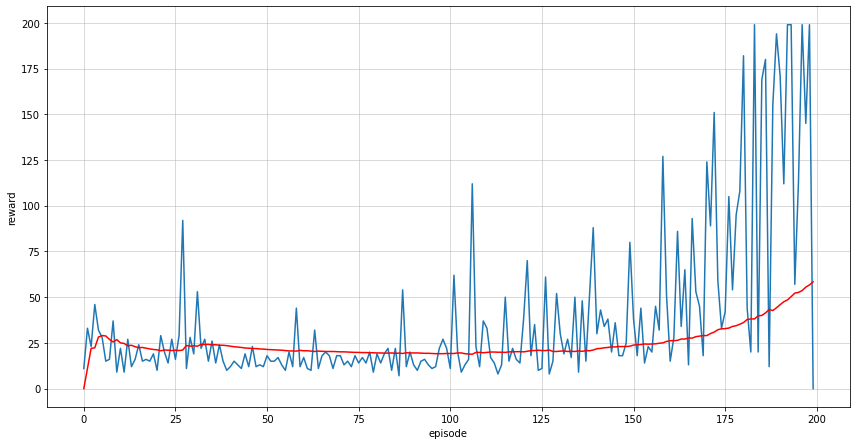

200 8098 59.8, 201 8265 61.3, 202 8456 62.6, 203 8618 64.0, 204 8772 65.5, 205 8939 67.0, 206 9121 68.6, 207 9285 69.2, 208 9439 70.5, 209 9605 72.0, 210 9786 73.4, 211 9979 75.0, 212 10144 76.5, 213 10333 78.2, 214 10509 79.9, 215 10662 81.3, 216 10862 82.8, 217 11062 84.6, 218 11262 86.4, 219 11447 88.1, 220 11647 89.9, 221 11823 91.3, 222 11997 92.3, 223 12168 93.8, 224 12368 95.5, 225 12568 97.4, 226 12762 99.2, 227 12962 100.6, 228 13162 102.5, 229 13311 103.8, 230 13494 105.1, 231 13674 106.6, 232 13874 108.4, 233 14073 110.1, 234 14273 111.9, 235 14473 113.4, 236 14653 115.1, 237 14797 116.1, 238 14936 117.3, 239 15075 118.2, 240 15216 118.7, 241 15360 119.8, 242 15484 120.6, 243 15608 121.5, 244 15718 122.2, 245 15785 122.7, 246 15886 123.3, 247 16006 124.3, 248 16127 125.3, 249 16254 126.3, 250 16367 126.7, 251 16500 127.6, 252 16607 128.5, 253 16723 129.2, 254 16837 130.2, 255 16963 131.2, 256 17061 132.0, 257 17170 132.6, 258 17270 133.3, 259 17369 133.0, 260 17475 133.5, 26

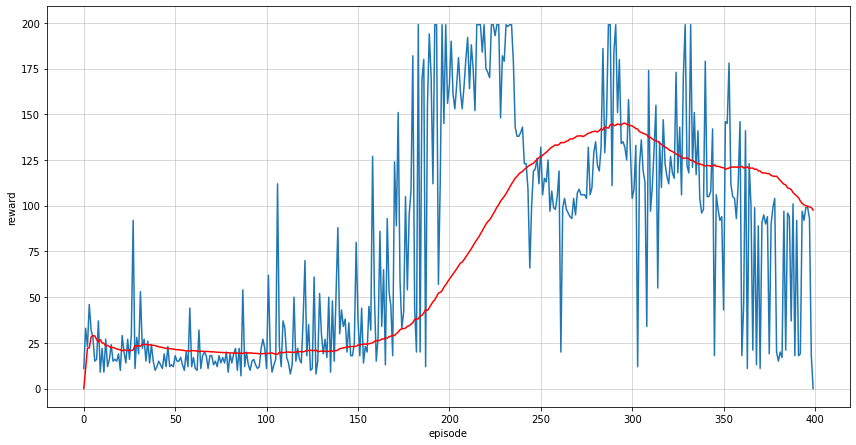

400 32387 97.2, 401 32486 97.2, 402 32588 97.1, 403 32678 96.7, 404 32694 96.7, 405 32791 96.4, 406 32890 96.1, 407 32988 95.8, 408 33097 95.8, 409 33201 96.5, 410 33306 95.8, 411 33405 95.8, 412 33507 95.7, 413 33601 95.3, 414 33618 93.9, 415 33637 93.6, 416 33735 93.2, 417 33751 92.2, 418 33848 91.7, 419 33866 90.7, 420 33964 90.5, 421 33980 89.5, 422 33993 88.4, 423 34096 88.2, 424 34192 88.0, 425 34206 86.4, 426 34224 85.4, 427 34316 84.9, 428 34412 84.8, 429 34502 83.9, 430 34614 83.0, 431 34630 82.0, 432 34746 82.0, 433 34769 80.2, 434 34871 80.0, 435 34900 78.8, 436 35018 78.8, 437 35029 77.4, 438 35127 77.4, 439 35222 77.4, 440 35320 77.3, 441 35417 76.5, 442 35516 76.4, 443 35630 76.5, 444 35742 76.6, 445 35849 76.2, 446 35944 77.0, 447 36073 77.2, 448 36176 77.2, 449 36277 77.3, 450 36383 77.4, 451 36493 78.1, 452 36613 77.8, 453 36740 77.6, 454 36854 77.0, 455 36956 76.8, 456 37063 76.8, 457 37164 76.8, 458 37253 76.8, 459 37351 76.6, 460 37496 76.6, 461 37515 76.6, 462 3753

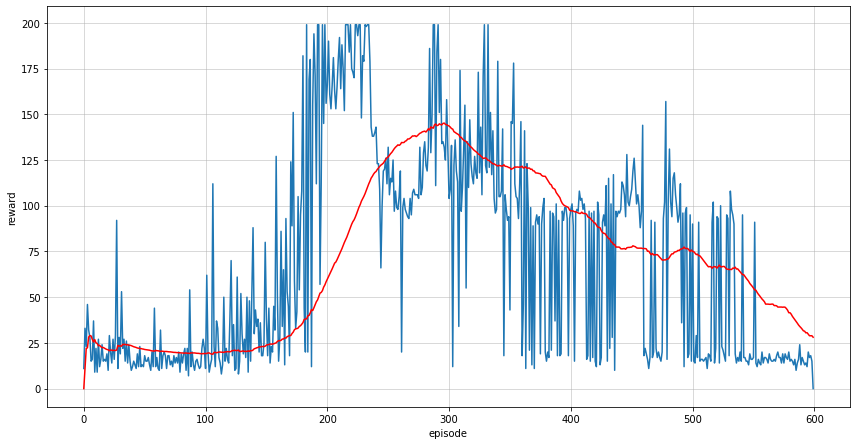

600 42901 28.1, 601 42921 27.4, 602 42938 27.4, 603 42951 27.4, 604 42968 27.3, 605 42984 27.2, 606 43001 26.5, 607 43016 26.5, 608 43037 26.5, 609 43054 26.5, 610 43070 26.5, 611 43083 26.5, 612 43099 26.5, 613 43115 26.5, 614 43131 26.5, 615 43148 26.4, 616 43165 26.5, 617 43181 25.7, 618 43194 24.8, 619 43215 24.9, 620 43235 24.8, 621 43333 24.9, 622 43352 24.1, 623 43369 24.1, 624 43385 23.3, 625 43401 23.2, 626 43417 23.1, 627 43513 23.9, 628 43609 24.7, 629 43707 24.7, 630 43802 24.7, 631 43897 25.5, 632 43993 25.4, 633 44087 25.3, 634 44104 24.5, 635 44120 23.8, 636 44138 23.8, 637 44233 24.6, 638 44252 24.6, 639 44268 24.6, 640 44360 25.3, 641 44457 26.1, 642 44484 25.4, 643 44500 25.4, 644 44594 26.1, 645 44611 26.2, 646 44707 27.0, 647 44723 27.0, 648 44743 27.0, 649 44839 27.8, 650 44932 28.5, 651 45024 29.3, 652 45116 29.3, 653 45209 30.0, 654 45227 30.1, 655 45245 30.1, 656 45341 30.9, 657 45432 31.7, 658 45443 31.6, 659 45533 32.3, 660 45630 33.1, 661 45731 34.0, 662 4582

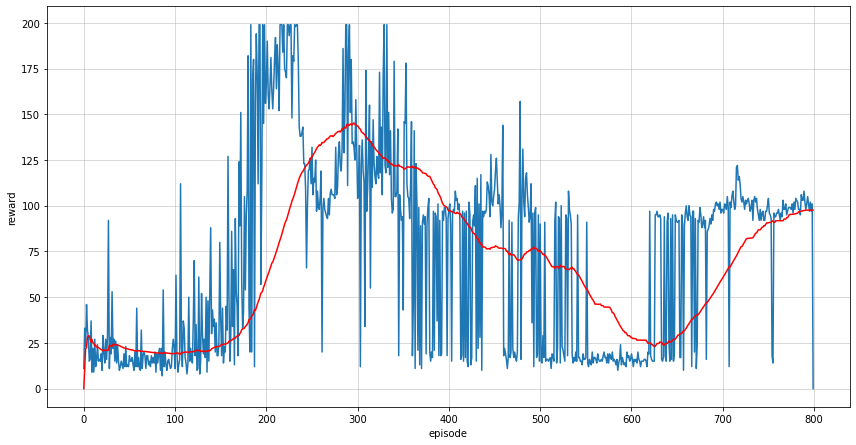

800 58932 97.6, 801 59033 97.6, 802 59132 97.7, 803 59236 97.7, 804 59339 97.7, 805 59438 97.7, 806 59538 97.6, 807 59638 97.6, 808 59741 98.6, 809 59761 97.7, 810 59859 97.7, 811 59956 97.6, 812 59979 96.8, 813 60078 96.7, 814 60179 96.7, 815 60283 96.8, 816 60384 96.5, 817 60480 96.3, 818 60583 96.2, 819 60676 95.9, 820 60773 95.8, 821 60873 95.7, 822 60975 95.7, 823 61078 95.7, 824 61181 95.7, 825 61284 95.7, 826 61388 95.7, 827 61493 95.7, 828 61600 95.8, 829 61702 95.7, 830 61808 95.8, 831 61911 95.8, 832 62013 95.8, 833 62124 95.9, 834 62233 96.1, 835 62341 96.1, 836 62447 96.1, 837 62556 96.2, 838 62662 96.2, 839 62771 96.3, 840 62881 96.4, 841 62993 96.6, 842 63104 96.7, 843 63208 96.8, 844 63317 97.0, 845 63330 96.1, 846 63436 96.2, 847 63545 96.4, 848 63659 96.6, 849 63779 96.8, 850 63901 97.0, 851 64020 97.1, 852 64154 97.5, 853 64277 97.8, 854 64413 98.2, 855 64537 99.2, 856 64657 100.3, 857 64781 100.6, 858 64901 100.8, 859 65018 101.0, 860 65205 101.9, 861 65405 103.0, 86

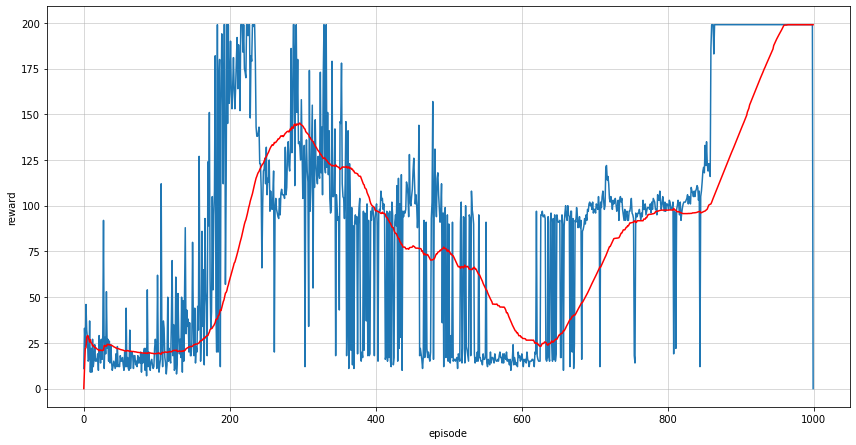

1000 93189 199.0, 1001 93389 199.0, 1002 93589 199.0, 1003 93789 199.0, 1004 93989 199.0, 1005 94189 199.0, 1006 94389 199.0, 1007 94589 199.0, 1008 94789 199.0, 1009 94989 199.0, 1010 95189 199.0, 1011 95389 199.0, 1012 95589 199.0, 1013 95789 199.0, 1014 95989 199.0, 1015 96189 199.0, 1016 96389 199.0, 1017 96589 199.0, 1018 96789 199.0, 1019 96989 199.0, 1020 97189 199.0, 1021 97389 199.0, 1022 97589 199.0, 1023 97789 199.0, 1024 97989 199.0, 1025 98189 199.0, 1026 98389 199.0, 1027 98589 199.0, 1028 98789 199.0, 1029 98989 199.0, 1030 99189 199.0, 1031 99389 199.0, 1032 99406 197.2, 1033 99606 197.2, 1034 99789 197.0, 1035 99989 197.0, 

In [17]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

BATCH_SIZE = 32
GAMMA = 0.999
total_timesteps=100000
buffer_size=50000
exploration_fraction=0.1
exploration_final_eps=0.02
train_freq=1
target_network_update_freq=500
learning_starts=1000
plot_freq = 200

memory = ReplayMemory(buffer_size)

initial_p=1.0
final_p=exploration_final_eps
schedule_timesteps=int(exploration_fraction * total_timesteps)
exploration = [initial_p + (min(float(t) / schedule_timesteps, 1.0)) * (final_p - initial_p) for t in range(total_timesteps)]

episode_rewards = [0.0]
rewards_mean_100ep = [0.0]
saved_mean_reward = None
state = env.reset()
state = get_state_pytorch(state)
reset = True

last_num_episodes = 1
num_episodes_last_plot = -1
flag_plot = 0

for t in range(total_timesteps):
  eps_threshold = exploration[t]
  action = select_action(state)
  reset = False
  next_state, reward, done, _ = env.step(action.item())
  if done:
    reward = 0.0
  episode_rewards[-1] += reward
  
  next_state = get_state_pytorch(next_state)
  reward = torch.tensor([reward], device=device)
  memory.push(state, action, next_state, reward)
  state = next_state
  if done:
    state = env.reset()
    state = get_state_pytorch(state)
    episode_rewards.append(0.0)
    reset = True
    
  if t > learning_starts and t % train_freq == 0:
    optimize_model()
  if t > learning_starts and t % target_network_update_freq == 0:
    target_net.load_state_dict(policy_net.state_dict())
    
  num_episodes = len(episode_rewards)
  
  if num_episodes > num_episodes_last_plot and num_episodes % plot_freq ==0 and flag_plot == 1:
    flag_plot = 0
  
  if num_episodes > last_num_episodes:
    last_num_episodes = num_episodes
    mean_100ep_reward = round(np.mean(episode_rewards[-101:-1]), 1)
    rewards_mean_100ep.append(mean_100ep_reward)
    print(last_num_episodes-1, t, mean_100ep_reward, end=', ')
  
  if num_episodes % plot_freq ==0 and flag_plot == 0:
    print(last_num_episodes-1, t, mean_100ep_reward)
    num_episodes_last_plot = num_episodes
    flag_plot = 1
    plt.close()
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(2, 1, 1)
    ax.plot(range(num_episodes), episode_rewards)
    ax.plot(range(num_episodes), rewards_mean_100ep, 'r')
    ax.set_xlabel('episode')
    ax.set_ylabel('reward')
    ax.grid('k--', alpha=0.6)
    plt.tight_layout()
    plt.show()


Note that this performance has been obtained without needing to discretize the state space.

You can make vary various parameters to observe the impact on performance. In particular, you may:
- make vary `target_network_update_freq` from 500 to 10 and observe it prevents convergence as the supervising signal (the V estimate) varies too much;
- make vary the network architecture by, e.g, going from a single hidden layer of size 256 to 2 hidden layers of size 8 and 4 for example. You should see that the fitting is more difficult, but in particular, the network gets more brittle, as successive runs (hence with different random number generator seeds) give widely different results.

This makes us uncover the fragility of (and difficulty of working with) DRL methods, which are much sensitive to hyperparameters, that must be well adapted to the environment at hand.

# Part III: Crowd-Robot Interaction Problem

This last third part finally presents a more challenging robotic navigation task, and highlights how current DRL training alone may be insufficient to address complex environments. 
We first introduce the problem and the learning approach, then analyze some training attempts.
We end the lab by illustrating the improvement brought to DRL by Imitation Learning, finally opening up to alternate DRL techniques (Imitation Learning, Inverse RL).

The material below is assembled from the work of Chen *at al.* [8] and Chen *et al.* [9] on Crowd-aware Robot Navigation. The main source of code is that made available by the VITA lab at EPFL [10].

Sources:  
[8] Chen, Y., Liu, M., Everett, M., How, J.. "[Decentralized non-communicating multiagent collision avoidance with deep reinforcement learning](https://arxiv.org/pdf/1609.07845.pdf)." 2017 IEEE international conference on robotics and automation (ICRA). IEEE, 2017.

[9] Chen, C., Liu, Y., Kreiss, S., Alahi, A. (2018). "[Crowd-robot interaction: Crowd-aware robot navigation with attention-based deep reinforcement learning](https://arxiv.org/pdf/1809.08835.pdf)". arXiv preprint arXiv:1809.08835.

[10] [Github repository](https://github.com/vita-epfl/CrowdNav) for the ICRA 2018 paper.

[11] *ORCA* : Van Den Berg, J., Guy, S. J., Lin, M., & Manocha, D. (2011). "[Reciprocal n-body collision avoidance.](http://gamma.cs.unc.edu/ORCA/)" In Robotics research (pp. 3-19). Springer, Berlin, Heidelberg.

## Part III.1. Problem Formulation and Learning Approach

<br>

----------

**Navigation task: a robot has to move through a crowd of $n$ walking humans to reach a positional goal. Its speed must be as close as possible to $v_{pref}$.**  

----------
<br></br><br>


<img src="https://lh3.google.com/u/0/d/1v8c0WZDGW2YASSaAaoDYodRbv8xujFly=w3840-h1820-iv1" width="400">

This can be formulated as a sequential decision making problem in a reinforcement learning framework.

Remember the first illustration of RL in this tutorial? Here is the Robot Navigation problem in the Reinforcement Learning framework.

<img src="https://lh3.google.com/u/0/d/1vNBMr7YnGXEr1wA2AKta4l04KNH9U7SN=w3840-h1820-iv1" width="400">

From our more formal definition:

* The agent is acting in an **environment**, the environment is defined in the **CrowdSimEnv class**.
* The **environement's state**  at time $t$ is **$s_t^{jn} \in S$** defined in the JointState class and **gathering the state of the robot** denoted by **$s_t$** defined in the FullState class, and **the state of the humans $w_t = [w_t^1, w_t^2, ..., w_t^n]$** defined in the class ObservableState.
* The agent takes **actions** $(v_x, v_y) \in A$ to change instantly its velocity and switch from one state to another.
* The next environment state $s_{t+1}^{jn}$ is obtained from ORCA [11]: it simulates (with physics and social laws) where the humans will be after a robot's action, given their past trajectories.
* Once an action is taken, the environment delivers a **reward** ($r \in R$) as feedback.

<img src="https://lh3.google.com/u/0/d/1XfJxd0wwCfjvdBJXj4i_8iLS9MUdZuKC=w3840-h1820-iv1" width="400">

### Reward

The reward function awards reaching the goal position while penalizing collisions or uncomfortable distances on the way to the goal.

<img src="https://lh3.google.com/u/0/d/1Xggiob6v4JQAhQ1aeH5FK-vmLpDrCBbo=w1924-h946-iv1" width="200">

$\begin{split}\text{where} \quad R(s_t^{jn}, a_t) = \begin{cases}
  -0.25  & \text{if } d_t<0,\\
  -0.1+d_t/2 & \text{else if } d_t < 0.2,\\
  1 & \text{else if } p_t = p_g\\
  0 & \text{otherwise}
\end{cases}\end{split}$

<!-- $\left\{\begin{matrix}
-0.25 & \text{if } d_t<0\\ 
-0.1+d_t/2 & \text{else if } d_t < 0.2\\ 
1 & \text{else if } p_t = p_g\\
0 & \text{otherwise}
\end{matrix}\right$ -->

where $d_t$ is the minimum separation distance between the robot and the humans during the time period $[t-\Delta t, t]$, $p_t$ is the position of the robot and $p_g$ is the goal position.


### Environment

**The code to configure the environment with the above presented parameters can be seen in the next cell. We shortly describe it once.**

*Side Note*: This piece of code will be called almost each time we make our environment settings evolve, and will be hidden in a cell named `Configuration of the environment`. You can always double-click to show it.<br></br>


With the `env_config` dictionary we can control the configuration of the environment for the train and test settings.

<img src="https://lh3.google.com/u/0/d/1BvAkNaXmffvohAn8flLcScF_hGAx20oK=w1924-h696-iv1" width="200">

Note the following in the code below:

1. All the classes needed for the agent, environment and policy (we will explore them later) are imported initially with the call `from crowd_nav import *`.
2. We need to register the `CrowdSim-v0` environment, since it's not one of the default OpenAI Gym environments.
3. We set the configuration of the environment with the dictionary `env_config`. Check the key `reward` in this dictionary and identify how these values relate to the $R(s_t^{jn}, a_t)$ defined above.
4. The *visible* feature tells whether the component is visible to humans (controlled by ORCA): here, the humans are all visible (hence to other humans) but the robot is considered invisible (hence it cannot rely on humans to avoid it, and must learn how to avoid them while reaching the desired speed, possibly predicting their trajectory: we come to learning in Section III.2).
5. When later playing with the code, you may change the values in the `env_config` dictionary to identify their impacts on robot's performance.

**env:**
* time_limit: $25 \in \mathbb{R}$
* time_step: $0.25 \in \mathbb{R}$
* test_size: $500 \in \mathbb{N}$; Used to initialize the seed of the random number generator.

**reward:**
* success_reward: $1$
* collision_penalty: $0.25$
* discomfort_dist: $0.2$
* discomfort_penalty_factor: $0.5$

**sim:**
* test_sim: 'circle_crossing' $\in$ {'square_crossing', 'circle_crossing', 'mixed'}
* square_width: $10 \in \mathbb{N}$
* circle_radius: $4 \in \mathbb{N}$
* human_num: $5 \in \mathbb{N}$

**humans:**
* visible: True
* policy: 'orca'
* radius: $0.3 \in \mathbb{R}$
* v_pref: $1 \in \mathbb{R}$

**robot:**
* visible: False $\in$ {True, False}
* policy: 'random' $\in$ {'random', 'orca'}
* radius: $0.3 \in \mathbb{R}$
* v_pref: $1 \in \mathbb{R}$

Running the code below displays the initial settings of the environment (the robot in this configuration just moves randomly).

In [18]:
import argparse
import configparser
import os
import torch
import numpy as np
import gym
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML
# This imports all the classes we will explain in the Anexes
from crowd_nav import *

from gym.envs.registration import register

# delete if it's registered
env_name = 'CrowdSim-v0'
if env_name in gym.envs.registry.env_specs:
    del gym.envs.registry.env_specs[env_name]

register(
  id='CrowdSim-v0',
  entry_point=CrowdSim,
)

# Configure device
## Use the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Using device: %s' % device)

# Configure environment
env = gym.make('CrowdSim-v0')
# Default configuration
env_config = { 'env': {
                       'time_limit':25,
                       'time_step':0.25,
                       'test_size':500      
                      }, 
            'reward': {
                       'success_reward':1,
                       'collision_penalty':-0.25,
                       'discomfort_dist':0.2,
                       'discomfort_penalty_factor':0.5
                      },
               'sim': {
                       'test_sim':'circle_crossing',
                       'square_width':10,
                       'circle_radius':4,
                       'human_num':5
                      },
            'humans': {
                       'visible':True,
                       'policy':'orca',
                       'radius':0.3,
                       'v_pref':1
                      },
             'robot': {
                       'visible':False,
                       'policy':'random',
                       'radius':0.3,
                       'v_pref':1
                      }
             }

env.configure(env_config)

robot = Robot(env_config, 'robot')
env.set_robot(robot)

robot.print_info()

Using device: cuda:0
human number: 5
Not randomize human's radius and preferred speed
Training simulation: None, test simulation: circle_crossing
Square width: 10, circle width: 4
Agent is invisible


Once the environement configured, you can run the code below to run the test for an episode.

In [19]:
### Running one episode
ob = env.reset('test')
done = False
last_pos = np.array(robot.get_position())
frames = []
while not done:
  action = robot.act(ob)
  ob, _, done, info = env.step(action)
  print ('Simulation time-step: %.2f, max time: %.2f' % (env.global_time, env_config['env']['time_limit']))
  current_pos = np.array(robot.get_position())
  #logging.debug('Speed: %.2f', np.linalg.norm(current_pos - last_pos) / robot.time_step)
  last_pos = current_pos
  frames.append(env.render(mode='rgb_array'))
print('It takes %.2f seconds to finish. Final status is %s' % (env.global_time, info))

Simulation time-step: 0.25, max time: 25.00
Simulation time-step: 0.50, max time: 25.00
Simulation time-step: 0.75, max time: 25.00
Simulation time-step: 1.00, max time: 25.00
Simulation time-step: 1.25, max time: 25.00
Simulation time-step: 1.50, max time: 25.00
Simulation time-step: 1.75, max time: 25.00
Simulation time-step: 2.00, max time: 25.00
Simulation time-step: 2.25, max time: 25.00
Simulation time-step: 2.50, max time: 25.00
Simulation time-step: 2.75, max time: 25.00
Simulation time-step: 3.00, max time: 25.00
Simulation time-step: 3.25, max time: 25.00
Simulation time-step: 3.50, max time: 25.00
Simulation time-step: 3.75, max time: 25.00
Simulation time-step: 4.00, max time: 25.00
Simulation time-step: 4.25, max time: 25.00
Simulation time-step: 4.50, max time: 25.00
Simulation time-step: 4.75, max time: 25.00
Simulation time-step: 5.00, max time: 25.00
Simulation time-step: 5.25, max time: 25.00
Simulation time-step: 5.50, max time: 25.00
Simulation time-step: 5.75, max 

Here is the code to plot the result of the tested episode.

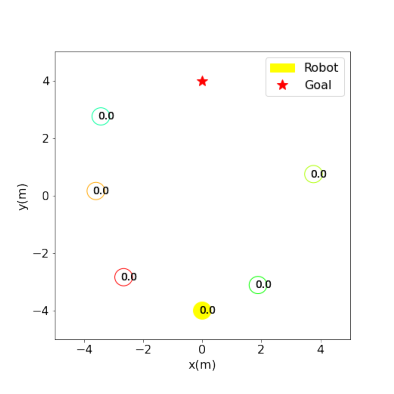

In [20]:
### Code to plot the results
plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())

As the robot moving policy is set to "random", we understand the shape of the trajectory plotted in yellow.

Surely the goal is to do better than that. Let us now present the framing of the navigation problem within DRL.

#### Value Network

In this work we chose to optimize $V(s^{jn})$ rather than the more common choice $Q(s^{jn}, a)$ as done in Section II.2 for DQN, because the action space is continuous and the set of permissible velocity vectors depends on the agent's state (preferred speed $v_{pref}$).

Recall that the value function predicts the future return, i.e., the cumulated sum of discounted rewards from a given state onward: 

$V^*(s_t^{jn})=\sum_{t'=t}^{T}\gamma^{t' \cdot v_{pref}}R(s_{t'}^{jn}, \pi^*({s_{t'}^{jn}}))$,

where:
* $R(s_t^{jn}, a_t)$ is the reward received at time $t$.
* $\gamma \in (0,1)$ is a discount factor.
* $v_{pref}$ is the preferred velocity of the agent and is typically time invariant. (It is used here as a normalization factor for numerical reasons, because otherwise the value function of a slow moving agent could be very small.)

It is often called the **state value** as it can be seen as measuring how rewarding a state is by a prediction of future reward.

Since we can easily generate a large amount of training data in a simulator, we can employ a fully connected deep neural network with ReLU nonlinearities to parameterize the value function. This value is denoted by $V(\cdot, w)$, where $w$ is the set of weights in the neural network.

The value network is a single Multi-Layer Perceptron that hence receives as input the current state and predicts the corresponding state value.

In [21]:
class CADRL_ValueNetwork(nn.Module):
  def __init__(self, input_dim, mlp_dims):
    super().__init__()
    self.value_network = mlp(input_dim, mlp_dims)

  def forward(self, state):
    value = self.value_network(state)
    return value

### Policy

Recall that the policy $\pi$ tells us which action to take in state $s_t^{jn}$. It is a mapping from state $s_t^{jn}$ to action $a_t=(v_x, v_y)$:

<img src="https://lh3.google.com/u/0/d/14AGs4RM6tzwB8Y8VUkIWy1Kr_1oWpFau=w1924-h696-iv1" width="400">

The goal of the optimal policy, $\pi^* : s_t^{jn} \mapsto a_t$ is to maximize the expected return:

$\pi^*(s_t^{jn})=\arg\max_{\pi(\cdot)}\ R(s_t^{jn}, a_t)+\gamma^{\Delta t \cdot v_{pref}}\int_{s_{t+\Delta t}^{jn}}^{}P(s_t^{jn}, a_t, s_{t+\Delta t}^{jn})V^*(s_{t+\Delta t}^{jn})ds_{t+\Delta t}^{jn}$

where:
* $P(s_t^{jn}, a_t, s_{t+\Delta t}^{jn})$ is the transition probability from time $t$ to time $t + \Delta t$. 
* $V^*$ is the optimal value function, in this case the value function is parameterized by $V(\cdot, w^*)$ where $w$ is the set of weights in a neural network that produces $V^*=V(\cdot, w^*)$.

*Side note*: In train we can query the environment the true value of the next state $s_{t+1}^{jn}$ instead of approximating it (e.g. with a linear motion model). During deployment, the transition probability can be approximated by a trajectory prediction model.

#### Creation of the CADRL policy class

We are now going to create the CADRL policy class: it is the "[Collision Avoidance with Deep Reinforcement Learning (CADRL)](https://arxiv.org/pdf/1609.07845.pdf)" from source [8] above.

This class contains the methods:

* `build_action_space`: The action space is discretized. It is assumed that the agent can travel in any direction at any time.
The `speed_samples` are exponentially sampled between $(0, v_{pref}]$ and the `rotation_samples` are evenly spaced between $[0, 2\pi)$
This function builds an action space of size `speed_samples` $\times$ `rotation_samples` $+ 1$.
* `propagate`: Computes the next state of the robot given the current state and the action by $p = p + v \times \Delta t$

* `transform`: Takes the state passed from agent and transform it to tensor for batch training (the coordinates in the state of each agent is transformed to robot-centric using the `rotate` method).

* `rotate`:  Transform the coordinate system to agent-centric (robot-centric), the robot is placed at the origin and the other agents orbit around it.  
$s = [d_g, v_{pref}, v_x, v_y, r]$,  
$w_i = [p_x, p_y, v_x, v_y, r_i, d_i, r_i+r]$,  
where $d_g = \left \| p-p_g \right \|_2$ is the robot's distance to the goal and $d_i=\left \| p-p_i \right \|_2$ is the robot's distance to the neighbor $i$.

* `predict`:  **IMPORTANT**  
1. As in part II.2, at each step, when we are in environment's state $s_t^{jn}$,  we want to choose action
$$a=\arg\max_{a\in\mathcal{A}} R(s_t^{jn},a) + V(s_{t+1}^{jn}) $$
However we do not maintain anymore a Q-network providing $Q(s_t,a), \forall a\in\mathcal{A}$. So we need to go over all actions $a$, and predict $R(s_t^{jn},a)$ and $s_{t+1}^{jn}$.
2. However, from implementation design independent from RL constraints, the Value Network V does not exactly take as input $s_{t+1}^{jn}$ but instead the joint state of the robot and only one other human $i$, $(s_t, w_t^i)$. Therefore, for each action $a$ tested, for every human's predicted state, the retained value is $\min_i V(s_t, w_t^i)$, i.e., the value is estimated with the human providing the worst value.
3. The ε-greedy algorithm is used to run exploration. The pseudo-code for prediction when training is:
```
with probability ε:
    choose a random action
with probability 1-ε:
    Q = []
    for a in A:
        s_{t+1} = p + a * dt
        r, w_t = get reward and humans' state from the environment
        s_{t+1}^{jn} = [s_{t+1}, w_t]
        V = get from ValueNetwork, using s_{t+1}^{jn} as input
        Q[a] = r + gamma^{dt*v_{pref}} * V
    choose argmax(Q)
```



**Exercise**:

With the above indications, fill in the `predict` method below. The lines to fill are those starting with "###".  
Then you can check the solution by double-clicking in the next cell entitled "Solution for the 'predict' method".

In [ ]:
import torch
import torch.nn as nn
import numpy as np
import itertools

class CADRL(Policy):
  def __init__(self):
    super().__init__()
    self.name = 'CADRL'
    self.trainable = True
    self.multiagent_training = None
    self.epsilon = None
    self.gamma = None
    self.sampling = None
    self.speed_samples = None
    self.rotation_samples = None
    self.query_env = None
    self.action_space = None
    self.speeds = None
    self.rotations = None
    self.action_values = None
    self.with_om = None
    self.cell_num = None
    self.cell_size = None
    self.om_channel_size = None
    self.self_state_dim = 6
    self.human_state_dim = 7
    self.joint_state_dim = self.self_state_dim + self.human_state_dim

  def predict(self, state):
    """
    Input state is the joint state of robot concatenated by the observable state of other agents

    To predict the best action, agent samples actions and propagates one step to see how good the next state is
    thus the reward function is needed

    """
    if self.phase is None or self.device is None:
      raise AttributeError('Phase, device attributes have to be set!')
    if self.phase == 'train' and self.epsilon is None:
      raise AttributeError('Epsilon attribute has to be set in training phase')

    if self.reach_destination(state):
      return ActionXY(0, 0)
    if self.action_space is None:
      self.build_action_space(state.self_state.v_pref)

    probability = np.random.random()
    ###if self.phase == 'train' and with probability ε:
      ''' Choose random action from the list "self.action_space". Hint: Check the method np.random.choice() '''
      ### max_action = self.action_space[¡ToDo!]
    ###with probability 1-ε or if self.phase=='test':
      self.action_values = list()
      max_min_value = float('-inf')
      max_action = None
      for action in self.action_space:
        ''' Check what would be the next_state of the robot if it uses "action". Hint: Check the method propagate. The robot's state can be obtained from attribute self_state of the joint state fed to this predict method.'''
        ###next_robot_state = ¡ToDo!
        ''' Get the reward and observation of other humans if the robot takes "action". '''
        ob_humans, reward, done, info = self.env.onestep_lookahead(action)
        ''' Arrange the robot's robots and every human's state in a pairwise way so that we can fed each joint state to the value model next '''
        possible_pairwise_next_states = torch.cat([torch.Tensor([next_robot_state + next_human_state]).to(self.device)
                        for next_human_state in ob_humans], dim=0)
        ''' Compute the value of each possible pairwise state, for every pair (robot, human). We first center the state coordinates. '''
        output_values = self.model(self.rotate(possible_pairwise_next_states))
        ''' Here we pick the worst case for the crowd '''
        min_output, min_index = torch.min(output_values, 0)
        ''' Compute the value of Q[a], given the equation: Q[a] = r + gamma^{dt*v_{pref}} * V
         you can get:
         gamma from self.gamma
         dt from self.time_step
         v_pref from state.self_state.v_pref
         V from min_output.data.item()'''
        ### min_value = ¡ToDo!
        
        self.action_values.append(min_value)
        ''' Update the maximum Q_value '''
        if min_value > max_min_value:
          max_min_value = min_value
          max_action = action

    if self.phase == 'train':
      self.last_state = self.transform(state)
    
    ## Return the max_action that we computed using the model
    return max_action
    
  def build_action_space(self, v_pref):
    """
    Action space consists of 25 uniformly sampled actions in permitted range and 25 randomly sampled actions.
    """
    speeds = [(np.exp((i + 1) / self.speed_samples) - 1) / (np.e - 1) * v_pref for i in range(self.speed_samples)]
    rotations = np.linspace(0, 2 * np.pi, self.rotation_samples, endpoint=False)

    action_space = [ActionXY(0, 0)]
    for rotation, speed in itertools.product(rotations, speeds):
      action_space.append(ActionXY(speed * np.cos(rotation), speed * np.sin(rotation)))

    self.speeds = speeds
    self.rotations = rotations
    self.action_space = action_space

  def propagate(self, state, action):
    if isinstance(state, ObservableState):
      # propagate state of humans
      next_px = state.px + action.vx * self.time_step
      next_py = state.py + action.vy * self.time_step
      next_state = ObservableState(next_px, next_py, action.vx, action.vy, state.radius)
    elif isinstance(state, FullState):
      # propagate state of current agent
      # perform action without rotation
      next_px = state.px + action.vx * self.time_step
      next_py = state.py + action.vy * self.time_step
      next_state = FullState(next_px, next_py, action.vx, action.vy, state.radius,
                     state.gx, state.gy, state.v_pref, state.theta)
    else:
      raise ValueError('Type error')

    return next_state

  def transform(self, state):
    """
    Take the state passed from agent and transform it to tensor for batch training

    :param state:
    :return: tensor of shape (len(state), )
    """
    assert len(state.human_states) == 1
    state = torch.Tensor(state.self_state + state.human_states[0]).to(self.device)
    state = self.rotate(state.unsqueeze(0)).squeeze(dim=0)
    return state

  def rotate(self, state):
    """
    Transform the coordinate to agent-centric.
    Input state tensor is of size (batch_size, state_length)

    """
    # 'px', 'py', 'vx', 'vy', 'radius', 'gx', 'gy', 'v_pref', 'theta', 'px1', 'py1', 'vx1', 'vy1', 'radius1'
    #   0     1     2     3       4       5     6       7        8       9      10     11     12      13
    batch = state.shape[0]
    dx = (state[:, 5] - state[:, 0]).reshape((batch, -1))
    dy = (state[:, 6] - state[:, 1]).reshape((batch, -1))
    rot = torch.atan2(state[:, 6] - state[:, 1], state[:, 5] - state[:, 0])

    dg = torch.norm(torch.cat([dx, dy], dim=1), 2, dim=1, keepdim=True)
    v_pref = state[:, 7].reshape((batch, -1))
    vx = (state[:, 2] * torch.cos(rot) + state[:, 3] * torch.sin(rot)).reshape((batch, -1))
    vy = (state[:, 3] * torch.cos(rot) - state[:, 2] * torch.sin(rot)).reshape((batch, -1))

    radius = state[:, 4].reshape((batch, -1))
    # set theta to be zero since it's not used
    theta = torch.zeros_like(v_pref)
    vx1 = (state[:, 11] * torch.cos(rot) + state[:, 12] * torch.sin(rot)).reshape((batch, -1))
    vy1 = (state[:, 12] * torch.cos(rot) - state[:, 11] * torch.sin(rot)).reshape((batch, -1))
    px1 = (state[:, 9] - state[:, 0]) * torch.cos(rot) + (state[:, 10] - state[:, 1]) * torch.sin(rot)
    px1 = px1.reshape((batch, -1))
    py1 = (state[:, 10] - state[:, 1]) * torch.cos(rot) - (state[:, 9] - state[:, 0]) * torch.sin(rot)
    py1 = py1.reshape((batch, -1))
    radius1 = state[:, 13].reshape((batch, -1))
    radius_sum = radius + radius1
    da = torch.norm(torch.cat([(state[:, 0] - state[:, 9]).reshape((batch, -1)), (state[:, 1] - state[:, 10]).
                  reshape((batch, -1))], dim=1), 2, dim=1, keepdim=True)
    new_state = torch.cat([dg, v_pref, theta, radius, vx, vy, px1, py1, vx1, vy1, radius1, da, radius_sum], dim=1)
    return new_state
    
  def configure(self, config):
    self.set_common_parameters(config)
    mlp_dims = [int(x) for x in config['cadrl']['mlp_dims'].split(', ')]
    self.model = CADRL_ValueNetwork(self.joint_state_dim, mlp_dims)
    self.multiagent_training = config['cadrl']['multiagent_training']
    print('Policy: CADRL without occupancy map')

  def set_common_parameters(self, config):
    self.gamma = config['rl']['gamma']
    self.sampling = config['action_space']['sampling']
    self.speed_samples = config['action_space']['speed_samples']
    self.rotation_samples = config['action_space']['rotation_samples']
    self.query_env = config['action_space']['query_env']
    self.cell_num = config['om']['cell_num']
    self.cell_size = config['om']['cell_size']
    self.om_channel_size = config['om']['om_channel_size']

  def set_device(self, device):
    self.device = device
    self.model.to(device)

  def set_epsilon(self, epsilon):
    self.epsilon = epsilon

IndentationError: ignored

In [22]:
#@title Solution for the 'predict' method { display-mode: "form" }
import torch
import torch.nn as nn
import numpy as np
import itertools

class CADRL(Policy):
  def __init__(self):
    super().__init__()
    self.name = 'CADRL'
    self.trainable = True
    self.multiagent_training = None
    self.epsilon = None
    self.gamma = None
    self.sampling = None
    self.speed_samples = None
    self.rotation_samples = None
    self.query_env = None
    self.action_space = None
    self.speeds = None
    self.rotations = None
    self.action_values = None
    self.with_om = None
    self.cell_num = None
    self.cell_size = None
    self.om_channel_size = None
    self.self_state_dim = 6
    self.human_state_dim = 7
    self.joint_state_dim = self.self_state_dim + self.human_state_dim

  def predict(self, state):
    if self.phase is None or self.device is None:
      raise AttributeError('Phase, device attributes have to be set!')
    if self.phase == 'train' and self.epsilon is None:
      raise AttributeError('Epsilon attribute has to be set in training phase')

    if self.reach_destination(state):
      return ActionXY(0, 0)
    if self.action_space is None:
      self.build_action_space(state.self_state.v_pref)

    probability = np.random.random()
    if self.phase == 'train' and probability < self.epsilon:
      max_action = self.action_space[np.random.choice(len(self.action_space))]
    else:
      self.action_values = list()
      max_min_value = float('-inf')
      max_action = None
      for action in self.action_space:
        next_robot_state = self.propagate(state.self_state, action)
        ob_humans, reward, done, info = self.env.onestep_lookahead(action)
        possible_pairwise_next_states = torch.cat([torch.Tensor([next_robot_state + next_human_state]).to(self.device)
                        for next_human_state in ob_humans], dim=0)
        # Compute the value of each possible pairwise state, for every pair (robot, human)
        output_values = self.model(self.rotate(possible_pairwise_next_states))
        # We adapt to the multi-agent case through a maximin operation that picks the best action against the worst case for the crowd
        min_output, min_index = torch.min(output_values, 0)
        min_value = reward + pow(self.gamma, self.time_step * state.self_state.v_pref) * min_output.data.item()
        self.action_values.append(min_value)
        if min_value > max_min_value:
          max_min_value = min_value
          max_action = action

    if self.phase == 'train':
      self.last_state = self.transform(state)

    return max_action
    
  def build_action_space(self, v_pref):
    """
    Action space consists of 25 uniformly sampled actions in permitted range and 25 randomly sampled actions.
    """
    speeds = [(np.exp((i + 1) / self.speed_samples) - 1) / (np.e - 1) * v_pref for i in range(self.speed_samples)]
    rotations = np.linspace(0, 2 * np.pi, self.rotation_samples, endpoint=False)

    action_space = [ActionXY(0, 0)]
    for rotation, speed in itertools.product(rotations, speeds):
      action_space.append(ActionXY(speed * np.cos(rotation), speed * np.sin(rotation)))

    self.speeds = speeds
    self.rotations = rotations
    self.action_space = action_space

  def propagate(self, state, action):
    if isinstance(state, ObservableState):
      # propagate state of humans
      next_px = state.px + action.vx * self.time_step
      next_py = state.py + action.vy * self.time_step
      next_state = ObservableState(next_px, next_py, action.vx, action.vy, state.radius)
    elif isinstance(state, FullState):
      # propagate state of current agent
      # perform action without rotation
      next_px = state.px + action.vx * self.time_step
      next_py = state.py + action.vy * self.time_step
      next_state = FullState(next_px, next_py, action.vx, action.vy, state.radius,
                     state.gx, state.gy, state.v_pref, state.theta)
    else:
      raise ValueError('Type error')

    return next_state

  def transform(self, state):
    """
    Take the state passed from agent and transform it to tensor for batch training

    :param state:
    :return: tensor of shape (len(state), )
    """
    assert len(state.human_states) == 1
    state = torch.Tensor(state.self_state + state.human_states[0]).to(self.device)
    state = self.rotate(state.unsqueeze(0)).squeeze(dim=0)
    return state

  def rotate(self, state):
    """
    Transform the coordinate to agent-centric.
    Input state tensor is of size (batch_size, state_length)

    """
    # 'px', 'py', 'vx', 'vy', 'radius', 'gx', 'gy', 'v_pref', 'theta', 'px1', 'py1', 'vx1', 'vy1', 'radius1'
    #   0     1     2     3       4       5     6       7        8       9      10     11     12      13
    batch = state.shape[0]
    dx = (state[:, 5] - state[:, 0]).reshape((batch, -1))
    dy = (state[:, 6] - state[:, 1]).reshape((batch, -1))
    rot = torch.atan2(state[:, 6] - state[:, 1], state[:, 5] - state[:, 0])

    dg = torch.norm(torch.cat([dx, dy], dim=1), 2, dim=1, keepdim=True)
    v_pref = state[:, 7].reshape((batch, -1))
    vx = (state[:, 2] * torch.cos(rot) + state[:, 3] * torch.sin(rot)).reshape((batch, -1))
    vy = (state[:, 3] * torch.cos(rot) - state[:, 2] * torch.sin(rot)).reshape((batch, -1))

    radius = state[:, 4].reshape((batch, -1))
    # set theta to be zero since it's not used
    theta = torch.zeros_like(v_pref)
    vx1 = (state[:, 11] * torch.cos(rot) + state[:, 12] * torch.sin(rot)).reshape((batch, -1))
    vy1 = (state[:, 12] * torch.cos(rot) - state[:, 11] * torch.sin(rot)).reshape((batch, -1))
    px1 = (state[:, 9] - state[:, 0]) * torch.cos(rot) + (state[:, 10] - state[:, 1]) * torch.sin(rot)
    px1 = px1.reshape((batch, -1))
    py1 = (state[:, 10] - state[:, 1]) * torch.cos(rot) - (state[:, 9] - state[:, 0]) * torch.sin(rot)
    py1 = py1.reshape((batch, -1))
    radius1 = state[:, 13].reshape((batch, -1))
    radius_sum = radius + radius1
    da = torch.norm(torch.cat([(state[:, 0] - state[:, 9]).reshape((batch, -1)), (state[:, 1] - state[:, 10]).
                  reshape((batch, -1))], dim=1), 2, dim=1, keepdim=True)
    new_state = torch.cat([dg, v_pref, theta, radius, vx, vy, px1, py1, vx1, vy1, radius1, da, radius_sum], dim=1)
    return new_state
    
  def configure(self, config):
    self.set_common_parameters(config)
    mlp_dims = [int(x) for x in config['cadrl']['mlp_dims'].split(', ')]
    self.model = CADRL_ValueNetwork(self.joint_state_dim, mlp_dims)
    self.multiagent_training = config['cadrl']['multiagent_training']
    print('Policy: CADRL without occupancy map')

  def set_common_parameters(self, config):
    self.gamma = config['rl']['gamma']
    self.sampling = config['action_space']['sampling']
    self.speed_samples = config['action_space']['speed_samples']
    self.rotation_samples = config['action_space']['rotation_samples']
    self.query_env = config['action_space']['query_env']
    self.cell_num = config['om']['cell_num']
    self.cell_size = config['om']['cell_size']
    self.om_channel_size = config['om']['om_channel_size']

  def set_device(self, device):
    self.device = device
    self.model.to(device)

  def set_epsilon(self, epsilon):
    self.epsilon = epsilon

We can use our policy now, and observe how good (or bad) it is.

In [23]:
#@title Configure the env with this policy { display-mode: "form" }
import argparse
import configparser
import os
import torch
import numpy as np
import gym
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML

from gym.envs.registration import register

# [Mig] This loads the file with all the classes we will explain below
from crowd_nav import *

# Add our policy to the policy list
policy_factory['cadrl'] = CADRL

# delete if it's registered
env_name = 'CrowdSim-v0'
if env_name in gym.envs.registry.env_specs:
    del gym.envs.registry.env_specs[env_name]

register(
  id='CrowdSim-v0',
  entry_point=CrowdSim,
)

# Configure device
## Use the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Using device: %s' % device)

# Configure policy
policy = policy_factory['cadrl']()
# Default configuration for robot
policy_config = { 'rl': {'gamma':0.9},
               'om': {'cell_num':4, 'cell_size':1, 'om_channel_size':3}, 
               'action_space': {'speed_samples':5, 'rotation_samples':16, 'sampling':'exponential', 'query_env':True},# Action space size is speed_samples * rotation_samples + 1
               'cadrl': {'mlp_dims':'150, 100, 100, 1', 'multiagent_training':False}
             }
policy.configure(policy_config)


# Configure environment
env = gym.make('CrowdSim-v0')
# Default configuration
env_config = { 'env': {'time_limit':25, 'time_step':0.25, 'test_size':500}, 
               'reward': {'success_reward':1, 'collision_penalty':-0.25, 'discomfort_dist':0.2, 'discomfort_penalty_factor':0.5},
               'sim': {'test_sim':'circle_crossing', 'square_width':10, 'circle_radius':4, 'human_num':5},
               'humans': {'visible':True, 'policy':'orca', 'radius':0.3, 'v_pref':1},
               'robot': {'visible':False, 'policy':'cadrl', 'radius':0.3, 'v_pref':1}
             }
env.configure(env_config)

robot = Robot(env_config, 'robot')
robot.set_policy(policy)
env.set_robot(robot)

policy.set_phase('test')
policy.set_device(device)
policy.set_env(env)

robot.print_info()

Using device: cuda:0
Policy: CADRL without occupancy map
human number: 5
Not randomize human's radius and preferred speed
Training simulation: None, test simulation: circle_crossing
Square width: 10, circle width: 4
Agent is invisible


In [24]:
## Remember to run the code above (Configuration of the environment) everytime you want to run this snippet of code

ob = env.reset('test')
done = False
last_pos = np.array(robot.get_position())
frames = []
while not done:
  action = robot.act(ob)
  ob, _, done, info = env.step(action)
  print ('Simulation time-step: %.2f, max time: %.2f' % (env.global_time, env_config['env']['time_limit']))
  current_pos = np.array(robot.get_position())
  last_pos = current_pos
  frames.append(env.render(mode='rgb_array'))
print('It takes %.2f seconds to finish. Final status is %s' % (env.global_time, info))

Simulation time-step: 0.25, max time: 25.00
Simulation time-step: 0.50, max time: 25.00
Simulation time-step: 0.75, max time: 25.00
Simulation time-step: 1.00, max time: 25.00
Simulation time-step: 1.25, max time: 25.00
Simulation time-step: 1.50, max time: 25.00
Simulation time-step: 1.75, max time: 25.00
Simulation time-step: 2.00, max time: 25.00
Simulation time-step: 2.25, max time: 25.00
Simulation time-step: 2.50, max time: 25.00
Simulation time-step: 2.75, max time: 25.00
Simulation time-step: 3.00, max time: 25.00
Simulation time-step: 3.25, max time: 25.00
Simulation time-step: 3.50, max time: 25.00
Simulation time-step: 3.75, max time: 25.00
Simulation time-step: 4.00, max time: 25.00
Simulation time-step: 4.25, max time: 25.00
Simulation time-step: 4.50, max time: 25.00
Simulation time-step: 4.75, max time: 25.00
Simulation time-step: 5.00, max time: 25.00
Simulation time-step: 5.25, max time: 25.00
Simulation time-step: 5.50, max time: 25.00
Simulation time-step: 5.75, max 

Here is the code to plot the specific test episode:

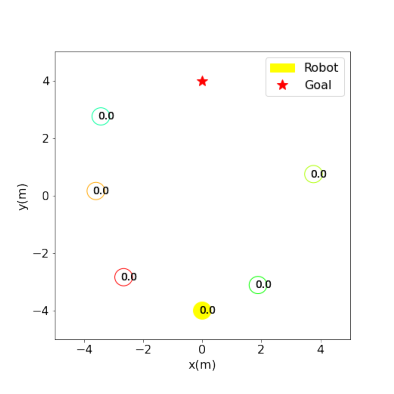

In [25]:
plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())

#### Explorer: a class to run $k$ episodes

It is useful to run a specific episode for testing, it can give us some idea of what is the robot learning to do.

But if we want to have more statistically sounding results, we can implement a class that allows us to run many episodes to test to validate the results of our Policy.

This class will be called `Explorer` and will contain a method called `run_k_episodes`, that takes as input the number of episodes to run `k` and gathers some statistics from the results.

It also contains methods like `update_memory` or `update_target_model` we will get to them later, for now we just want to use this class to run several episodes and get the results.

In [26]:
import copy
import torch

class Explorer(object):
    def __init__(self, env, robot, device, memory=None, gamma=None, target_policy=None):
        self.env = env
        self.robot = robot
        self.device = device
        self.memory = memory
        self.gamma = gamma
        self.target_policy = target_policy
        self.target_model = None

    def update_target_model(self, target_model):
        self.target_model = copy.deepcopy(target_model)

    # @profile
    def run_k_episodes(self, k, phase, update_memory=False, imitation_learning=False, episode=None, forced_update=False, debug=False):
        self.robot.policy.set_phase(phase)
        success_times = []
        collision_times = []
        timeout_times = []
        success = 0
        collision = 0
        timeout = 0
        too_close = 0
        min_dist = []
        cumulative_rewards = []
        collision_cases = []
        timeout_cases = []
        for i in range(k):
            if debug:
                print ('Running episode %d of %d' % (i+1, k))
            ob = self.env.reset(phase)
            done = False
            states = []
            actions = []
            rewards = []
            while not done:
                action = self.robot.act(ob)
                ob, reward, done, info = self.env.step(action)
                states.append(self.robot.policy.last_state)
                actions.append(action)
                rewards.append(reward)

                if isinstance(info, Danger):
                    too_close += 1
                    min_dist.append(info.min_dist)

            if isinstance(info, ReachGoal):
                success += 1
                success_times.append(self.env.global_time)
            elif isinstance(info, Collision):
                collision += 1
                collision_cases.append(i)
                collision_times.append(self.env.global_time)
            elif isinstance(info, Timeout):
                timeout += 1
                timeout_cases.append(i)
                timeout_times.append(self.env.time_limit)
            else:
                raise ValueError('Invalid end signal from environment')

            if update_memory:
                if isinstance(info, ReachGoal) or isinstance(info, Collision) or forced_update:
                    '''Update replay memory: only add positive(success) or negative(collision) experience in experience set '''
                    self.update_memory(states, actions, rewards, imitation_learning)

            cumulative_rewards.append(sum([pow(self.gamma, t * self.robot.time_step * self.robot.v_pref)
                                           * reward for t, reward in enumerate(rewards)]))

        success_rate = success / k
        collision_rate = collision / k
        assert success + collision + timeout == k
        avg_nav_time = sum(success_times) / len(success_times) if success_times else self.env.time_limit

        extra_info = '' if episode is None else 'in episode {} '.format(episode)
        print('{:<5} {}has success rate: {:.2f}, collision rate: {:.2f}, nav time: {:.2f}, total reward: {:.4f}'.
                     format(phase.upper(), extra_info, success_rate, collision_rate, avg_nav_time,
                            average(cumulative_rewards)))
        if phase in ['val', 'test']:
            total_time = sum(success_times + collision_times + timeout_times) * self.robot.time_step
            print('Frequency of being in danger: %.2f and average min separate distance in danger: %.2f' %
                         (too_close / total_time, average(min_dist)))

        print('Collision cases: ' + ' '.join([str(x) for x in collision_cases]))
        print('Timeout cases: ' + ' '.join([str(x) for x in timeout_cases]))
        return average(cumulative_rewards)

    def update_memory(self, states, actions, rewards, imitation_learning=False):
        if self.memory is None or self.gamma is None:
            raise ValueError('Memory or gamma value is not set!')

        for i, state in enumerate(states):
            reward = rewards[i]

            # VALUE UPDATE
            if imitation_learning:
                # define the value of states in IL as cumulative discounted rewards, which is the same in RL
                state = self.target_policy.transform(state)
                # value = pow(self.gamma, (len(states) - 1 - i) * self.robot.time_step * self.robot.v_pref)
                value = sum([pow(self.gamma, max(t - i, 0) * self.robot.time_step * self.robot.v_pref) * reward
                             * (1 if t >= i else 0) for t, reward in enumerate(rewards)])
            else:
                if i == len(states) - 1:
                    # terminal state
                    value = reward
                else:
                    next_state = states[i + 1]
                    gamma_bar = pow(self.gamma, self.robot.time_step * self.robot.v_pref)
                    value = reward + gamma_bar * self.target_model(next_state.unsqueeze(0)).data.item()
            value = torch.Tensor([value]).to(self.device)
            self.memory.push((state, value))


def average(input_list):
    if input_list:
        return sum(input_list) / len(input_list)
    else:
        return 0

Then we can get a better view of how good the policy is.

In [27]:
explorer = Explorer(env, robot, device, gamma=policy.gamma)
reward = explorer.run_k_episodes(10, 'test', debug=True)
print ('Total reward:', reward)

Running episode 1 of 10
Running episode 2 of 10
Running episode 3 of 10
Running episode 4 of 10
Running episode 5 of 10
Running episode 6 of 10
Running episode 7 of 10
Running episode 8 of 10
Running episode 9 of 10
Running episode 10 of 10
TEST  has success rate: 1.00, collision rate: 0.00, nav time: 18.60, total reward: 0.1442
Frequency of being in danger: 0.19 and average min separate distance in danger: 0.18
Collision cases: 
Timeout cases: 
Total reward: 0.1442198944601713


We get a low success rate and reward, why?
Oops, we forgot to train the value network!

## Part III.2. Training our Value Network

### Replay Memory

As before in Section II.2, we will be using experience replay memory for training our Value Network. Recall that it stores the transitions that the agent observes, allowing us to reuse this data later. By sampling from it randomly, the transitions that build up a batch are decorrelated. It has been shown that this greatly stabilizes and improves the training procedure.

For this, we are going to need the class `ReplayMemory`, a cyclic buffer of bounded size that holds the transitions observed recently.

*Side note*: Check how similar is this ReplayMemory class with the one used in Part II.2. You can notice some differences, for example, the previous class implements a `.sample()` method for selecting a random batch of transitions for training. This time we will use the `Dataset` and `DataLoader` class (from torch.utils.data) to sample a random batch from the Dataset.

In [28]:
from torch.utils.data import Dataset


class ReplayMemory(Dataset):
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = list()
        self.position = 0

    def push(self, item):
        # replace old experience with new experience
        if len(self.memory) < self.position + 1:
            self.memory.append(item)
        else:
            self.memory[self.position] = item
        self.position = (self.position + 1) % self.capacity

    def is_full(self):
        return len(self.memory) == self.capacity

    def __getitem__(self, item):
        return self.memory[item]

    def __len__(self):
        return len(self.memory)

    def clear(self):
      self.memory = list()

### The Trainer class

We can use a class to do the training part, this way the main code to train looks cleaner.
This class lets us train the (NN) model of a policy.

The `optimize_batch` method is used as follows:
* A set of training points is randomly sampled from the experience set $E$, which contains state-value pairs from many different simulated trajectories.
* The *Value Network* is finally updated by stochastic gradient descent (back-propagation) on the sampled subset.

The `optimize_epoch` method does the same optimization, using stochastic gradient descent, but for all samples in the experience set $E$.

In [29]:
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import DataLoader


class Trainer(object):
    def __init__(self, model, memory, device, batch_size):
        """
        Train the trainable model of a policy
        """
        self.model = model
        self.device = device
        self.criterion = nn.MSELoss().to(device)
        self.memory = memory
        self.data_loader = None
        self.batch_size = batch_size
        self.optimizer = None

    def set_learning_rate(self, learning_rate):
        print('Current learning rate: %f' % learning_rate)
        self.optimizer = optim.SGD(self.model.parameters(), lr=learning_rate, momentum=0.9)

    def optimize_batch(self, num_batches):
        if self.optimizer is None:
            raise ValueError('Learning rate is not set!')
        if self.data_loader is None:
            self.data_loader = DataLoader(self.memory, self.batch_size, shuffle=True)
        losses = 0
        '''For each batch until num_batches'''
        for _ in range(num_batches):
            '''Sample batch_size elements from the replay memory'''
            inputs, values = next(iter(self.data_loader))
            inputs = Variable(inputs)
            values = Variable(values)

            self.optimizer.zero_grad()
            outputs = self.model(inputs)
            loss = self.criterion(outputs, values)
            '''Accumulate the losses over all the batch elements'''
            loss.backward()
            '''Perform one iteration of gradient descent'''
            self.optimizer.step()
            losses += loss.data.item()

        average_loss = losses / num_batches
        # logging.debug('Average loss : %.2E', average_loss)

        return average_loss
      
      
    def optimize_epoch(self, num_epochs):
      if self.optimizer is None:
          raise ValueError('Learning rate is not set!')
      if self.data_loader is None:
          self.data_loader = DataLoader(self.memory, self.batch_size, shuffle=True)
      average_epoch_loss = 0
      '''An epoch is defined as a training iteration made of all the data in the dataset'''
      for epoch in range(num_epochs):
          epoch_loss = 0
          '''Iterate the batches of size batch_size until all the replay memory has been seen'''
          for batch in self.data_loader:
              inputs, values = batch
              inputs = Variable(inputs)
              values = Variable(values)

              self.optimizer.zero_grad()
              outputs = self.model(inputs)
              loss = self.criterion(outputs, values)
              loss.backward()
              self.optimizer.step()
              epoch_loss += loss.data.item()

          average_epoch_loss = epoch_loss / len(self.memory)
          # logging.debug('Average loss in epoch %d: %.2E', epoch, average_epoch_loss)

      return average_epoch_loss


### A first attempt to train with Deep Reinforcement Learning

Let us now describe the loop used for training with DRL, and coded below.
- First, the value network is initialized by filling the replay memory pool with some experiences (trajectories) generated by our (randomly-initialized) CADRL policy network.
- Then, we choose to iterate over "pseudo-epochs": 
 - we first generate `sample_episodes` and add them to the memory (following the current CADRL value network);
 - we optimize the value network by drawing `num_batches` batches (each of size `batch_size`) from the replay memory, and updating by stochastic gradient descent (back-propagation) on each data batch.
 - we track the average reward over the pseudo epochs.
 
*Side note*: An epoch is formally defined as a training iteration made of all the data in the training set. If we consider the training set to be the replay memory, then one iteration described by `pseudo_epoch` is indeed an epoch if `num_batches * batch_size` $\geq$ `replay_memory_size`. That is why we call it pseudo epoch in case the condition is chosen not to be satisfied.

In [31]:
#@title Configuration of the environment { display-mode: "form" }
import sys
import os
import shutil
import torch
import gym
from gym.envs.registration import register
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML
from crowd_nav_train import *

# Add our policy to the policy list
policy_factory['cadrl'] = CADRL

# delete if it's registered
env_name = 'CrowdSim-v0'
if env_name in gym.envs.registry.env_specs:
    del gym.envs.registry.env_specs[env_name]

register(
  id='CrowdSim-v0',
  entry_point=CrowdSim,
)

_output_dir = 'data/output_DLSchool'
_resume = False
_debug = False

make_new_dir = True
if os.path.exists(_output_dir):
  if not _resume:
    shutil.rmtree(_output_dir)
  else:
    make_new_dir = False
if make_new_dir:
  os.makedirs(_output_dir)
log_file = os.path.join(_output_dir, 'output.log')
il_weight_file = os.path.join(_output_dir, 'il_model.pth')
rl_weight_file = os.path.join(_output_dir, 'rl_model.pth')

# Configure device
mode = 'a' if _resume else 'w'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Using device: %s', device)

# Configure policy
policy = policy_factory['cadrl']()
# Default configuration for robot
policy_config = { 'rl': {'gamma':0.9},
               'om': {'cell_num':4, 'cell_size':1, 'om_channel_size':3}, 
               'action_space': {'speed_samples':5, 'rotation_samples':16, 'sampling':'exponential', 'query_env':True},# Action space size is speed_samples * rotation_samples + 1
               'cadrl': {'mlp_dims':'150, 100, 100, 1', 'multiagent_training':False}
}
policy.configure(policy_config)
policy.set_device(device)

# Configure environment
env = gym.make('CrowdSim-v0')
# Default configuration
env_config = { 'env': {
                        'time_limit':25, 
                        'time_step':0.25, 
                        #'val_size':100, 
                        'val_size':10, 
                        #'test_size':500, 
                        'test_size':50
                      }, 
               'reward': {'success_reward':1, 'collision_penalty':-0.25, 'discomfort_dist':0.2, 'discomfort_penalty_factor':0.5},
               'sim': {'train_val_sim':'circle_crossing', 'test_sim':'circle_crossing', 'square_width':10, 'circle_radius':4, 'human_num':5},
               'humans': {'visible':True, 'policy':'orca', 'radius':0.3, 'v_pref':1},
               'robot': {'visible':False, 'policy':'cadrl', 'radius':0.3, 'v_pref':1}
             }
env.configure(env_config)

robot = Robot(env_config, 'robot')
env.set_robot(robot)

# Initial learning rate of the network
rl_learning_rate = 0.001
# Number of times we sample from the memory when training in batches
num_batches = 2
# Number of episodes
total_pseudo_epochs = 10
sample_episodes = 1
target_update_interval = 2
evaluation_interval = 2
capacity = 1000
epsilon_start = 0.5
epsilon_end = 0.1
epsilon_decay = 4
checkpoint_interval = 2

# Configure trainer and explorer
memory = ReplayMemory(capacity)
model = policy.get_model()
batch_size = 10
trainer = Trainer(model, memory, device, batch_size)
explorer = Explorer(env, robot, device, memory, policy.gamma, target_policy=policy)

explorer.update_target_model(model)

# reinforcement learning
policy.set_env(env)
robot.set_policy(policy)
robot.print_info()
trainer.set_learning_rate(rl_learning_rate)
robot.policy.set_epsilon(epsilon_end)

Using device: %s cuda:0
Policy: CADRL without occupancy map
human number: 5
Not randomize human's radius and preferred speed
Training simulation: circle_crossing, test simulation: circle_crossing
Square width: 10, circle width: 4
Agent is invisible
Current learning rate: 0.001000


In [ ]:
## Remember to run the code above (Configuration of the environment) everytime you want to run this snippet of code

# Fill the memory pool with some RL experience
explorer.run_k_episodes(10, 'train', update_memory=True, episode=0, forced_update=True)
print('Experience set size: %d/%d' % (len(memory), memory.capacity))

pseudo_epoch = 0
avg_reward_per_episode = []

while pseudo_epoch < total_pseudo_epochs:
  if pseudo_epoch < epsilon_decay:
    epsilon = epsilon_start + (epsilon_end - epsilon_start) / epsilon_decay * pseudo_epoch
  else:
    epsilon = epsilon_end
  robot.policy.set_epsilon(epsilon)

  # sample k=sample_episodes episodes into memory
  val_reward = explorer.run_k_episodes(sample_episodes, 'train', update_memory=True, episode=pseudo_epoch)
  # optimize over the generated memory
  trainer.optimize_batch(num_batches)
  pseudo_epoch += 1
  
  avg_reward_per_episode.append(val_reward)

  if pseudo_epoch % target_update_interval == 0:
    explorer.update_target_model(model)

  if pseudo_epoch != 0 and pseudo_epoch % checkpoint_interval == 0:
    torch.save(model.state_dict(), rl_weight_file)

plt.plot(avg_reward_per_episode)
plt.show()

TRAIN in episode 0 has success rate: 0.00, collision rate: 0.00, nav time: 25.00, total reward: 0.0000
Collision cases: 
Timeout cases: 0 1 2 3 4 5 6 7 8 9
Experience set size: 970/1000
TRAIN in episode 0 has success rate: 0.00, collision rate: 0.00, nav time: 25.00, total reward: 0.0000
Collision cases: 
Timeout cases: 0
TRAIN in episode 1 has success rate: 0.00, collision rate: 0.00, nav time: 25.00, total reward: 0.0000
Collision cases: 
Timeout cases: 0
TRAIN in episode 2 has success rate: 0.00, collision rate: 0.00, nav time: 25.00, total reward: 0.0000
Collision cases: 
Timeout cases: 0
TRAIN in episode 3 has success rate: 0.00, collision rate: 0.00, nav time: 25.00, total reward: 0.0000
Collision cases: 
Timeout cases: 0


**Conclusion of RL training only**:  

Though the training has been very short (10 pseudo epoch) for the sake of time, it is often in general and almost systematic on this type of task that RL training only is not sufficient to converge to maximal reward. This is mainly due to the exploration which must be good enough to experience "collision", "too close to human" or "distance to goal reducing". Random exploration (from ε-greedy or initially random network weights) is often not efficient enough to get meaningful and exploitable reward. 

This is a very common phenomenon for complex environments: see, e.g., the study of A3C (an advanced policy-gradient DRL technique) on Starcraft (<a href='https://arxiv.org/abs/1807.08217'>arxiv link</a>).
One way to try to mitigate this issue is to initialize the network with supervised learning, for example in the flavor of so-called **Imitation learning**.

### Initialization with Imitation Learning

Imitation learning consists in initializing the value network by supervised training on a set of trajectories generated by a baseline policy (guess which baseline policy?).

Specifically, each training trajectory is processed to generate a set of state-value pairs, $\{(s^{jn},y_k)\}_{k=1}^{N}$, where $y=\gamma^{t_g \cdot v_{pref}}$ and $t_g$ is the time to reach the goal. The value network is trained by back-propagation to minimize a quadratic regression error,

$\arg\min_w \sum_{k=1}^{N}(y_k-V(s_k^{jn}; w))^2$.

**Did you guess which baseline policy we can use?**

This work uses Optimal Reciprocal Collision Avoidance ([ORCA](http://gamma.cs.unc.edu/ORCA/publications/ORCA.pdf)) [11] to generate a training set of trajectories containing state-value pairs.

We make a few remarks about this initialization step:
1. The training trajectories do not have to be optimal.
2. The initialization training step is not simply emulating the ORCA policy. Rather, it learns a time to goal estimate (value function), which can then be used to generate new trajectories. Evidently, this learned value function sometimes generates better (i.e. shorter time to goal) trajectories than ORCA.
3. This learned value function is likely to be suboptimal.

In [ ]:
#@title Configuration of the environment { display-mode: "form" }
import sys
import os
import shutil
import torch
import gym
from gym.envs.registration import register
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML
from crowd_nav_train import *

# Add our policy to the policy list
policy_factory['cadrl'] = CADRL

# delete if it's registered
env_name = 'CrowdSim-v0'
if env_name in gym.envs.registry.env_specs:
    del gym.envs.registry.env_specs[env_name]

register(
  id='CrowdSim-v0',
  entry_point=CrowdSim,
)

_output_dir = 'data/output_DLSchool'
_resume = False
_debug = False

make_new_dir = True
if os.path.exists(_output_dir):
  if not _resume:
    shutil.rmtree(_output_dir)
  else:
    make_new_dir = False
if make_new_dir:
  os.makedirs(_output_dir)
log_file = os.path.join(_output_dir, 'output.log')
il_weight_file = os.path.join(_output_dir, 'il_model.pth')
rl_weight_file = os.path.join(_output_dir, 'rl_model.pth')

# Configure device
mode = 'a' if _resume else 'w'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Using device: %s', device)

# Configure policy
policy = policy_factory['cadrl']()
# Default configuration for robot
policy_config = { 'rl': {'gamma':0.9},
               'om': {'cell_num':4, 'cell_size':1, 'om_channel_size':3}, 
               'action_space': {'speed_samples':5, 'rotation_samples':16, 'sampling':'exponential', 'query_env':True},# Action space size is speed_samples * rotation_samples + 1
               'cadrl': {'mlp_dims':'150, 100, 100, 1', 'multiagent_training':False}
             }
policy.configure(policy_config)
policy.set_device(device)

# Configure environment
env = gym.make('CrowdSim-v0')
# Default configuration
env_config = { 'env': {
                        'time_limit':25, 
                        'time_step':0.25, 
                        #'val_size':100, 
                        'val_size':10, 
                        #'test_size':500, 
                        'test_size':50
                      }, 
               'reward': {'success_reward':1, 'collision_penalty':-0.25, 'discomfort_dist':0.2, 'discomfort_penalty_factor':0.5},
               'sim': {'train_val_sim':'circle_crossing', 'test_sim':'circle_crossing', 'square_width':10, 'circle_radius':4, 'human_num':5},
               'humans': {'visible':True, 'policy':'orca', 'radius':0.3, 'v_pref':1},
               'robot': {'visible':False, 'policy':'cadrl', 'radius':0.3, 'v_pref':1}
             }
env.configure(env_config)

robot = Robot(env_config, 'robot')
env.set_robot(robot)

rl_learning_rate = 0.001
num_batches = 2
total_pseudo_epochs = 10
sample_episodes = 1
target_update_interval = 2
evaluation_interval = 2
capacity = 100
epsilon_start = 0.5
epsilon_end = 0.1
epsilon_decay = 4
checkpoint_interval = 2

# Configure trainer and explorer
memory = ReplayMemory(capacity)
model = policy.get_model()
batch_size = 10
trainer = Trainer(model, memory, device, batch_size)
explorer = Explorer(env, robot, device, memory, policy.gamma, target_policy=policy)

# imitation learning config
il_episodes = 10
il_policy = 'orca'
il_epochs = 50
il_learning_rate = 0.01
trainer.set_learning_rate(il_learning_rate)
safety_space = 0.15
il_policy = policy_factory[il_policy]()
il_policy.multiagent_training = policy.multiagent_training
il_policy.safety_space = safety_space
robot.set_policy(il_policy)

Using device: %s cuda:0
Policy: CADRL without occupancy map
human number: 5
Not randomize human's radius and preferred speed
Training simulation: circle_crossing, test simulation: circle_crossing
Square width: 10, circle width: 4
Current learning rate: 0.010000


TRAIN has success rate: 1.00, collision rate: 0.00, nav time: 9.65, total reward: 0.3753
Collision cases: 
Timeout cases: 
Finish imitation learning. Weights saved.
Experience set size: 100/100
Agent is invisible
Current learning rate: 0.001000
TRAIN in episode 0 has success rate: 0.00, collision rate: 1.00, nav time: 25.00, total reward: -0.1624
Collision cases: 0
Timeout cases: 
TRAIN in episode 1 has success rate: 1.00, collision rate: 0.00, nav time: 12.25, total reward: 0.2824
Collision cases: 
Timeout cases: 
TRAIN in episode 2 has success rate: 0.00, collision rate: 1.00, nav time: 25.00, total reward: -0.1516
Collision cases: 0
Timeout cases: 
TRAIN in episode 3 has success rate: 0.00, collision rate: 1.00, nav time: 25.00, total reward: -0.2826
Collision cases: 0
Timeout cases: 
TRAIN in episode 4 has success rate: 1.00, collision rate: 0.00, nav time: 12.00, total reward: 0.2900
Collision cases: 
Timeout cases: 
TRAIN in episode 5 has success rate: 1.00, collision rate: 0.00,

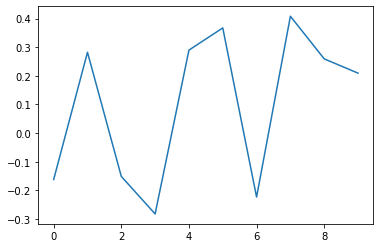

In [ ]:
## Remember to run the code above (Configuration of the environment) everytime you want to run this snippet of code

# imitation learning
explorer.run_k_episodes(il_episodes, 'train', update_memory=True, imitation_learning=True)
trainer.optimize_epoch(il_epochs)
torch.save(model.state_dict(), il_weight_file)
print('Finish imitation learning. Weights saved.')
print('Experience set size: %d/%d' % (len(memory), memory.capacity))

explorer.update_target_model(model)

# reinforcement learning
policy.set_env(env)
robot.set_policy(policy)
robot.print_info()
trainer.set_learning_rate(rl_learning_rate)
# fill the memory pool with some RL experience
avg_reward_per_episode = []
pseudo_epoch = 0
while pseudo_epoch < total_pseudo_epochs:
  if pseudo_epoch < epsilon_decay:
    epsilon = epsilon_start + (epsilon_end - epsilon_start) / epsilon_decay * pseudo_epoch
  else:
    epsilon = epsilon_end
  robot.policy.set_epsilon(epsilon)

  # sample k episodes into memory and optimize over the generated memory
  val_reward = explorer.run_k_episodes(sample_episodes, 'train', update_memory=True, episode=pseudo_epoch)
  trainer.optimize_batch(num_batches)
  pseudo_epoch += 1
  
  avg_reward_per_episode.append(val_reward)

  if pseudo_epoch % target_update_interval == 0:
    explorer.update_target_model(model)

  if pseudo_epoch != 0 and pseudo_epoch % checkpoint_interval == 0:
    torch.save(model.state_dict(), rl_weight_file)

# final test
# explorer.run_k_episodes(env.case_size['test'], 'test', episode=pseudo_epoch)
plt.plot(avg_reward_per_episode)
plt.show()

The training we have performed so far is short.

* Train with a batch size of 10.

* For imitation learning, we collected 10 episodes demonstration using ORCA and trained the policy 50 epochs with learning rate 0.01.

* For reinforcement learning, the learning rate is 0.001 and the discount factor $\gamma$ is 0.9. The exploration rate of the ε-greedy policy decays linearly from 0.5 to 0.1 in the first 4 episodes and stays in 0.1 for the remainig 6 episodes.

We can load the weights of a network trained with the following characteristics:

* Train with a batch size of 100.

* For imitation learning, we collected 3k episodes demonstration using ORCA and trained the policy 50 epochs with learning rate 0.01.

* For reinforcement learning, the learning rate is 0.001 and the discount factor $\gamma$ is 0.9. The exploration rate of the ε-greedy policy decays linearly from 0.5 to 0.1 in the first 4k episodes and stays in 0.1 for the remainig 6k episodes.

To fully train this network would take around 10 hours.

In [ ]:
#@title Configuration of the environment { display-mode: "form" }
import argparse
import configparser
import os
import torch
import numpy as np
import gym
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML

from gym.envs.registration import register

# delete if it's registered
env_name = 'CrowdSim-v0'
if env_name in gym.envs.registry.env_specs:
    del gym.envs.registry.env_specs[env_name]

register(
  id='CrowdSim-v0',
  entry_point=CrowdSim,
)

# Load the weights of the model
# [Mig]
model_weights = 'cadrl_rl_model.pth'

# Configure device
## Use the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Using device: %s', device)

# Configure policy
policy = policy_factory['cadrl']()
# Default configuration for robot
policy_config = { 'rl': {'gamma':0.9},
               'om': {'cell_num':4, 'cell_size':1, 'om_channel_size':3}, 
               'action_space': {'speed_samples':5, 'rotation_samples':16, 'sampling':'exponential', 'query_env':True},# Action space size is speed_samples * rotation_samples + 1
               'cadrl': {'mlp_dims':'150, 100, 100, 1', 'multiagent_training':False},
             }
policy.configure(policy_config)
policy.get_model().load_state_dict(torch.load(model_weights))

# Configure environment
env = gym.make('CrowdSim-v0')
# Default configuration
env_config = { 'env': {'time_limit':25, 'time_step':0.25, 'val_size':100, 'test_size':500}, 
               'reward': {'success_reward':1, 'collision_penalty':-0.25, 'discomfort_dist':0.2, 'discomfort_penalty_factor':0.5},
               'sim': {'train_val_sim':'circle_crossing', 'test_sim':'circle_crossing', 'square_width':10, 'circle_radius':4, 'human_num':5},
               'humans': {'visible':True, 'policy':'orca', 'radius':0.3, 'v_pref':1},
               'robot': {'visible':False, 'policy':'cadrl', 'radius':0.3, 'v_pref':1}
             }
env.configure(env_config)

robot = Robot(env_config, 'robot')
robot.set_policy(policy)
env.set_robot(robot)

policy.set_phase('test')
policy.set_device(device)
policy.set_env(env)

robot.print_info()

Using device: %s cuda:0
Policy: CADRL without occupancy map
human number: 5
Not randomize human's radius and preferred speed
Training simulation: circle_crossing, test simulation: circle_crossing
Square width: 10, circle width: 4
Agent is invisible


It takes 0.25 seconds to finish. Final status is 
It takes 0.50 seconds to finish. Final status is 
It takes 0.75 seconds to finish. Final status is 
It takes 1.00 seconds to finish. Final status is 
It takes 1.25 seconds to finish. Final status is 
It takes 1.50 seconds to finish. Final status is 
It takes 1.75 seconds to finish. Final status is 
It takes 2.00 seconds to finish. Final status is 
It takes 2.25 seconds to finish. Final status is 
It takes 2.50 seconds to finish. Final status is 
It takes 2.75 seconds to finish. Final status is 
It takes 3.00 seconds to finish. Final status is 
It takes 3.25 seconds to finish. Final status is 
It takes 3.50 seconds to finish. Final status is 
It takes 3.75 seconds to finish. Final status is 
It takes 4.00 seconds to finish. Final status is 
It takes 4.25 seconds to finish. Final status is 
It takes 4.50 seconds to finish. Final status is Too close
It takes 4.75 seconds to finish. Final status is Too close
It takes 5.00 seconds to finish.

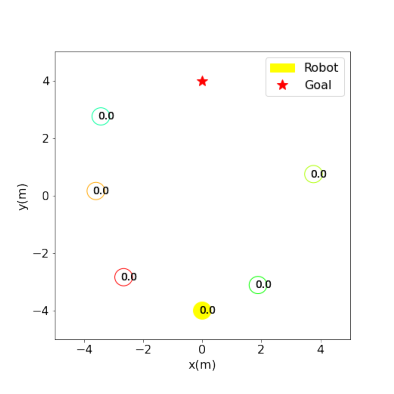

In [ ]:
## Remember to run the code above (Configuration of the environment) everytime you want to run this snippet of code

ob = env.reset('test')
done = False
last_pos = np.array(robot.get_position())
frames = []
while not done:
  action = robot.act(ob)
  ob, _, done, info = env.step(action)
  current_pos = np.array(robot.get_position())
  # logging.debug('Speed: %.2f', np.linalg.norm(current_pos - last_pos) / robot.time_step)
  last_pos = current_pos
  frames.append(env.render(mode='rgb_array'))
  print('It takes %.2f seconds to finish. Final status is %s' % (env.global_time, info))

plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
HTML(ani.to_jshtml())

If you want to go deeper in the way the whole system is built and try a more sophisticated Value Network, like the one proposed by [Chen, Liu Kreiss and Alahi](https://arxiv.org/pdf/1809.08835.pdf), you can follow the Annex of this tutorial.

# Annex

We included this part in the tutorial, in case you want to deeply explore how each component of the whole Reinforcement Learning process is coded.

<img src="https://lh3.google.com/u/0/d/1XfJxd0wwCfjvdBJXj4i_8iLS9MUdZuKC=w3840-h1820-iv1" width="400">

### States

Let's start with the different states:

<img src="https://lh3.google.com/u/0/d/1zwZxhnKhKG3uS7hKgT9GK1NLZ-GTpldu=w3840-h1195-iv7" width="400">

Here the class diagram for the states:

<img src="https://lh3.google.com/u/0/d/1f620PPByh6T81WsyrKsQv54-OUppXYIl=w3840-h1820-iv2" width="400">

`ObservableState` corresponds to the general state of robot or human.

`FullState` is the state of the robot, it has a goal position and prefered speed.

`JointState` is the state of the environment at a given point of time, composed by the robot's state and the state of all the humans in the environment.

#### Human State
For each agent (robot or human), the position $p = [p_x, p_y]$, velocity $v = [v_x, v_y]$ and radius $r$ can be observed by the others.

<img src="https://lh3.google.com/u/0/d/1xx80dsC87ENYPDIjzNas398Q6euI-BJS=w1924-h696-iv1" width="400">

#### Robot State
The robot is also aware of its unobservable state including the goal position $p_g$ and preferred speed $v_{pref}$.

<img src="https://lh3.google.com/u/0/d/1s7HIlBiKE1SgEm9gvu6Rs6GJlbkZVzM4=w1924-h696-iv1" width="400">

In [ ]:
class FullState(object):
  def __init__(self, px, py, vx, vy, radius, gx, gy, v_pref, theta):
    self.px = px
    self.py = py
    self.vx = vx
    self.vy = vy
    self.radius = radius
    self.gx = gx
    self.gy = gy
    self.v_pref = v_pref
    self.theta = theta
    
    self.position = (self.px, self.py)
    self.goal_position = (self.gx, self.gy)
    self.velocity = (self.vx, self.vy)
  
  def __add__(self, other):
    return other + (self.px, self.py, self.vx, self.vy, self.radius, self.gx, self.gy, self.v_pref, self.theta)
  
  def __str__(self):
    return ' '.join([str(x) for x in [self.px, self.py, self.vx, self.vy, self.radius, self.gx, self.gy, self.v_pref, self.theta]])

#### State of the Environment

Let $w_t = [w_t^1, w_t^2, ..., w_t^n]$ denote the state of humans, and $s_t$ denote the state of the robot at time $t$.
The joint state for robot navigation is defined as $s_t^{jn} = [s_t, w_t]$.

<img src="https://lh3.google.com/u/0/d/1Ps4dkfquO7amzxHxVgIQNqLSSMdp8a8P=w1924-h696-iv1" width="400">

In [ ]:
class JointState(object):
  def __init__(self, self_state, human_states):
    assert isinstance(self_state, FullState)
    for human_state in human_states:
      assert isinstance(human_state, ObservableState)

    self.self_state = self_state
    self.human_states = human_states

### Actions

We assume that the velocity of the robot can be achieved instantly after the action command $a_t$, i.e. $v_t=a_t$.

<img src="https://lh3.google.com/u/0/d/1tjNEqGCDF3NAsI0j4o59kuD-98CvpzAT=w1924-h696-iv1" width="400">

The action the robot can perform is a tuple `(vx, vy)` that is the new bidimensional velocity it will achieve.

In [ ]:
from collections import namedtuple

ActionXY = namedtuple('ActionXY', ['vx', 'vy'])

policy_factory = dict()

### Agent

Here, the class diagram of Agent, Robot and Human:

<img src="https://lh3.google.com/u/0/d/1AHRonKqWSNlqPPRjNvnwbRlv5Zj95DRn=w3840-h1820-iv1" width="400">

Let's build the body of our agent. Human and robot behave similarly in our simulation, so we can have a class for both.

In the class `Agent` we have three particular functions:

* `compute_position`:  computes the next position $p_{t+1}$ of the agent:
> $p_{t+1} = p_t + v \times \Delta t$,
> where $p_t$ is the last position, $v$ is the velocity and $\Delta t$ is the time-step.

* `step`:  performs an action (computes the next position with `compute_position`) and updates the state.

* `reached_destination`: checks whether the agent has reached the goal position.

In [ ]:
import numpy as np
from numpy.linalg import norm
import abc

class Agent(object):
  def __init__(self, config, section):
    """
    Base class for robot and human. Have the physical attributes of an agent.
    """
    self.visible = config[section]['visible']
    self.v_pref = config[section]['v_pref']
    self.radius = config[section]['radius']
    self.policy = policy_factory[config[section]['policy']]()
    self.px = None
    self.py = None
    self.gx = None
    self.gy = None
    self.vx = None
    self.vy = None
    self.theta = None
    self.time_step = None

  def print_info(self):
    print('Agent is {}'.format(
      'visible' if self.visible else 'invisible'))

  def set_policy(self, policy):
    self.policy = policy

  def set(self, px, py, gx, gy, vx, vy, theta, radius=None, v_pref=None):
    self.px = px
    self.py = py
    self.gx = gx
    self.gy = gy
    self.vx = vx
    self.vy = vy
    self.theta = theta
    if radius is not None:
      self.radius = radius
    if v_pref is not None:
      self.v_pref = v_pref

  def get_observable_state(self):
    return ObservableState(self.px, self.py, self.vx, self.vy, self.radius)

  def get_next_observable_state(self, action):
    self.check_validity(action)
    pos = self.compute_position(action, self.time_step)
    next_px, next_py = pos
    next_vx = action.vx
    next_vy = action.vy
    return ObservableState(next_px, next_py, next_vx, next_vy, self.radius)

  def get_full_state(self):
    return FullState(self.px, self.py, self.vx, self.vy, self.radius, self.gx, self.gy, self.v_pref, self.theta)

  def get_position(self):
    return self.px, self.py

  def set_position(self, position):
    self.px = position[0]
    self.py = position[1]

  def get_goal_position(self):
    return self.gx, self.gy

  def get_velocity(self):
    return self.vx, self.vy

  def set_velocity(self, velocity):
    self.vx = velocity[0]
    self.vy = velocity[1]

  @abc.abstractmethod
  def act(self, ob):
    """
    Compute state using received observation and pass it to policy
    """
    return

  def check_validity(self, action):
    assert isinstance(action, ActionXY)

  def compute_position(self, action, delta_t):
    self.check_validity(action)
    px = self.px + action.vx * delta_t
    py = self.py + action.vy * delta_t
    return px, py

  def step(self, action):
    """
    Perform an action and update the state
    """
    self.check_validity(action)
    pos = self.compute_position(action, self.time_step)
    self.px, self.py = pos
    self.vx = action.vx
    self.vy = action.vy

  def reached_destination(self):
    return norm(np.array(self.get_position()) - np.array(self.get_goal_position())) < self.radius


#### Robot
We can now define the behavior of our `Robot`. It is a class that inherits from the `Agent` class and has an extra method:
* `act`: given the observation of the current state predicts the next action using the `policy`.

In [ ]:
class Robot(Agent):
  def __init__(self, config, section):
    super().__init__(config, section)

  def act(self, ob):
    if self.policy is None:
      raise AttributeError('Policy attribute has to be set!')
    state = JointState(self.get_full_state(), ob)
    action = self.policy.predict(state)
    return action

#### Human

And the behavior of our `Human` agent is similar to that of `Robot`.

In [ ]:
class Human(Agent):
  def __init__(self, config, section):
    super().__init__(config, section)

  def act(self, ob):
    """
    The state for human is its full state and all other agents' observable states
    :param ob:
    :return:
    """
    state = JointState(self.get_full_state(), ob)
    action = self.policy.predict(state)
    return action

### Environment

Now we can define our simulation environment.

First we define some classes for general information about the state of the robot.

In [ ]:
class Timeout(object):
  def __init__(self):
    pass

  def __str__(self):
    return 'Timeout'


class ReachGoal(object):
  def __init__(self):
    pass

  def __str__(self):
    return 'Reaching goal'


class Danger(object):
  def __init__(self, min_dist):
    self.min_dist = min_dist

  def __str__(self):
    return 'Too close'


class Collision(object):
  def __init__(self):
    pass

  def __str__(self):
    return 'Collision'


class Nothing(object):
  def __init__(self):
    pass

  def __str__(self):
    return ''

How to compute the closest distance a line segment with endpoints $(x_1, y_1)$, $(x_2, y_2)$ and a point $(x_3, y_3)$? [Refer here for the maths](http://paulbourke.net/geometry/pointlineplane/).

In [ ]:
import numpy as np

def point_to_segment_dist(x1, y1, x2, y2, x3, y3):
  """
  Calculate the closest distance between point(x3, y3) and a line segment with two endpoints (x1, y1), (x2, y2)
  """
  px = x2 - x1
  py = y2 - y1

  if px == 0 and py == 0:
    return np.linalg.norm((x3-x1, y3-y1))

  u = ((x3 - x1) * px + (y3 - y1) * py) / (px * px + py * py)

  if u > 1:
    u = 1
  elif u < 0:
    u = 0

  # (x, y) is the closest point to (x3, y3) on the line segment
  x = x1 + u * px
  y = y1 + u * py

  return np.linalg.norm((x - x3, y-y3))

Finally we can prepare the class for our simulation environment.

Here we show the class diagram of CrowdSim:

<img src="https://lh3.google.com/u/0/d/1fp08kknXxceGm6JuM61Jm370xADwacy1=w3840-h1195-iv1" height="400">

This is the class that simulates the movement of the agents (humans or robot). This class inherits from gym.Env.

If you want to create your own custom environment, please refer to [this tutorial](https://medium.com/@apoddar573/making-your-own-custom-environment-in-gym-c3b65ff8cdaa), a gym environment is basically a class with 4 functions:
* `__init__`: is the initialization function of the class, which take no additional parameters and initializes the class.
* `step`: Will take an action as parameter, and returns a list of four variables — the next state, the reward for the current state, a boolean representing whether the current episode of our model is done and some additional info on our problem.
* `reset`: resets the state and other variables of the environment to the initial state.
* `render`: gives out relevant information to plot about the behavior of our environment.

So, when we create a custom environment, we need at least these four functions in the environment.

The extra functions are:

* `generate_random_human_position`: 
The humans are controlled by an unknown and fixed policy. Here we present a smaller version of the complete Crowd Simulation environment developed in the work of the [ICRA 2018 paper](https://github.com/vita-epfl/CrowdNav/blob/master/crowd_sim/envs/crowd_sim.py).
In this case we only consider the `generate_circle_crossing_human` rule for the humans, where humans are modelled to start moving from a position in the diameter of a circle and their goal position is at the opposite side.
<!-- We don't simulate the `square_crossing` scenario where a human walks from one side of the y-axis to the other side, or the `mixed` scenario where some humans walk according to the `square_crossing` rule and others walk according to the `circle_crossing` rule. -->

* `onestep_lookahead`: The difference between this function and `step` is that in this case we don't update the current state of the agent.

In [ ]:
import gym
import matplotlib.lines as mlines
import numpy as np
import rvo2
from matplotlib import patches
import matplotlib.pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvasAgg
from numpy.linalg import norm
from PIL import Image

class CrowdSim(gym.Env):
  def __init__(self):
    """
    Movement simulation for n+1 agents
    Agent can either be human or robot.
    humans are controlled by a unknown and fixed policy.
    robot is controlled by a known and learnable policy.
    """
    self.time_limit = None
    self.time_step = None
    self.robot = None
    self.humans = None
    self.global_time = None
    # reward function
    self.success_reward = None
    self.collision_penalty = None
    self.discomfort_dist = None
    self.discomfort_penalty_factor = None
    # simulation configuration
    self.config = None
    self.case_capacity = None
    self.case_size = None
    self.case_counter = None
    self.train_val_sim = None
    self.test_sim = None
    self.square_width = None
    self.circle_radius = None
    self.human_num = None
    # for visualization
    self.states = None
    self.action_values = None
    self.attention_weights = None

  def configure(self, config):
    self.config = config
    self.time_limit = config['env']['time_limit']
    self.time_step = config['env']['time_step']
    self.success_reward = config['reward']['success_reward']
    self.collision_penalty = config['reward']['collision_penalty']
    self.discomfort_dist = config['reward']['discomfort_dist']
    self.discomfort_penalty_factor = config['reward']['discomfort_penalty_factor']
    if self.config['humans']['policy'] == 'orca':
      self.case_capacity = {'train': np.iinfo(np.uint32).max - 2000, 'val': 1000, 'test': 1000}
      self.case_size = {'train': np.iinfo(np.uint32).max - 2000, 'val': config['env']['val_size'],
                'test': config['env']['test_size']}
      self.train_val_sim = config['sim']['train_val_sim']
      self.test_sim = config['sim']['test_sim']
      self.square_width = config['sim']['square_width']
      self.circle_radius = config['sim']['circle_radius']
      self.human_num = config['sim']['human_num']
    else:
      raise NotImplementedError
    self.case_counter = {'train': 0, 'test': 0, 'val': 0}

    print('human number: {}'.format(self.human_num))
    print("Not randomize human's radius and preferred speed")
    print('Training simulation: {}, test simulation: {}'.format(self.train_val_sim, self.test_sim))
    print('Square width: {}, circle width: {}'.format(self.square_width, self.circle_radius))

  def set_robot(self, robot):
    self.robot = robot

  def generate_random_human_position(self, human_num, rule):
    """
    Generate human position according to the circle crossing rule
    circle crossing rule: generate start position on a circle, goal position is at the opposite side
    :param human_num:
    :param rule:
    :return:
    """
    if rule == 'circle_crossing':
      # initial min separation distance to avoid danger penalty at beginning
      self.humans = []
      for i in range(human_num):
        self.humans.append(self.generate_circle_crossing_human())
    else:
      raise ValueError("Rule doesn't exist")

  def generate_circle_crossing_human(self):
    human = Human(self.config, 'humans')
    # Generate random initial positions and velocities for the humans in the circle until their original positions don't collide
    # with the robot, another human or the goal position.
    while True:
      angle = np.random.random() * np.pi * 2
      # add some noise to simulate all the possible cases robot could meet with human
      px_noise = (np.random.random() - 0.5) * human.v_pref
      py_noise = (np.random.random() - 0.5) * human.v_pref
      px = self.circle_radius * np.cos(angle) + px_noise
      py = self.circle_radius * np.sin(angle) + py_noise
      collide = False
      for agent in [self.robot] + self.humans:
        min_dist = human.radius + agent.radius + self.discomfort_dist
        if norm((px - agent.px, py - agent.py)) < min_dist or \
            norm((px - agent.gx, py - agent.gy)) < min_dist:
          collide = True
          break
      if not collide:
        break
    human.set(px, py, -px, -py, 0, 0, 0)
    return human

  def reset(self, phase='test', test_case=None):
    """
    Set px, py, gx, gy, vx, vy for robot and humans
    test_case is used to initialize the random seed, for reproducibility of the test case.
    :return:
    """
    if self.robot is None:
      raise AttributeError('robot has to be set!')
    assert phase in ['train', 'val', 'test']
    if test_case is not None:
      self.case_counter[phase] = test_case
    self.global_time = 0
    # Added if robot.policy is None so that it works without setting a policy
    if self.robot.policy is None or not self.robot.policy.multiagent_training:
      self.train_val_sim = 'circle_crossing'

    counter_offset = {'train': self.case_capacity['val'] + self.case_capacity['test'],
              'val': 0, 'test': self.case_capacity['val']}
    self.robot.set(0, -self.circle_radius, 0, self.circle_radius, 0, 0, np.pi / 2)

    np.random.seed(counter_offset[phase] + self.case_counter[phase])
    if phase in ['train', 'val']:
      human_num = self.human_num if self.robot.policy.multiagent_training else 1
      self.generate_random_human_position(human_num=human_num, rule=self.train_val_sim)
    else:
      self.generate_random_human_position(human_num=self.human_num, rule=self.test_sim)
    # case_counter is always between 0 and case_size[phase]
    self.case_counter[phase] = (self.case_counter[phase] + 1) % self.case_size[phase]

    for agent in [self.robot] + self.humans:
      agent.time_step = self.time_step
      agent.policy.time_step = self.time_step

    self.states = list()
    if hasattr(self.robot.policy, 'action_values'):
      self.action_values = list()
    if hasattr(self.robot.policy, 'get_attention_weights'):
      self.attention_weights = list()

    # get current observation
    ob = [human.get_observable_state() for human in self.humans]
    return ob

  def onestep_lookahead(self, action):
    return self.step(action, update=False)

  def step(self, action, update=True):
    """
    Compute actions for all agents, detect collision, update environment and return (ob, reward, done, info)
    """
    human_actions = []
    for human in self.humans:
      # observation for humans is always coordinates
      ob = [other_human.get_observable_state() for other_human in self.humans if other_human != human]
      if self.robot.visible:
        ob += [self.robot.get_observable_state()]
      human_actions.append(human.act(ob))

    # collision detection
    dmin = float('inf')
    collision = False
    for i, human in enumerate(self.humans):
      # Human position with respect to the robot
      px = human.px - self.robot.px
      py = human.py - self.robot.py
      vx = human.vx - action.vx
      vy = human.vy - action.vy
      ex = px + vx * self.time_step
      ey = py + vy * self.time_step
      # closest distance between boundaries of two agents
      closest_dist = point_to_segment_dist(px, py, ex, ey, 0, 0) - human.radius - self.robot.radius
      if closest_dist < 0:
        collision = True
        # logging.debug("Collision: distance between robot and p{} is {:.2E}".format(i, closest_dist))
        break
      elif closest_dist < dmin:
        dmin = closest_dist

    # collision detection between humans
    human_num = len(self.humans)
    for i in range(human_num):
      for j in range(i + 1, human_num):
        dx = self.humans[i].px - self.humans[j].px
        dy = self.humans[i].py - self.humans[j].py
        dist = (dx ** 2 + dy ** 2) ** (1 / 2) - self.humans[i].radius - self.humans[j].radius
        if dist < 0:
          # detect collision but don't take humans' collision into account
          print('Collision happens between humans in step()')

    # check if reaching the goal
    end_position = np.array(self.robot.compute_position(action, self.time_step))
    reaching_goal = norm(end_position - np.array(self.robot.get_goal_position())) < self.robot.radius

    if self.global_time >= self.time_limit - 1:
      reward = 0
      done = True
      info = Timeout()
    elif collision:
      reward = self.collision_penalty
      done = True
      info = Collision()
    elif reaching_goal:
      reward = self.success_reward
      done = True
      info = ReachGoal()
    elif dmin < self.discomfort_dist:
      # only penalize agent for getting too close if it's visible
      # adjust the reward based on FPS
      reward = (dmin - self.discomfort_dist) * self.discomfort_penalty_factor * self.time_step
      done = False
      info = Danger(dmin)
    else:
      reward = 0
      done = False
      info = Nothing()

    if update:
      # store state, action value and attention weights
      self.states.append([self.robot.get_full_state(), [human.get_full_state() for human in self.humans]])
      if hasattr(self.robot.policy, 'action_values'):
        self.action_values.append(self.robot.policy.action_values)
      if hasattr(self.robot.policy, 'get_attention_weights'):
        self.attention_weights.append(self.robot.policy.get_attention_weights())

      # update all agents
      self.robot.step(action)
      for i, human_action in enumerate(human_actions):
        self.humans[i].step(human_action)
      self.global_time += self.time_step

      # compute the observation
      ob = [human.get_observable_state() for human in self.humans]
    else:
      ob = [human.get_next_observable_state(action) for human, action in zip(self.humans, human_actions)]

    return ob, reward, done, info

  def render(self, mode='rgb_array'):
    from matplotlib import animation
    import matplotlib.pyplot as plt

    x_offset = 0.11
    y_offset = 0.11
    cmap = plt.cm.get_cmap('hsv', 10)
    robot_color = 'yellow'
    goal_color = 'red'
    arrow_color = 'red'
    arrow_style = patches.ArrowStyle("->", head_length=4, head_width=2)
    
    if mode=='rgb_array':
      fig, ax = plt.subplots(figsize=(7, 7))
      ax.tick_params(labelsize=16)
      ax.set_xlim(-5, 5)
      ax.set_ylim(-5, 5)
      ax.set_xlabel('x(m)', fontsize=16)
      ax.set_ylabel('y(m)', fontsize=16)

      robot_positions = [self.states[i][0].position for i in range(len(self.states))]
      human_positions = [[self.states[i][1][j].position for j in range(len(self.humans))]
                 for i in range(len(self.states))]
      goal = mlines.Line2D([0], [4], color=goal_color, marker='*', linestyle='None', markersize=15, label='Goal')
      ax.add_artist(goal)
      for k in range(len(self.states)):
        if k == len(self.states) - 1:
          robot = plt.Circle(robot_positions[k], self.robot.radius, fill=True, color=robot_color)
          humans = [plt.Circle(human_positions[k][i], self.humans[i].radius, fill=False, color=cmap(i))
                for i in range(len(self.humans))]
          ax.add_artist(robot)
          for human in humans:
            ax.add_artist(human)
          global_time = k * self.time_step
          agents = humans + [robot]
          times = [plt.text(agents[i].center[0] - x_offset, agents[i].center[1] - y_offset,
                    '{:.1f}'.format(global_time),
                    color='black', fontsize=14) for i in range(self.human_num + 1)]
          for time in times:
            ax.add_artist(time)
        if k != 0:
          nav_direction = plt.Line2D((self.states[k - 1][0].px, self.states[k][0].px),
                         (self.states[k - 1][0].py, self.states[k][0].py),
                         color=robot_color, ls='solid')
          human_directions = [plt.Line2D((self.states[k - 1][1][i].px, self.states[k][1][i].px),
                           (self.states[k - 1][1][i].py, self.states[k][1][i].py),
                           color=cmap(i), ls='solid')
                    for i in range(self.human_num)]
          ax.add_artist(nav_direction)
          for human_direction in human_directions:
            ax.add_artist(human_direction)
      plt.legend([robot, goal], ['Robot', 'Goal'], fontsize=16)

      # Use backend agg to access the figure canvas as an RGB string and then convert it to an array and pass it to Pillow for rendering
      canvas = fig.canvas
      agg = canvas.switch_backends(FigureCanvasAgg)
      agg.draw()
      s, (width, height) = agg.print_to_buffer()
      # Convert to a NumPy array.
      X = np.frombuffer(s, np.uint8).reshape((height, width, 4))
      fig.clf()
      plt.clf()
      plt.cla()
      plt.close()
      return X
    else:
      raise NotImplementedError

### Policy

The optimal policy $\pi^*: s_t^{jn} \rightarrow a_t$, is to maximize the expected returns.

Below we show the class diagram for the different policies implemented in the Crowd-Robot interaction task.

<img src="https://lh3.google.com/u/0/d/1R6Kvdzizn6t1w4K1pXfQ8upsTAeBU9F7=w3840-h1195-iv1" width=400>

We start by defining a base class for all policies. The policy takes a state as input and outputs an action ($\pi: s^{jn} \rightarrow a$), this task is performed by the abstract class `predict`. Another important method of this class is `reach_destination` that checks whether the agent has reached the goal position or not.

In [ ]:
import abc
import numpy as np


class Policy(object):
  def __init__(self):
    """
    Base class for all policies, has an abstract method predict().
    """
    self.trainable = False
    self.phase = None
    self.model = None
    self.device = None
    self.last_state = None
    self.time_step = None
    # if agent is assumed to know the dynamics of real world
    self.env = None

  @abc.abstractmethod
  def configure(self, config):
    return

  def set_phase(self, phase):
    self.phase = phase

  def set_device(self, device):
    self.device = device

  def set_env(self, env):
    self.env = env

  def get_model(self):
    return self.model

  @abc.abstractmethod
  def predict(self, state):
    """
    Policy takes state as input and output an action
    """
    return

  @staticmethod
  def reach_destination(state):
    self_state = state.self_state
    if np.linalg.norm((self_state.py - self_state.gy, self_state.px - self_state.gx)) < self_state.radius:
      return True
    else:
      return False

# Dummy example to test the class
ex_pol = Policy()
print (ex_pol)

#### ORCA (Optimal Reciprocal Collision Avoidance)

ORCA is a class that inherits from Policy, this class models the way the humans move in the environment, follows the formulation of Optimal Reciprocal Collision Avoidance ([ORCA](http://gamma.cs.unc.edu/ORCA/)).

<img src="https://lh3.google.com/u/0/d/1R6Kvdzizn6t1w4K1pXfQ8upsTAeBU9F7=w3840-h1195-iv2" height=400>

To avoid rewriting the code to select the optimal action for each agent to avoid collisions, we reuse the [python bindings for ORCA](https://github.com/sybrenstuvel/Python-RVO2).

The variables used in ORCA are:

* `timeStep`: The time step of the simulation.
* `neighborDist`: The default maximum distance (center point to center point) to other agents a new agent takes into account in the navigation. The larger this number, the longer the running time of the simulation. If the number is too low, the simulation will not be safe.
* `maxNeighbors`: The default maximum number of other agents a new agent takes into account in the navigation. The larger this number, the longer the running time of the simulation. If the number is too low, the simulation will not be safe.
* `timeHorizon`: The default minimal amount of time for which a new agent's velocities that are computed by the simulation are safe with respect to other agents. The larger this number, the sooner an agent will respond to the presence of other agents, but the less freedom the agent has in choosing its velocities.
* `timeHorizonObst`: The default minimal amount of time for which a new agent's velocities that are computed by the simulation are safe with respect to obstacles. The larger this number, the sooner an agent will respond to the presence of obstacles, but the less freedom the agent has in choosing its velocities.
* `radius`: The default radius of a new agent.
* `maxSpeed`: The default maximum speed of a new agent.
* `velocity`: The default initial two-dimensional linear velocity of a new agent (optional).

ORCA first uses `neighborDist` and `maxNeighbors` to find neighbors that need to be taken into account.
For our task we set them to be large enough so that all agents will be considered as neighbors.
`Time_horizon` should be set that at least it's safe for one time step.

In this work, obstacles are not considered. So the value of `timeHorizonObst` doesn't matter.

In [ ]:
import numpy as np
import rvo2


class ORCA(Policy):
  def __init__(self):
    """
    timeStep    The time step of the simulation.
            Must be positive.
    neighborDist  The default maximum distance (center point
            to center point) to other agents a new agent
            takes into account in the navigation. The
            larger this number, the longer the running
            time of the simulation. If the number is too
            low, the simulation will not be safe. Must be
            non-negative.
    maxNeighbors  The default maximum number of other agents a
            new agent takes into account in the
            navigation. The larger this number, the
            longer the running time of the simulation.
            If the number is too low, the simulation
            will not be safe.
    timeHorizon   The default minimal amount of time for which
            a new agent's velocities that are computed
            by the simulation are safe with respect to
            other agents. The larger this number, the
            sooner an agent will respond to the presence
            of other agents, but the less freedom the
            agent has in choosing its velocities.
            Must be positive.
    timeHorizonObst The default minimal amount of time for which
            a new agent's velocities that are computed
            by the simulation are safe with respect to
            obstacles. The larger this number, the
            sooner an agent will respond to the presence
            of obstacles, but the less freedom the agent
            has in choosing its velocities.
            Must be positive.
    radius      The default radius of a new agent.
            Must be non-negative.
    maxSpeed    The default maximum speed of a new agent.
            Must be non-negative.
    velocity    The default initial two-dimensional linear
            velocity of a new agent (optional).

    ORCA first uses neighborDist and maxNeighbors to find neighbors that need to be taken into account.
    Here set them to be large enough so that all agents will be considered as neighbors.
    Time_horizon should be set that at least it's safe for one time step

    In this work, obstacles are not considered. So the value of time_horizon_obst doesn't matter.

    """
    super().__init__()
    self.name = 'ORCA'
    self.trainable = False
    self.multiagent_training = None
    self.safety_space = 0
    self.neighbor_dist = 10
    self.max_neighbors = 10
    self.time_horizon = 5
    self.time_horizon_obst = 5
    self.radius = 0.3
    self.max_speed = 1
    self.sim = None

  def configure(self, config):
    return

  def set_phase(self, phase):
    return

  def predict(self, state):
    """
    Create a rvo2 simulation at each time step and run one step
    Python-RVO2 API: https://github.com/sybrenstuvel/Python-RVO2/blob/master/src/rvo2.pyx
    How simulation is done in RVO2: https://github.com/sybrenstuvel/Python-RVO2/blob/master/src/Agent.cpp

    Agent doesn't stop moving after it reaches the goal, because once it stops moving, the reciprocal rule is broken

    :param state:
    :return:
    """
    self_state = state.self_state
    params = self.neighbor_dist, self.max_neighbors, self.time_horizon, self.time_horizon_obst
    if self.sim is not None and self.sim.getNumAgents() != len(state.human_states) + 1:
      del self.sim
      self.sim = None
    if self.sim is None:
      # Constructs a simulation instance and sets the default properties for any new agent that is added.
      # :param time_step: The time-step of the simulation.
      # :param params*:
      #   :param neighbor_dist: The default maximum distance (center point to center point) to other agents a new agent takes into account in the navigation. The larger this number, the longer the running time of the simulation. If the number is too low, the simulation will not be safe.
      #   :max_neighbors: The default maximum number of other agents a new agent takes into account in the navigation. The larger this number, the longer the running time of the simulation. If the number is too low, the simulation will not be safe.
      #   :time_horizon: The default minimal amount of time for which a new agent's velocities that are computed by the simulation are safe with respect to other agents. The larger this number, the sooner an agent will respond to the presence of other agents, but the less freedom the agent has in choosing its velocities.
      #   :time_horizon_obst: The default minimal amount of time for which a new agent's velocities that are computed by the simulation are safe with respect to obstacles. The larger this number, the sooner an agent will respond to the presence of obstacles, but the less freedom the agent has in choosing its velocities.
      # :param radius: The default radius of a new agent.
      # :param max_speed: The default maximum speed of a new agent.
      self.sim = rvo2.PyRVOSimulator(self.time_step, *params, self.radius, self.max_speed)
      # Adds the robot to the simulation
      # :param position: The two-dimensional starting position of this agent.
      # :param params*: Same as above.
      # :param radius+0.01+safety_space: The radius of this agent.
      # :param v_pref: The maximum speed of this agent.
      # :param velocity: The initial two-dimensional linear velocity of this agent.
      self.sim.addAgent(self_state.position, *params, self_state.radius + 0.01 + self.safety_space, self_state.v_pref, self_state.velocity)
      # Adds the humans to the simulation
      for human_state in state.human_states:
        self.sim.addAgent(human_state.position, *params, human_state.radius + 0.01 + self.safety_space, self.max_speed, human_state.velocity)
    else:
      # Sets the two-dimensional position and velocity of agent 0 (robot).
      self.sim.setAgentPosition(0, self_state.position)
      self.sim.setAgentVelocity(0, self_state.velocity)
      for i, human_state in enumerate(state.human_states):
        # Sets the two-dimensional position and velocity of agent i (human).
        self.sim.setAgentPosition(i + 1, human_state.position)
        self.sim.setAgentVelocity(i + 1, human_state.velocity)

    # Set the preferred velocity to be a vector of unit magnitude (speed) in the direction of the goal.
    velocity = np.array((self_state.gx - self_state.px, self_state.gy - self_state.py))
    speed = np.linalg.norm(velocity)
    pref_vel = velocity / speed if speed > 1 else velocity
    
    # Sets the two-dimensional preferred velocity of agent 0 (robot).
    self.sim.setAgentPrefVelocity(0, tuple(pref_vel))
    for i, human_state in enumerate(state.human_states):
      # Sets the two-dimensional preferred velocity of agent i (human) to be (0, 0) (unknown)
      # unknown goal position of other humans
      self.sim.setAgentPrefVelocity(i + 1, (0, 0))

    # Lets the simulator perform a simulation step and updates the two-dimensional position and two-dimensional velocity of each agent.
    self.sim.doStep()
    # Get the two-dimensional linear velocity of agent 0 (robot)
    action = ActionXY(*self.sim.getAgentVelocity(0))
    self.last_state = state

    return action

Let's add this policy to the policy_factory.

In [ ]:
policy_factory['orca'] = ORCA

Finally we can use our environment to play with the Robot.

In this case we are using a random motion for the robot, you can also use the ORCA policy.
Just uncomment the lines:
```
action = robot.act(ob)
ob, _, done, info = env.step(action)
```
and comment the line:
```
ob, _, done, info = env.step(ActionXY(*[np.random.uniform(-1.0, 1.0), np.random.uniform(-1.0, 1.0)]))
```

Using device: %s cuda:0
human number: 5
Not randomize human's radius and preferred speed
Training simulation: circle_crossing, test simulation: circle_crossing
Square width: 10, circle width: 4
Agent is invisible
It takes %.2f seconds to finish. Final status is %s 0.25 
It takes %.2f seconds to finish. Final status is %s 0.5 
It takes %.2f seconds to finish. Final status is %s 0.75 
It takes %.2f seconds to finish. Final status is %s 1.0 
It takes %.2f seconds to finish. Final status is %s 1.25 
It takes %.2f seconds to finish. Final status is %s 1.5 
It takes %.2f seconds to finish. Final status is %s 1.75 
It takes %.2f seconds to finish. Final status is %s 2.0 
It takes %.2f seconds to finish. Final status is %s 2.25 
It takes %.2f seconds to finish. Final status is %s 2.5 
It takes %.2f seconds to finish. Final status is %s 2.75 
It takes %.2f seconds to finish. Final status is %s 3.0 
It takes %.2f seconds to finish. Final status is %s 3.25 
It takes %.2f seconds to finish. Final 

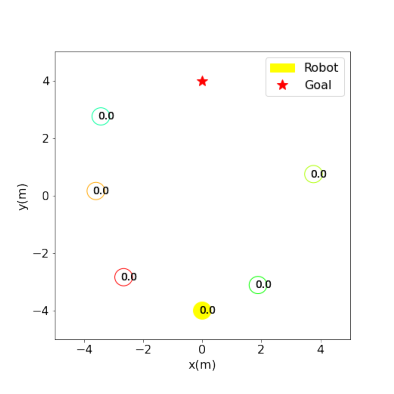

In [ ]:
import argparse
import configparser
import os
import torch
import numpy as np
import gym
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML

from gym.envs.registration import register

# delete if it's registered
env_name = 'CrowdSim-v0'
if env_name in gym.envs.registry.env_specs:
    del gym.envs.registry.env_specs[env_name]

register(
  id='CrowdSim-v0',
  entry_point=CrowdSim,
)

# Configure device
## Use the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Using device: %s', device)

# Configure environment
env = gym.make('CrowdSim-v0')
# Default configuration
env_config = { 'env': {'time_limit':25, 'time_step':0.25, 'val_size':100, 'test_size':500}, 
               'reward': {'success_reward':1, 'collision_penalty':-0.25, 'discomfort_dist':0.2, 'discomfort_penalty_factor':0.5},
               'sim': {'train_val_sim':'circle_crossing', 'test_sim':'circle_crossing', 'square_width':10, 'circle_radius':4, 'human_num':5},
               'humans': {'visible':True, 'policy':'orca', 'radius':0.3, 'v_pref':1},
               'robot': {'visible':False, 'policy':'orca', 'radius':0.3, 'v_pref':1}
             }
env.configure(env_config)

robot = Robot(env_config, 'robot')
env.set_robot(robot)

robot.print_info()

ob = env.reset('test')
done = False
last_pos = np.array(robot.get_position())
frames = []
while not done:
#   action = robot.act(ob)
#   ob, _, done, info = env.step(action)
  ob, _, done, info = env.step(ActionXY(*[np.random.uniform(-1.0, 1.0), np.random.uniform(-1.0, 1.0)]))
  current_pos = np.array(robot.get_position())
  #logging.debug('Speed: %.2f', np.linalg.norm(current_pos - last_pos) / robot.time_step)
  last_pos = current_pos
  frames.append(env.render(mode='rgb_array'))
  print('It takes %.2f seconds to finish. Final status is %s', env.global_time, info)

plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())

#### CADRL
Now let's create the first policy: [Collision Avoidance with Deep Reinforcement Learning (CADRL)](https://arxiv.org/pdf/1609.07845.pdf), based on the work of Y. F. Cheng, M. Liu, M.Everett, and J. P. How.

We will start by creating a function that allows us to easily define a MultiLayerPerceptron (MLP) in pytorch.

In [ ]:
import torch.nn as nn

def mlp(input_dim, mlp_dims, last_relu=False):
  layers = []
  mlp_dims = [input_dim] + mlp_dims
  for i in range(len(mlp_dims) - 1):
    layers.append(nn.Linear(mlp_dims[i], mlp_dims[i + 1]))
    if i != len(mlp_dims) - 2 or last_relu:
      layers.append(nn.ReLU())
  net = nn.Sequential(*layers)
  return net

# Dummy example to test the function
ex_mlp = mlp(5, [2, 3], True)
print (ex_mlp)

Sequential(
  (0): Linear(in_features=5, out_features=2, bias=True)
  (1): ReLU()
  (2): Linear(in_features=2, out_features=3, bias=True)
  (3): ReLU()
)


<!-- The objective is to find the optimal value function, this is a function that measures the "goodness" of a state or how rewarding a state is by a prediction of a future reward. -->

The objective is to find the Optimal Value Function.

We will start with the Value Network, in this case, the network is a single Multi-Layer Perceptron that receives as input the current state and predicts how rewarding this state is.


In [ ]:
class CADRL_ValueNetwork(nn.Module):
  def __init__(self, input_dim, mlp_dims):
    super().__init__()
    self.value_network = mlp(input_dim, mlp_dims)

  def forward(self, state):
    value = self.value_network(state)
    return value

# Dummy example to test the class
ex_cadrl_nw = CADRL_ValueNetwork(8, [2, 3, 5])
print (ex_cadrl_nw)

NameError: ignored

<img src="https://lh3.google.com/u/0/d/1lpcNyeEzN8xq9mky8xs-Y3ShmcCQj7hx=w3840-h1195-iv1" height=400>

Now let's create the class for the CADRL policy:

* `build_action_space`: Builds an action space of size speed_samples * rotation_samples + 1.
* `propagate`: Computes the next state of the agent given the current state and the action.
* `predict`: If we are in training phase, use the ε-greedy algorithm to decide if a random action should be taken or the prediction of the model. Then for each action in the action space, we get what would be the next state after applying the action and checks how good the state is by using the model, finally selects the action with maximum expected reward.

We follow the robot-centric parameterization, where the robot is located at the origin and the x-axis is pointing towards the robot's goal. The states of the robot and walking humans after transformation are:

$s = [d_g, v_{pref}, v_x, v_y, r]$,

$w_i = [p_x, p_y, v_x, v_y, r_i, d_i, r_i+r]$,

where $d_g = ||p-p_g||_2$ is the robot's distance to the goal and $d_i=||p-p_i||_2$ is the robot's distance to the neighbor $i$.

* `transform`: Take the state passed from agent and transform it to tensor for batch training (the coordinates in the state of each agent is transformed to robot-centric using the `rotate` method).
* `rotate`:  Transform the coordinate system to agent-centric (robot-centric), the robot is placed at the origin and the other agents orbit around it.

In [ ]:
#@title Implemented in Part III.1 { display-mode: "form" }
import torch
import torch.nn as nn
import numpy as np
import itertools

class CADRL(Policy):
  def __init__(self):
    super().__init__()
    self.name = 'CADRL'
    self.trainable = True
    self.multiagent_training = None
    self.epsilon = None
    self.gamma = None
    self.sampling = None
    self.speed_samples = None
    self.rotation_samples = None
    self.query_env = None
    self.action_space = None
    self.speeds = None
    self.rotations = None
    self.action_values = None
    self.with_om = None
    self.cell_num = None
    self.cell_size = None
    self.om_channel_size = None
    self.self_state_dim = 6
    self.human_state_dim = 7
    self.joint_state_dim = self.self_state_dim + self.human_state_dim

  def configure(self, config):
    self.set_common_parameters(config)
    mlp_dims = [int(x) for x in config['cadrl']['mlp_dims'].split(', ')]
    self.model = CADRL_ValueNetwork(self.joint_state_dim, mlp_dims)
    self.multiagent_training = config['cadrl']['multiagent_training']
    print('Policy: CADRL without occupancy map')

  def set_common_parameters(self, config):
    self.gamma = config['rl']['gamma']
    self.sampling = config['action_space']['sampling']
    self.speed_samples = config['action_space']['speed_samples']
    self.rotation_samples = config['action_space']['rotation_samples']
    self.query_env = config['action_space']['query_env']
    self.cell_num = config['om']['cell_num']
    self.cell_size = config['om']['cell_size']
    self.om_channel_size = config['om']['om_channel_size']

  def set_device(self, device):
    self.device = device
    self.model.to(device)

  def set_epsilon(self, epsilon):
    self.epsilon = epsilon

  def build_action_space(self, v_pref):
    """
    Action space consists of 25 uniformly sampled actions in permitted range and 25 randomly sampled actions.
    """
    speeds = [(np.exp((i + 1) / self.speed_samples) - 1) / (np.e - 1) * v_pref for i in range(self.speed_samples)]
    rotations = np.linspace(0, 2 * np.pi, self.rotation_samples, endpoint=False)

    action_space = [ActionXY(0, 0)]
    for rotation, speed in itertools.product(rotations, speeds):
      action_space.append(ActionXY(speed * np.cos(rotation), speed * np.sin(rotation)))

    self.speeds = speeds
    self.rotations = rotations
    self.action_space = action_space

  def propagate(self, state, action):
    if isinstance(state, ObservableState):
      # propagate state of humans
      next_px = state.px + action.vx * self.time_step
      next_py = state.py + action.vy * self.time_step
      next_state = ObservableState(next_px, next_py, action.vx, action.vy, state.radius)
    elif isinstance(state, FullState):
      # propagate state of current agent
      # perform action without rotation
      next_px = state.px + action.vx * self.time_step
      next_py = state.py + action.vy * self.time_step
      next_state = FullState(next_px, next_py, action.vx, action.vy, state.radius,
                     state.gx, state.gy, state.v_pref, state.theta)
    else:
      raise ValueError('Type error')

    return next_state

  def predict(self, state):
    """
    Input state is the joint state of robot concatenated by the observable state of other agents

    To predict the best action, agent samples actions and propagates one step to see how good the next state is
    thus the reward function is needed

    """
    if self.phase is None or self.device is None:
      raise AttributeError('Phase, device attributes have to be set!')
    if self.phase == 'train' and self.epsilon is None:
      raise AttributeError('Epsilon attribute has to be set in training phase')

    if self.reach_destination(state):
      return ActionXY(0, 0)
    if self.action_space is None:
      self.build_action_space(state.self_state.v_pref)

    probability = np.random.random()
    if self.phase == 'train' and probability < self.epsilon:
      max_action = self.action_space[np.random.choice(len(self.action_space))]
    else:
      self.action_values = list()
      max_min_value = float('-inf')
      max_action = None
      for action in self.action_space:
        next_self_state = self.propagate(state.self_state, action)
        ob, reward, done, info = self.env.onestep_lookahead(action)
        batch_next_states = torch.cat([torch.Tensor([next_self_state + next_human_state]).to(self.device)
                        for next_human_state in ob], dim=0)
        # VALUE UPDATE
        outputs = self.model(self.rotate(batch_next_states))
        min_output, min_index = torch.min(outputs, 0)
        # [Mig] Why the minimum value?
        min_value = reward + pow(self.gamma, self.time_step * state.self_state.v_pref) * min_output.data.item()
        self.action_values.append(min_value)
        if min_value > max_min_value:
          max_min_value = min_value
          max_action = action

    if self.phase == 'train':
      self.last_state = self.transform(state)

    return max_action

  def transform(self, state):
    """
    Take the state passed from agent and transform it to tensor for batch training

    :param state:
    :return: tensor of shape (len(state), )
    """
    assert len(state.human_states) == 1
    state = torch.Tensor(state.self_state + state.human_states[0]).to(self.device)
    state = self.rotate(state.unsqueeze(0)).squeeze(dim=0)
    return state

  def rotate(self, state):
    """
    Transform the coordinate to agent-centric.
    Input state tensor is of size (batch_size, state_length)

    """
    # 'px', 'py', 'vx', 'vy', 'radius', 'gx', 'gy', 'v_pref', 'theta', 'px1', 'py1', 'vx1', 'vy1', 'radius1'
    #  0   1    2   3    4    5   6    7     8     9   10    11   12     13
    batch = state.shape[0]
    dx = (state[:, 5] - state[:, 0]).reshape((batch, -1))
    dy = (state[:, 6] - state[:, 1]).reshape((batch, -1))
    rot = torch.atan2(state[:, 6] - state[:, 1], state[:, 5] - state[:, 0])

    dg = torch.norm(torch.cat([dx, dy], dim=1), 2, dim=1, keepdim=True)
    v_pref = state[:, 7].reshape((batch, -1))
    vx = (state[:, 2] * torch.cos(rot) + state[:, 3] * torch.sin(rot)).reshape((batch, -1))
    vy = (state[:, 3] * torch.cos(rot) - state[:, 2] * torch.sin(rot)).reshape((batch, -1))

    radius = state[:, 4].reshape((batch, -1))
    # set theta to be zero since it's not used
    theta = torch.zeros_like(v_pref)
    vx1 = (state[:, 11] * torch.cos(rot) + state[:, 12] * torch.sin(rot)).reshape((batch, -1))
    vy1 = (state[:, 12] * torch.cos(rot) - state[:, 11] * torch.sin(rot)).reshape((batch, -1))
    px1 = (state[:, 9] - state[:, 0]) * torch.cos(rot) + (state[:, 10] - state[:, 1]) * torch.sin(rot)
    px1 = px1.reshape((batch, -1))
    py1 = (state[:, 10] - state[:, 1]) * torch.cos(rot) - (state[:, 9] - state[:, 0]) * torch.sin(rot)
    py1 = py1.reshape((batch, -1))
    radius1 = state[:, 13].reshape((batch, -1))
    radius_sum = radius + radius1
    da = torch.norm(torch.cat([(state[:, 0] - state[:, 9]).reshape((batch, -1)), (state[:, 1] - state[:, 10]).
                  reshape((batch, -1))], dim=1), 2, dim=1, keepdim=True)
    new_state = torch.cat([dg, v_pref, theta, radius, vx, vy, px1, py1, vx1, vy1, radius1, da, radius_sum], dim=1)
    return new_state
  
ex_cadrl = CADRL()
print (ex_cadrl)

Let's add this policy to the _policy_factory_.

In [ ]:
policy_factory['cadrl'] = CADRL

#### SARL

We will build the base class for the network that uses joint state as input to value network, like SARL and LSTM_RL (not introduced in this tutorial).

Now we introduce the class for MultiHuman Reinforcement Learning (RL).

<img src="https://lh3.google.com/u/0/d/1R6Kvdzizn6t1w4K1pXfQ8upsTAeBU9F7=w3840-h1195-iv1" width=400>

This class will be the base class for our Selective Attention with Reinforcement Learning (SARL) model, it contains two main functions:

`compute_reward`: A reward function is specified to award the agent for reaching its goal, and penalize the agent for getting too close (uncomfortable distances) or colliding with the other agent.

$R_t(s_t^{jn}, a_t)=
\begin{cases}
  -0.25, & \text{if}\ d_t<0 \\
  -0.1+\frac{dt}{2}, & \text{else if}\ d_t < 0.2\\
  1, & \text{else if}\ \textbf{p}_f = \textbf{p}_g\\
  0, & \text{otherwise}
\end{cases}$

where $d_t$ is the minimum separation distance between the robot and the humans during period $[t-\Delta t, t]$.

`build_occupancy_maps`: Given a neighborhood of size $L$, we construct a $L \times L \times 3$ tensor $M_i$ centered at each human $i$ to encode the presence and velocities of neighbors.

$M_i(a, b, :) = \sum_{j \in N_i}{\delta_{ab}[x_j-x_i, y_j-y_i]w'_j}$,

where $w'_j = (v_{xj}, v_{yj}, 1)$ is a local state vector for human $j$, $\delta_{mn}[x_j-x_i, y_j-y_i]$ is an indicator function which equals to 1 only if the relative position $(\Delta x, \Delta y)$ is located in the cell $(a, b)$, $N_i$ is the set of neighboring humans around the $i^{th}$ person.

In [ ]:
import torch
import numpy as np

class MultiHumanRL(CADRL):
  def __init__(self):
    super().__init__()

  def predict(self, state):
    """
    A base class for all methods that takes pairwise joint state as input to value network.
    The input to the value network is always of shape (batch_size, # humans, rotated joint state length)

    """
    if self.phase is None or self.device is None:
      raise AttributeError('Phase, device attributes have to be set!')
    if self.phase == 'train' and self.epsilon is None:
      raise AttributeError('Epsilon attribute has to be set in training phase')

    if self.reach_destination(state):
      return ActionXY(0, 0)
    if self.action_space is None:
      self.build_action_space(state.self_state.v_pref)

    occupancy_maps = None
    probability = np.random.random()
    if self.phase == 'train' and probability < self.epsilon:
      max_action = self.action_space[np.random.choice(len(self.action_space))]
    else:
      self.action_values = list()
      max_value = float('-inf')
      max_action = None
      for action in self.action_space:
        next_self_state = self.propagate(state.self_state, action)
        if self.query_env:
          next_human_states, reward, done, info = self.env.onestep_lookahead(action)
        else:
          next_human_states = [self.propagate(human_state, ActionXY(human_state.vx, human_state.vy))
                     for human_state in state.human_states]
          reward = self.compute_reward(next_self_state, next_human_states)
        batch_next_states = torch.cat([torch.Tensor([next_self_state + next_human_state]).to(self.device)
                        for next_human_state in next_human_states], dim=0)
        rotated_batch_input = self.rotate(batch_next_states).unsqueeze(0)
        if self.with_om:
          if occupancy_maps is None:
            occupancy_maps = self.build_occupancy_maps(next_human_states).unsqueeze(0)
          rotated_batch_input = torch.cat([rotated_batch_input, occupancy_maps], dim=2)
        # VALUE UPDATE
        next_state_value = self.model(rotated_batch_input).data.item()
        value = reward + pow(self.gamma, self.time_step * state.self_state.v_pref) * next_state_value
        self.action_values.append(value)
        if value > max_value:
          max_value = value
          max_action = action
      if max_action is None:
        raise ValueError('Value network is not well trained. ')

    if self.phase == 'train':
      self.last_state = self.transform(state)

    return max_action


  def compute_reward(self, nav, humans):
    # collision detection
    dmin = float('inf')
    collision = False
    for i, human in enumerate(humans):
      dist = np.linalg.norm((nav.px - human.px, nav.py - human.py)) - nav.radius - human.radius
      if dist < 0:
        collision = True
        break
      if dist < dmin:
        dmin = dist

    # check if reaching the goal
    reaching_goal = np.linalg.norm((nav.px - nav.gx, nav.py - nav.gy)) < nav.radius
    if collision:
      reward = -0.25
    elif reaching_goal:
      reward = 1
    elif dmin < 0.2:
      reward = (dmin - 0.2) * 0.5 * self.time_step
    else:
      reward = 0

    return reward

  def transform(self, state):
    """
    Take the state passed from agent and transform it to the input of value network

    :param state:
    :return: tensor of shape (# of humans, len(state))
    """
    state_tensor = torch.cat([torch.Tensor([state.self_state + human_state]).to(self.device)
                  for human_state in state.human_states], dim=0)
    if self.with_om:
      occupancy_maps = self.build_occupancy_maps(state.human_states)
      state_tensor = torch.cat([self.rotate(state_tensor), occupancy_maps], dim=1)
    else:
      state_tensor = self.rotate(state_tensor)
    return state_tensor

  def input_dim(self):
    return self.joint_state_dim + (self.cell_num ** 2 * self.om_channel_size if self.with_om else 0)

  def build_occupancy_maps(self, human_states):
    """

    :param human_states:
    :return: tensor of shape (# human - 1, self.cell_num ** 2)
    """
    occupancy_maps = []
    for human in human_states:
      other_humans = np.concatenate([np.array([(other_human.px, other_human.py, other_human.vx, other_human.vy)])
                     for other_human in human_states if other_human != human], axis=0)
      other_px = other_humans[:, 0] - human.px
      other_py = other_humans[:, 1] - human.py
      # new x-axis is in the direction of human's velocity
      human_velocity_angle = np.arctan2(human.vy, human.vx)
      other_human_orientation = np.arctan2(other_py, other_px)
      rotation = other_human_orientation - human_velocity_angle
      distance = np.linalg.norm([other_px, other_py], axis=0)
      other_px = np.cos(rotation) * distance
      other_py = np.sin(rotation) * distance

      # compute indices of humans in the grid
      other_x_index = np.floor(other_px / self.cell_size + self.cell_num / 2)
      other_y_index = np.floor(other_py / self.cell_size + self.cell_num / 2)
      other_x_index[other_x_index < 0] = float('-inf')
      other_x_index[other_x_index >= self.cell_num] = float('-inf')
      other_y_index[other_y_index < 0] = float('-inf')
      other_y_index[other_y_index >= self.cell_num] = float('-inf')
      grid_indices = self.cell_num * other_y_index + other_x_index
      occupancy_map = np.isin(range(self.cell_num ** 2), grid_indices)
      if self.om_channel_size == 1:
        occupancy_maps.append([occupancy_map.astype(int)])
      else:
        # calculate relative velocity for other agents
        other_human_velocity_angles = np.arctan2(other_humans[:, 3], other_humans[:, 2])
        rotation = other_human_velocity_angles - human_velocity_angle
        speed = np.linalg.norm(other_humans[:, 2:4], axis=1)
        other_vx = np.cos(rotation) * speed
        other_vy = np.sin(rotation) * speed
        dm = [list() for _ in range(self.cell_num ** 2 * self.om_channel_size)]
        for i, index in np.ndenumerate(grid_indices):
          if index in range(self.cell_num ** 2):
            if self.om_channel_size == 2:
              dm[2 * int(index)].append(other_vx[i])
              dm[2 * int(index) + 1].append(other_vy[i])
            elif self.om_channel_size == 3:
              dm[2 * int(index)].append(1)
              dm[2 * int(index) + 1].append(other_vx[i])
              dm[2 * int(index) + 2].append(other_vy[i])
            else:
              raise NotImplementedError
        for i, cell in enumerate(dm):
          dm[i] = sum(dm[i]) / len(dm[i]) if len(dm[i]) != 0 else 0
        occupancy_maps.append([dm])

    return torch.from_numpy(np.concatenate(occupancy_maps, axis=0)).float()

We can now build the  policy, Selective Attention with Reinforcement Learning (SARL), [go to the paper](https://arxiv.org/abs/1809.08835) for details on the network, the main part we use in our Policy is the way the `ValueNetwork` is built.

In [ ]:
import torch
import torch.nn as nn
from torch.nn.functional import softmax

class SARL_ValueNetwork(nn.Module):
  def __init__(self, input_dim, self_state_dim, mlp1_dims, mlp2_dims, mlp3_dims, attention_dims, with_global_state,
         cell_size, cell_num):
    super().__init__()
    self.self_state_dim = self_state_dim
    self.global_state_dim = mlp1_dims[-1]
    self.mlp1 = mlp(input_dim, mlp1_dims, last_relu=True)
    self.mlp2 = mlp(mlp1_dims[-1], mlp2_dims)
    self.with_global_state = with_global_state
    if with_global_state:
      self.attention = mlp(mlp1_dims[-1] * 2, attention_dims)
    else:
      self.attention = mlp(mlp1_dims[-1], attention_dims)
    self.cell_size = cell_size
    self.cell_num = cell_num
    mlp3_input_dim = mlp2_dims[-1] + self.self_state_dim
    self.mlp3 = mlp(mlp3_input_dim, mlp3_dims)
    self.attention_weights = None

  def forward(self, state):
    """
    First transform the world coordinates to self-centric coordinates and then do forward computation
    :param state: tensor of shape (batch_size, # of humans, length of a rotated state)
    :return:
    """
    size = state.shape
    self_state = state[:, 0, :self.self_state_dim]
    mlp1_output = self.mlp1(state.view((-1, size[2])))
    mlp2_output = self.mlp2(mlp1_output)

    if self.with_global_state:
      # compute attention scores
      global_state = torch.mean(mlp1_output.view(size[0], size[1], -1), 1, keepdim=True)
      global_state = global_state.expand((size[0], size[1], self.global_state_dim)).\
        contiguous().view(-1, self.global_state_dim)
      attention_input = torch.cat([mlp1_output, global_state], dim=1)
    else:
      attention_input = mlp1_output
    scores = self.attention(attention_input).view(size[0], size[1], 1).squeeze(dim=2)

    # masked softmax
    # weights = softmax(scores, dim=1).unsqueeze(2)
    scores_exp = torch.exp(scores) * (scores != 0).float()
    weights = (scores_exp / torch.sum(scores_exp, dim=1, keepdim=True)).unsqueeze(2)
    self.attention_weights = weights[0, :, 0].data.cpu().numpy()

    # output feature is a linear combination of input features
    features = mlp2_output.view(size[0], size[1], -1)
    # for converting to onnx
    # expanded_weights = torch.cat([torch.zeros(weights.size()).copy_(weights) for _ in range(50)], dim=2)
    weighted_feature = torch.sum(torch.mul(weights, features), dim=1)

    # concatenate agent's state with global weighted humans' state
    joint_state = torch.cat([self_state, weighted_feature], dim=1)
    value = self.mlp3(joint_state)
    return value

Now let's define the class for our Selective Attention with Reinforcement Learning (SARL).

In [ ]:
class SARL(MultiHumanRL):
  def __init__(self):
    super().__init__()
    self.name = 'SARL'

  def configure(self, config):
    self.set_common_parameters(config)
    mlp1_dims = [int(x) for x in config['sarl']['mlp1_dims'].split(', ')]
    mlp2_dims = [int(x) for x in config['sarl']['mlp2_dims'].split(', ')]
    mlp3_dims = [int(x) for x in config['sarl']['mlp3_dims'].split(', ')]
    attention_dims = [int(x) for x in config['sarl']['attention_dims'].split(', ')]
    self.with_om = config['sarl']['with_om']
    with_global_state = config['sarl']['with_global_state']
    self.model = SARL_ValueNetwork(self.input_dim(), self.self_state_dim, mlp1_dims, mlp2_dims, mlp3_dims,
                  attention_dims, with_global_state, self.cell_size, self.cell_num)
    self.multiagent_training = config['sarl']['multiagent_training']
    if self.with_om:
      self.name = 'OM-SARL'
    print('Policy: {} {} global state'.format(self.name, 'w/' if with_global_state else 'w/o'))

  def get_attention_weights(self):
    return self.model.attention_weights

Let's add our policy to the policy_factory.

In [ ]:
policy_factory['sarl'] = SARL

## Train

For the training steps we need three classes.

<img src="https://lh3.google.com/u/0/d/128t_mKsp-xC1ld5U0iusVCODzQo993o7=w3840-h1820-iv2">

### Memory

First we need a class for the Replay Memory, the class `ReplayMemory` was already implemented in Part III. 2. It allows us to keep the record of the items we store in it, we can `push`, get items (`__getitem__`), check its length (`len`) and `clear` it.

In [ ]:
#@title Implemented in Part III.2. {display-mode: "form" }
from torch.utils.data import Dataset


class ReplayMemory(Dataset):
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = list()
        self.position = 0

    def push(self, item):
        # replace old experience with new experience
        if len(self.memory) < self.position + 1:
            self.memory.append(item)
        else:
            self.memory[self.position] = item
        self.position = (self.position + 1) % self.capacity

    def is_full(self):
        return len(self.memory) == self.capacity

    def __getitem__(self, item):
        return self.memory[item]

    def __len__(self):
        return len(self.memory)

    def clear(self):
      self.memory = list()

### Explorer

We also need a class that explores the environment (run the task for $k$ episodes), and updates the memory.

In [ ]:
#@title Implemented in Part III.1 { display-mode: "form" }
import copy
import torch

class Explorer(object):
    def __init__(self, env, robot, device, memory=None, gamma=None, target_policy=None):
        self.env = env
        self.robot = robot
        self.device = device
        self.memory = memory
        self.gamma = gamma
        self.target_policy = target_policy
        self.target_model = None

    def update_target_model(self, target_model):
        self.target_model = copy.deepcopy(target_model)

    # @profile
    def run_k_episodes(self, k, phase, update_memory=False, imitation_learning=False, episode=None):
        self.robot.policy.set_phase(phase)
        success_times = []
        collision_times = []
        timeout_times = []
        success = 0
        collision = 0
        timeout = 0
        too_close = 0
        min_dist = []
        cumulative_rewards = []
        collision_cases = []
        timeout_cases = []
        for i in range(k):
            ob = self.env.reset(phase)
            done = False
            states = []
            actions = []
            rewards = []
            while not done:
                action = self.robot.act(ob)
                ob, reward, done, info = self.env.step(action)
                states.append(self.robot.policy.last_state)
                actions.append(action)
                rewards.append(reward)

                if isinstance(info, Danger):
                    too_close += 1
                    min_dist.append(info.min_dist)

            if isinstance(info, ReachGoal):
                success += 1
                success_times.append(self.env.global_time)
            elif isinstance(info, Collision):
                collision += 1
                collision_cases.append(i)
                collision_times.append(self.env.global_time)
            elif isinstance(info, Timeout):
                timeout += 1
                timeout_cases.append(i)
                timeout_times.append(self.env.time_limit)
            else:
                raise ValueError('Invalid end signal from environment')

            if update_memory:
                if isinstance(info, ReachGoal) or isinstance(info, Collision):
                    # only add positive(success) or negative(collision) experience in experience set
                    self.update_memory(states, actions, rewards, imitation_learning)

            cumulative_rewards.append(sum([pow(self.gamma, t * self.robot.time_step * self.robot.v_pref)
                                           * reward for t, reward in enumerate(rewards)]))

        success_rate = success / k
        collision_rate = collision / k
        assert success + collision + timeout == k
        avg_nav_time = sum(success_times) / len(success_times) if success_times else self.env.time_limit

        extra_info = '' if episode is None else 'in episode {} '.format(episode)
        print('{:<5} {}has success rate: {:.2f}, collision rate: {:.2f}, nav time: {:.2f}, total reward: {:.4f}'.
                     format(phase.upper(), extra_info, success_rate, collision_rate, avg_nav_time,
                            average(cumulative_rewards)))
        if phase in ['val', 'test']:
            total_time = sum(success_times + collision_times + timeout_times) * self.robot.time_step
            print('Frequency of being in danger: %.2f and average min separate distance in danger: %.2f',
                         too_close / total_time, average(min_dist))

        print('Collision cases: ' + ' '.join([str(x) for x in collision_cases]))
        print('Timeout cases: ' + ' '.join([str(x) for x in timeout_cases]))

    def update_memory(self, states, actions, rewards, imitation_learning=False):
        if self.memory is None or self.gamma is None:
            raise ValueError('Memory or gamma value is not set!')

        for i, state in enumerate(states):
            reward = rewards[i]

            # VALUE UPDATE
            if imitation_learning:
                # define the value of states in IL as cumulative discounted rewards, which is the same in RL
                state = self.target_policy.transform(state)
                # value = pow(self.gamma, (len(states) - 1 - i) * self.robot.time_step * self.robot.v_pref)
                value = sum([pow(self.gamma, max(t - i, 0) * self.robot.time_step * self.robot.v_pref) * reward
                             * (1 if t >= i else 0) for t, reward in enumerate(rewards)])
            else:
                if i == len(states) - 1:
                    # terminal state
                    value = reward
                else:
                    next_state = states[i + 1]
                    gamma_bar = pow(self.gamma, self.robot.time_step * self.robot.v_pref)
                    value = reward + gamma_bar * self.target_model(next_state.unsqueeze(0)).data.item()
            value = torch.Tensor([value]).to(self.device)

            # # transform state of different human_num into fixed-size tensor
            # if len(state.size()) == 1:
            #     human_num = 1
            #     feature_size = state.size()[0]
            # else:
            #     human_num, feature_size = state.size()
            # if human_num != 5:
            #     padding = torch.zeros((5 - human_num, feature_size))
            #     state = torch.cat([state, padding])
            self.memory.push((state, value))


def average(input_list):
    if input_list:
        return sum(input_list) / len(input_list)
    else:
        return 0

### Trainer

And finally a class that helps us to train the model by batches or by epochs.

In [ ]:
#@title Implemented in Part III.2 {display-mode: "form" }
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import DataLoader


class Trainer(object):
    def __init__(self, model, memory, device, batch_size):
        """
        Train the trainable model of a policy
        """
        self.model = model
        self.device = device
        self.criterion = nn.MSELoss().to(device)
        self.memory = memory
        self.data_loader = None
        self.batch_size = batch_size
        self.optimizer = None

    def set_learning_rate(self, learning_rate):
        print('Current learning rate: %f' % learning_rate)
        self.optimizer = optim.SGD(self.model.parameters(), lr=learning_rate, momentum=0.9)

    def optimize_epoch(self, num_epochs):
        if self.optimizer is None:
            raise ValueError('Learning rate is not set!')
        if self.data_loader is None:
            self.data_loader = DataLoader(self.memory, self.batch_size, shuffle=True)
        average_epoch_loss = 0
        for epoch in range(num_epochs):
            epoch_loss = 0
            for data in self.data_loader:
                inputs, values = data
                inputs = Variable(inputs)
                values = Variable(values)

                self.optimizer.zero_grad()
                outputs = self.model(inputs)
                loss = self.criterion(outputs, values)
                loss.backward()
                self.optimizer.step()
                epoch_loss += loss.data.item()

            average_epoch_loss = epoch_loss / len(self.memory)
            # logging.debug('Average loss in epoch %d: %.2E', epoch, average_epoch_loss)

        return average_epoch_loss

    def optimize_batch(self, num_batches):
        if self.optimizer is None:
            raise ValueError('Learning rate is not set!')
        if self.data_loader is None:
            self.data_loader = DataLoader(self.memory, self.batch_size, shuffle=True)
        losses = 0
        for _ in range(num_batches):
            inputs, values = next(iter(self.data_loader))
            inputs = Variable(inputs)
            values = Variable(values)

            self.optimizer.zero_grad()
            outputs = self.model(inputs)
            loss = self.criterion(outputs, values)
            loss.backward()
            self.optimizer.step()
            losses += loss.data.item()

        average_loss = losses / num_batches
        # logging.debug('Average loss : %.2E', average_loss)

        return average_loss

Now we can define the training loop

In [ ]:
#@title Configuration of the environment { display-mode: "form" }
import sys
import os
import shutil
import torch
import gym

_output_dir = 'data/output_DLSchool_SARL'
_debug = False

make_new_dir = True
if os.path.exists(_output_dir):
  key = input('Output directory already exists! Overwrite the folder? (y/n)')
  if key == 'y':
    shutil.rmtree(_output_dir)
  else:
    make_new_dir = False
if make_new_dir:
  os.makedirs(_output_dir)
log_file = os.path.join(_output_dir, 'output.log')
il_weight_file = os.path.join(_output_dir, 'il_model.pth')
rl_weight_file = os.path.join(_output_dir, 'rl_model.pth')

# Configure device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Using device: %s', device)

# Configure policy
policy = policy_factory['cadrl']()
# Default configuration for robot
policy_config = { 'rl': {'gamma':0.9},
               'om': {'cell_num':4, 'cell_size':1, 'om_channel_size':3}, 
               'action_space': {'speed_samples':5, 'rotation_samples':16, 'sampling':'exponential', 'query_env':True},# Action space size is speed_samples * rotation_samples + 1
               'cadrl': {'mlp_dims':'150, 100, 100, 1', 'multiagent_training':False},
               'lstm_rl': {'mlp1_dims':'150, 100, 100, 50', 'mlp2_dims':'150, 100, 100, 1', 'multiagent_training':True, 'with_om':False, 'with_interaction_module':False},
               'srl': {'mlp1_dims':'150, 100, 100, 50', 'mlp2_dims':'150, 100, 100, 1', 'multiagent_training':True, 'with_om':False},
               'sarl': {'mlp1_dims':'150, 100', 'mlp2_dims':'100, 50', 'attention_dims':'100, 100, 1', 'mlp3_dims':'150, 100, 100, 1', 'multiagent_training':True, 'with_om':False, 'with_global_state':True}
             }
policy.configure(policy_config)
policy.set_device(device)

# Configure environment
env = gym.make('CrowdSim-v0')
# Default configuration
env_config = { 'env': {
                        'time_limit':25, 
                        'time_step':0.25, 
                        #'val_size':100, 
                        'val_size':10, 
                        #'test_size':500, 
                        'test_size':50
                      }, 
               'reward': {'success_reward':1, 'collision_penalty':-0.25, 'discomfort_dist':0.2, 'discomfort_penalty_factor':0.5},
               'sim': {'train_val_sim':'circle_crossing', 'test_sim':'circle_crossing', 'square_width':10, 'circle_radius':4, 'human_num':5},
               'humans': {'visible':True, 'policy':'orca', 'radius':0.3, 'v_pref':1},
               'robot': {'visible':False, 'policy':'cadrl', 'radius':0.3, 'v_pref':1}
             }
env.configure(env_config)

robot = Robot(env_config, 'robot')
env.set_robot(robot)

# read training parameters
train_config = { 'trainer': {
                             #'batch_size':100
                             'batch_size':10
                            }, 
                 'imitation_learning':{
                                       #'il_episodes':3000,
                                       'il_episodes':30,
                                       'il_policy':'orca',
                                       'il_epochs':50,
                                       'il_learning_rate':0.01,
                                       'safety_space':0.15
                                      },
                 'train': {'rl_learning_rate':0.001,
                           # number of batches to train at the end of training episode
                           #'train_batches':100,
                           'train_batches':2,
                           # training episodes in outer loop
                           #'train_episodes':10000,
                           'train_episodes':10,
                           # number of episodes sampled in one training episode
                           'sample_episodes':1,
                           #'target_update_interval':50,
                           'target_update_interval':2,
                           #'evaluation_interval':1000,
                           'evaluation_interval':2,
                           # the memory pool can roughly store 2K episodes, total size = episodes * 50
                           #'capacity':100000,
                           'capacity':100,
                           'epsilon_start':0.5,
                           'epsilon_end':0.1,
                           'epsilon_decay':4000,
                           #'checkpoint_interval':1000
                           'checkpoint_interval':2
                           }
               }

rl_learning_rate = train_config['train']['rl_learning_rate']
train_batches = train_config['train']['train_batches']
train_episodes = train_config['train']['train_episodes']
sample_episodes = train_config['train']['sample_episodes']
target_update_interval = train_config['train']['target_update_interval']
evaluation_interval = train_config['train']['evaluation_interval']
capacity = train_config['train']['capacity']
epsilon_start = train_config['train']['epsilon_start']
epsilon_end = train_config['train']['epsilon_end']
epsilon_decay = train_config['train']['epsilon_decay']
checkpoint_interval = train_config['train']['checkpoint_interval']

# Configure trainer and explorer
memory = ReplayMemory(capacity)
model = policy.get_model()
batch_size = train_config['trainer']['batch_size']
trainer = Trainer(model, memory, device, batch_size)
explorer = Explorer(env, robot, device, memory, policy.gamma, target_policy=policy)

In [ ]:
## Remember to run the code above (Configuration of the environment) everytime you want to run this snippet of code

# imitation learning
il_episodes = train_config['imitation_learning']['il_episodes']
il_policy = train_config['imitation_learning']['il_policy']
il_epochs = train_config['imitation_learning']['il_epochs']
il_learning_rate = train_config['imitation_learning']['il_learning_rate']
trainer.set_learning_rate(il_learning_rate)
if robot.visible:
  safety_space = 0
else:
  safety_space = train_config['imitation_learning']['safety_space']
il_policy = policy_factory[il_policy]()
il_policy.multiagent_training = policy.multiagent_training
il_policy.safety_space = safety_space
robot.set_policy(il_policy)
explorer.run_k_episodes(il_episodes, 'train', update_memory=True, imitation_learning=True)
trainer.optimize_epoch(il_epochs)
torch.save(model.state_dict(), il_weight_file)
print('Finish imitation learning. Weights saved.')
print('Experience set size: %d/%d', len(memory), memory.capacity)
explorer.update_target_model(model)

# reinforcement learning
policy.set_env(env)
robot.set_policy(policy)
robot.print_info()
trainer.set_learning_rate(rl_learning_rate)
# fill the memory pool with some RL experience
episode = 0
while episode < train_episodes:
  if _resume:
    epsilon = epsilon_end
  else:
    if episode < epsilon_decay:
      epsilon = epsilon_start + (epsilon_end - epsilon_start) / epsilon_decay * episode
    else:
      epsilon = epsilon_end
  robot.policy.set_epsilon(epsilon)

  # evaluate the model
  if episode % evaluation_interval == 0:
    explorer.run_k_episodes(env.case_size['val'], 'val', episode=episode)

  # sample k episodes into memory and optimize over the generated memory
  explorer.run_k_episodes(sample_episodes, 'train', update_memory=True, episode=episode)
  trainer.optimize_batch(train_batches)
  episode += 1

  if episode % target_update_interval == 0:
    explorer.update_target_model(model)

  if episode != 0 and episode % checkpoint_interval == 0:
    torch.save(model.state_dict(), rl_weight_file)

# final test
explorer.run_k_episodes(env.case_size['test'], 'test', episode=episode)

## Test

Instead we can use the weights of an already trained architecture, and directly test our policy.

In [ ]:
#@title Configuration of the environment { display-mode: "form" }
import argparse
import configparser
import os
import torch
import numpy as np
import gym
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML

from gym.envs.registration import register

# delete if it's registered
env_name = 'CrowdSim-v0'
if env_name in gym.envs.registry.env_specs:
    del gym.envs.registry.env_specs[env_name]

register(
  id='CrowdSim-v0',
  entry_point=CrowdSim,
)

# Load the weights of the model
# [Mig]
model_weights = 'sarl_rl_model.pth'

# Configure device
## Use the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Using device: %s', device)

# Configure policy
policy = policy_factory['sarl']()
# Default configuration for robot
policy_config = { 'rl': {'gamma':0.9},
               'om': {'cell_num':4, 'cell_size':1, 'om_channel_size':3}, 
               'action_space': {'speed_samples':5, 'rotation_samples':16, 'sampling':'exponential', 'query_env':True},# Action space size is speed_samples * rotation_samples + 1
               'cadrl': {'mlp_dims':'150, 100, 100, 1', 'multiagent_training':False},
               'lstm_rl': {'mlp1_dims':'150, 100, 100, 50', 'mlp2_dims':'150, 100, 100, 1', 'multiagent_training':True, 'with_om':False, 'with_interaction_module':False},
               'srl': {'mlp1_dims':'150, 100, 100, 50', 'mlp2_dims':'150, 100, 100, 1', 'multiagent_training':True, 'with_om':False},
               'sarl': {'mlp1_dims':'150, 100', 'mlp2_dims':'100, 50', 'attention_dims':'100, 100, 1', 'mlp3_dims':'150, 100, 100, 1', 'multiagent_training':True, 'with_om':False, 'with_global_state':True}
             }
policy.configure(policy_config)
policy.get_model().load_state_dict(torch.load(model_weights))

# Configure environment
env = gym.make('CrowdSim-v0')
# Default configuration
env_config = { 'env': {'time_limit':25, 'time_step':0.25, 'val_size':100, 'test_size':500}, 
               'reward': {'success_reward':1, 'collision_penalty':-0.25, 'discomfort_dist':0.2, 'discomfort_penalty_factor':0.5},
               'sim': {'train_val_sim':'circle_crossing', 'test_sim':'circle_crossing', 'square_width':10, 'circle_radius':4, 'human_num':5},
               'humans': {'visible':True, 'policy':'orca', 'radius':0.3, 'v_pref':1},
               'robot': {'visible':False, 'policy':'sarl', 'radius':0.3, 'v_pref':1}
             }
env.configure(env_config)

robot = Robot(env_config, 'robot')
robot.set_policy(policy)
env.set_robot(robot)

policy.set_phase('test')
policy.set_device(device)
policy.set_env(env)

robot.print_info()

In [ ]:
## Remember to run the code above (Configuration of the environment) everytime you want to run this snippet of code

ob = env.reset('test')
done = False
last_pos = np.array(robot.get_position())
frames = []
while not done:
  action = robot.act(ob)
  ob, _, done, info = env.step(action)
  current_pos = np.array(robot.get_position())
  # logging.debug('Speed: %.2f', np.linalg.norm(current_pos - last_pos) / robot.time_step)
  last_pos = current_pos
  frames.append(env.render(mode='rgb_array'))
print('It takes %.2f seconds to finish. Final status is %s', env.global_time, info)

plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
HTML(ani.to_jshtml())